# Regression UV

In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# Data preprocessing
https://sklearn-genetic-opt.readthedocs.io/en/stable/index.html

In [4]:
#!pip install sklearn-genetic-opt

In [5]:
#!pip install xgboost

### Models

In [6]:
from sklearn.linear_model import *
import sklearn.ensemble
import sklearn.neighbors
import sklearn.neural_network
from xgboost import XGBRegressor
import lightgbm as lgb
from sklearn_genetic import GASearchCV
from sklearn_genetic.space import Categorical, Integer, Continuous
from sklearn.model_selection import StratifiedKFold, KFold

from scipy import stats
import numpy as np


models_default = [
    (   sklearn.ensemble.AdaBoostRegressor(random_state=123),
        {}
    ),
    (   sklearn.ensemble.BaggingRegressor(random_state=123),
        {}
    ),
    (   sklearn.ensemble.ExtraTreesRegressor(random_state=123),
        {}
    ),
    (   sklearn.ensemble.GradientBoostingRegressor(random_state=123),
        {}
    ), #  LightGBM #  LightGBM
    (
        lgb.LGBMRegressor(random_state=123),
        {}
    ),
    (
        sklearn.ensemble.RandomForestRegressor(random_state=123),
        {}
    ),
    (   sklearn.linear_model.LassoCV(random_state=123),  #max_iter=3000
        {}
    ),
    (   sklearn.linear_model.ElasticNetCV(random_state=123), #max_iter=3000
        {}
    ),             #Include Cross-Validation
    (   sklearn.linear_model.LinearRegression(),
        {}
    ),
    (   sklearn.linear_model.RANSACRegressor(LinearRegression(),max_trials=100, min_samples=0.95, residual_threshold=None, random_state=123),
        {}
    ),
    (
        XGBRegressor(random_state=123,n_jobs=-1),
        {}
    ),
    (
        sklearn.neighbors.KNeighborsRegressor(),
        {}
    ),
    (
        sklearn.linear_model.SGDRegressor(random_state=123),
        {}
    ),
    (
        sklearn.linear_model.ARDRegression(),
        {}
    ),
    (
        sklearn.linear_model.BayesianRidge(),
        {}
    ),
    (
        sklearn.neural_network.MLPRegressor(random_state=123),
        #sklearn.neural_network.MLPRegressor(hidden_layer_sizes=(64,64,64), max_iter=500)
        {}
    )
]

models_genetic = [
    (   sklearn.ensemble.AdaBoostRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50,200),
            'rg__learning_rate': Continuous(0.01,1, distribution='log-uniform'),
            'rg__loss':Categorical(['linear','square', 'exponential'])
        }
    ),
    (   sklearn.ensemble.BaggingRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__max_samples': Continuous(0.1, 1.0, distribution='log-uniform'),
            'rg__max_features': Continuous(0.1, 1.0, distribution='log-uniform'),
            'rg__bootstrap': Categorical([True, False]),
            'rg__bootstrap_features': Categorical([True, False]),
        }
    ),
    (   sklearn.ensemble.ExtraTreesRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__bootstrap': Categorical([True, False]),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)         
        }
    ),
    (   sklearn.ensemble.GradientBoostingRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__loss': Categorical(['squared_error', 'absolute_error']),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)   
        }
    ), #  LightGBM
    (
        lgb.LGBMRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__learning_rate': Continuous(0.01, 0.3, distribution='log-uniform'),
            'rg__max_depth': Integer(10, 30),
            'rg__num_leaves': Integer(20, 100),
            'rg__min_child_samples': Integer(5, 20),
            'rg__subsample': Continuous(0.7, 1.0, distribution='uniform'),
            'rg__colsample_bytree': Continuous(0.7, 1.0, distribution='uniform'),
            'rg__reg_alpha': Continuous(1e-3, 1.0, distribution='log-uniform'), # Regularización L1
            'rg__reg_lambda': Continuous(1e-3, 1.0, distribution='log-uniform'),# Regularización L2
        }
    ),
    (
        sklearn.ensemble.RandomForestRegressor(random_state=123),
          {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 1000),
            'rg__bootstrap': Categorical([True, False]),
            'rg__criterion': Categorical(['squared_error', 'absolute_error', 'friedman_mse', 'poisson']),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)
          }
    ),  
    (   sklearn.linear_model.ElasticNetCV(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            #'rg__alphas': Categorical([np.logspace(-4, 4, num=50)]),
             #'rg__alphas': [Continuous(0.1, 10.0, distribution='log-uniform')],
            'rg__l1_ratio': Continuous(0.0, 1.0),
            'rg__cv': Categorical([3, 5, 10]),
            'rg__max_iter': Integer(1000, 5000),
            'rg__tol': Continuous(1e-6, 1e-2, distribution='log-uniform')   
        }
    ),             #Include Cross-Validation     
    (   sklearn.linear_model.LassoCV(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__alphas': Categorical([np.logspace(-4, 4, num=50)]),
            #'rg__alphas': Continuous(1e-4, 1e4, distribution='log-uniform'),
            #np.geomspace(1e-8, 1e-1, 100)
            'rg__cv': Categorical([3, 5, 10]),
            'rg__max_iter': Integer(1000, 5000),
            'rg__tol': Continuous(1e-6, 1e-2, distribution='log-uniform')
        }
    ),
    (   sklearn.linear_model.LinearRegression(),
        {
            'pca__n_components': Continuous(0.9, 0.99)
        }
    ),
    (   sklearn.linear_model.RANSACRegressor(LinearRegression()),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__max_trials': Integer(50, 200),
            'rg__min_samples': Continuous(0.5, 1.0),
            'rg__residual_threshold': Continuous(1.0, 10.0)
        }
    ),
    (
        XGBRegressor(random_state=123),
           {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__learning_rate': Continuous(0.05, 0.5),
            'rg__subsample': Categorical([0.5, 0.75, 1]),
            'rg__max_depth': Categorical([3, 6, 10]),
           }
    ),
    (
        sklearn.neighbors.KNeighborsRegressor(),
           {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_neighbors': Integer(1, 20),
            'rg__weights': Categorical(['uniform', 'distance']),
            'rg__p': Integer(1, 2)
           }
    ),
    (
        sklearn.linear_model.SGDRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__penalty': Categorical(['l2', 'l1', 'elasticnet']),
            'rg__loss': Categorical(['squared_error', 'huber','epsilon_insensitive']),
            'rg__alpha': Continuous(0.0001, 0.1),
            'rg__learning_rate': Categorical(['constant', 'optimal', 'invscaling'])
        }
    ),
    (
        sklearn.linear_model.ARDRegression(),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_iter': Integer(300, 1000),
            'rg__alpha_1': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__alpha_2': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__lambda_1': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__lambda_2': Continuous(1e-8, 1e-2, distribution='log-uniform')
        }
    ),
    (
        sklearn.linear_model.BayesianRidge(),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_iter': Integer(300, 1000),
            'rg__tol': Continuous(1e-6, 1e-2, distribution='log-uniform'),  
            'rg__alpha_1': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__alpha_2': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__lambda_1': Continuous(1e-8, 1e-2, distribution='log-uniform'),
            'rg__lambda_2': Continuous(1e-8, 1e-2, distribution='log-uniform')
        }
    ),
    (
        sklearn.neural_network.MLPRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__activation': Categorical(['identity', 'logistic', 'tanh', 'relu']),
            'rg__learning_rate': Categorical(['constant', 'adaptive', 'invscaling']),
            'rg__hidden_layer_sizes': Categorical([(901, 528, 128, 64, 1), (528, 256, 64), (100, 100), (100,)]),
            'rg__max_iter': Categorical([100, 500, 1000])
        }
    )
        ]

models_randomsearch = [
    (
        sklearn.ensemble.RandomForestRegressor(),
        {
               'bootstrap': [True, False],
               'max_depth':stats.uniform(10,50),
               'max_features':['auto','sqrt'],
               'min_samples_split': [2, 3, 4, 5],
               'min_samples_leaf': [1, 2, 3]
        }
    ),
    (
           XGBRegressor(),
           {
               'n_estimators': [100,300],
               'learning_rate': [0.1,0.05],
               'subsample': [0.75],
               'colsample_bytree': [1],
               'max_depth': [3,4,5],
               'gamma': [0]
           }
    ),
    (
           sklearn.neighbors.KNeighborsRegressor(),
           {
               'n_neighbors': [5, 10, 15, 20],
                'weights': ['uniform', 'distance']
           }
    ),
    (
        sklearn.linear_model.SGDRegressor(),
           {
               'penalty':['l2','l1','elasticnet'],
               'loss':['squared_loss','huber'],
               'alpha':np.logspace(-5,1,25),
               'learning_rate': ['constant', 'optimal', 'invscaling']
           }
    ),
    (
        sklearn.linear_model.ARDRegression(),
           {
               'alpha_init':[1-1.9],
               'lambda_init': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9]
           }
    ),
    (
        sklearn.linear_model.BayesianRidge(),
           {
               'alpha_1': [1-1.9],
               'alpha_2': [1-1.9],
               'lambda_1': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9],
               'lambda_2': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9]
           }
    ),
    (
        sklearn.neural_network.MLPRegressor(random_state=0),
           {
               'activation': ['identity', 'logistic', 'tanh', 'relu'],
               'learning_rate' : ['constant', 'optimal', 'invscaling'],
               'hidden_layer_sizes' : [(901,528,128,64,1),(528,256,64),(100,100),(100,)],
               'max_iter': 500
           }
    )
]


models_gridsearch = [
    (
        sklearn.ensemble.RandomForestRegressor(),
        {
               'n_estimators': [100, 200, 300, 400, 500],
               'bootstrap': [True, False],
               'max_depth':[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
               'max_features':['auto','sqrt'],
               'min_samples_split': [2, 3, 4, 5, 10],
               'min_samples_leaf': [1, 2, 3, 5],
               'max_features': ['auto', 'sqrt', 'log2']
        }
    ),
    (
           XGBRegressor(),
           {
               'n_estimators': [100,300],
               'learning_rate': [0.1,0.05],
               'subsample': [0.75],
               'colsample_bytree': [1],
               'max_depth': [3,4,5],
               'gamma': [0]
           }
    ),
    (
           sklearn.neighbors.KNeighborsRegressor(),
           {
               'n_neighbors': [5, 10, 15, 20],
                'weights': ['uniform', 'distance']
           }
    ),
    (
        sklearn.linear_model.SGDRegressor(),
           {
               'penalty':['l2','l1','elasticnet'],
               'loss':['squared_loss','huber'],
               'alpha':np.logspace(-5,1,25),
               'learning_rate': ['constant', 'optimal', 'invscaling']
           }
    ),
    (
        sklearn.linear_model.ARDRegression(),
           {
               'alpha_init':[1-1.9],
               'lambda_init': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9]
           }
    ),
    (
        sklearn.linear_model.BayesianRidge(),
           {
               'alpha_1': [1-1.9],
               'alpha_2': [1-1.9],
               'lambda_1': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9],
               'lambda_2': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-9]
           }
    ),
    (
        sklearn.neural_network.MLPRegressor(random_state=0),
           {
               'activation': ['identity', 'logistic', 'tanh', 'relu'],
               'learning_rate' : ['constant', 'optimal', 'invscaling'],
               'hidden_layer_sizes' : [(901,528,128,64,1),(528,256,64),(100,100),(100,)],
               'max_iter': 500
           }
    )
]


c:\Users\jhoyo\anaconda3\envs\py310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
model_name_map = {
    'AdaBoostRegressor': "AdaBoost",
    'BaggingRegressor': "Bagging",
    'ExtraTreesRegressor': "Extra-Trees",
    'GradientBoostingRegressor': "Gradient Boosting",
    'LGBMRegressor': "LightGBM",
    'RandomForestRegressor': "Random Forest",
    'LassoCV': "Lasso CV",
    'ElasticNetCV': "ElasticNet CV",
    'LinearRegression': "Linear Regression",
    'RANSACRegressor': "RANSAC",
    'XGBRegressor': "XGBoost",
    'KNeighborsRegressor': "K-Nearest Neighbors",
    'SGDRegressor': "SGD",
    'ARDRegression': "ARD",
    'BayesianRidge': "Bayesian Ridge",
    'MLPRegressor': "MLP Neural Network"
}

### Classes

In [28]:
from ctypes.util import find_library
#from symbol import except_clause
import sklearn.model_selection
import sklearn.metrics
import json
import joblib
from sklearn_genetic.plots import plot_fitness_evolution, plot_search_space
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
from scipy.signal import savgol_filter
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import time
import os

import logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

np.random.seed(11)

decimals = 2

class Encoder(json.JSONEncoder):
    def default(self, obj): # pylint: disable=E0202
        if isinstance(obj, np.bool_):
            return bool(obj)
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        elif isinstance(obj, sklearn.tree.DecisionTreeClassifier):
            return obj.__class__.__name__
        else:
            return super(Encoder, self).default(obj)

class FusionData:
    def __init__(self, data_consolidated_folder ) -> None:
        # Buscamos archivos
        self.dataDF = pd.DataFrame([])
        self.data = pd.DataFrame([])
        self.data_consolidated_folder = data_consolidated_folder
        self.newlist_samples = []
        for filename in os.listdir(self.data_consolidated_folder):
            if (filename.endswith("csv")):
                self.newlist_samples.append(self.data_consolidated_folder+filename)
        logger.info('Los archivos csv son {}'.format(self.newlist_samples))

    def string_to_list(self,row):
        vector = row[1:-1].split(',')
        return [float(p) for p in vector]

    def fusion(self, columns, include_std='No', ndecimals=decimals):
        """Joint csv and remove duplicates \n
        columns = Etiquetas de las columnas a leer \n
        include_std = Yes, No - define si generar o no numeros aleatorios uniformes entre [-std, std] y sumarlos al valor de la media de band gap \n
        n_decimals = en caso que include_std = Yes, limita los decilas a generar
        """
        self.dataDF = pd.DataFrame([])
        # Definir dataframe
        for file in self.newlist_samples:
            df = pd.read_csv(file)
            # Leo la primer hoja
            try:
                if include_std=='Yes':
                    if 'band_gap_std' in df.columns:
                        df = df[columns]
                        random_std = np.random.uniform(-1,1,df.shape[0])* df['band_gap_std']
                        df['band_gap_mean'] += random_std
                        df['band_gap_mean'] = df['band_gap_mean'].round(ndecimals)
                        df.drop(columns=['band_gap_std'], inplace=True)
                    else:
                        df = df[columns[:-1]]
                else:
                    df = df[columns]
                    df = df.drop_duplicates()
                self.dataDF =  pd.concat([self.dataDF, df], ignore_index=True)
                logger.info('{} cargado'.format(file))
            except KeyError as e:
                logger.info("{} error: {}".format(file,e))
            except ValueError as e:
                logger.info("{} error: {}".format(file,e))


    def round_decimals(self, ndecimals = decimals):
        self.data['band_gap_mean'] = self.data['band_gap_mean'].round(ndecimals)

    def write(self,data_location):
        """Save to csv"""
        self.data.dropna(inplace=True)
        logger.info(self.data.columns)
        self.data.to_csv(data_location+'data.csv',index=False)

class Splitter:
    def __init__(self,data, label = "band_gap_mean", ndecimals = decimals):
        if isinstance(data, pd.DataFrame):
            self.data  = data
            #self.features = self.data.iloc[:,:-1].astype(float).round(ndecimals)
            self.features = self.data.iloc[:,:-1].astype(float)
            self.label = self.data[label].astype(float).round(ndecimals)
        else:
            self.data = None
    def split(self, location, validation = False, stratify = None):
        self.features_train, self.features_test, self.label_train, self.label_test = sklearn.model_selection.train_test_split(self.features, self.label, test_size=0.20, random_state=123, stratify=stratify)

        if validation == True:
            self.features_train, self.features_val, self.label_train, self.label_val = sklearn.model_selection.train_test_split(self.features_train, self.label_train, test_size=0.15, random_state=123, stratify=stratify)
            self.features_val.to_csv(location + 'features_val.csv', index = False)
            self.label_val.to_csv(location + 'label_val.csv', index = False)

        self.features_train.to_csv(location + 'features_train.csv', index = False)
        self.features_test.to_csv(location + 'features_test.csv', index = False)
        self.label_train.to_csv(location + 'label_train.csv', index = False, header = True)
        self.label_test.to_csv(location + 'label_test.csv', index = False, header = True)

class Preprocessing:
    def __init__(self, data):
        self.data = data
    def diferentiation(self, data):
        if data is None:
            data = self.data
        self.data_diff = data.diff(axis=1)
        self.data_diff.fillna(0, inplace=True)
    def filtering(self, data, window=51, porder=1):
        data_filtered = savgol_filter(data.iloc[:,:-2], window_length=window, polyorder=porder)
        self.data_filtered = pd.DataFrame(columns=data.columns, data=np.concatenate((data_filtered, data.iloc[:,-2:].values), axis=1) )
    def fill(self, data, s, size=3):
        for i in range(s,0,-1):
            fill = data.iloc[:,i:i+size].mean(axis=1)
            data.iloc[:,i-1]= fill
        return data
    def augmentation(self, data, shift=50, upper_limit = 5.6):
        data_shift = data
        data_augmented = data
        delta_bg = round(data_shift.columns[1] -data_shift.columns[0], 3)
        while data_shift.shape[0]>0:
            data_shift = data_shift[data_shift['band_gap_mean']<=upper_limit]
            data_shift = pd.concat([self.fill(data_shift.iloc[:,:-1].shift(shift, axis=1), shift, 3), data_shift['band_gap_mean'] + delta_bg*shift ], axis=1)
            data_augmented = pd.concat([data_augmented, data_shift], axis=0).reset_index(drop=True)
        return data_augmented


class BGModelDev:
#Clase encargada de crear y optimizar los modelos de ML
    def __init__(self, features_train, label_train, models = models_default, ndecimals=decimals):
        self.features_train = pd.read_csv(features_train)
        self.label_train = pd.read_csv(label_train)
        #self.train = np.round(np.concatenate([self.features_train, self.label_train], axis=1), decimals=decimals) #to speed up the training we convert it to numpy
        self.train = np.concatenate([self.features_train, self.label_train], axis=1)
        self.models = models
    def grid_search(self,report_location, n_jobs=-1, models = models_randomsearch, scoring = "r2"):
        self.gs_scores = {}
        for model in models:
            model_name = model[0].__class__.__name__
            estimator = model[0]
            grid = model[1]
            features = self.train[:,:-1]
            label = self.train[:,-1]
            if scoring == "r2":
                scorer = "r2"
            if scoring == 'neg_mean_absolute_percentage_error':
                scorer = sklearn.metrics.mean_absolute_percentage_error
            grid_search = sklearn.model_selection.RandomizedSearchCV(
            estimator=estimator,
            param_distributions=grid,
            scoring=scorer,
            n_jobs=n_jobs,
            verbose=1,
            random_state=11,
            return_train_score=True,
            cv=5
            )
            grid_search.fit(features, label)
            self.gs_scores[model_name] = [grid_search.cv_results_, grid_search.best_params_, grid_search.best_score_]
            with open(report_location + 'grid_search_'+ model_name + '.json', 'w', encoding='utf-8') as json_file:
                     json.dump(self.gs_scores[model_name], json_file, indent=2, ensure_ascii=False, cls=Encoder)
    def genetic_search(self, report_location, n_jobs=-1, models = models_genetic, score='', generations=10, pipeline=False):
        """Includes pipeline (StandardScaler and PCA)"""
        self.gs_scores={}
        self.cv_scores={}
        self.summary_cv_scores=[]
        self.sucessful_models=[]
        features = self.train[:,:-1]
        label = self.train[:,-1]
        # Our cross-validation strategy (it could be just an int)
        cv = KFold(n_splits=5, random_state=11, shuffle=True)
        for model in self.models:
            model_name = model[0].__class__.__name__
            grid = model[1]
            # The main class from sklearn-genetic-opt
            if pipeline:
                estimator = Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA()),('rg', model[0])])
            else:
                estimator = model[0]
            attempts = 0
            success = False
            genetic_search = {}
            while attempts < 2 and not success:
                try:
                    genetic_search = GASearchCV(estimator = estimator,
                                    cv=cv,
                                    generations = generations,
                                    keep_top_k=2,
                                    scoring= score,
                                    param_grid = grid,
                                    n_jobs=n_jobs,
                                    verbose=True)
                    genetic_search.fit(features, label)
                    estimator.set_params(**genetic_search.best_params_)
                    success = True
                except Exception as e:
                    print(f"{model_name} did not do a genetic search ****** Attempt {attempts + 1}")
                    print(f"Exception: {e}")
                    attempts+=1
            
            if success:
                self.sucessful_models.append(model)
                scoring = {
                                'mean_absolute_error':'neg_mean_absolute_error',
                                'mean_absolute_percentage_error':'neg_mean_absolute_percentage_error',
                                'mean_squared_error':'neg_mean_squared_error',
                                'root_mean_squared_error':'neg_root_mean_squared_error',
                                'r2':'r2',
                                'explained_variance':'explained_variance'
                            }
                cv_scores = sklearn.model_selection.cross_validate(estimator, features, label, cv=cv, scoring=scoring)
                self.cv_scores[model_name] = cv_scores
                score_row = {'model': model_name}
                for metric in scoring.keys():
                    mean_val = np.mean(cv_scores['test_' + metric])
                    std_val = np.std(cv_scores['test_' + metric])
                    score_row[metric] = f"{mean_val:.4f} ± {std_val:.4f}"
                self.summary_cv_scores.append(score_row)
                pd.DataFrame(self.summary_cv_scores).to_excel(report_location+'cv_summary_scores.xlsx', index=False, engine='openpyxl')
                            
                print(model_name)
                self.gs_scores[model_name] = [genetic_search.cv_results_, genetic_search.best_params_, genetic_search.best_score_]
                with open(report_location + 'genetic_search_'+ model_name + '.json', 'w', encoding='utf-8') as json_file:
                        json.dump(self.gs_scores[model_name], json_file, indent=2, ensure_ascii=False, cls=Encoder)
                
                plt.figure()
                plot_fitness_evolution(genetic_search)
                #plt.show()
                plt.savefig(report_location + model_name +'.png')
                plt.figure()
                plot_search_space(genetic_search)
                #plt.show()
                plt.savefig(report_location + model_name +'search_space.png')
            else:
                print(f"{model_name} failed after 2 attempts")
                
    def train_cv(self, search_results_location, type, report_location, n_jobs=-1):
        """
        type: grid, genetic o random
        """
        print('**** Training with CrossValidations ****')
        self.cv_scores={}
        features = self.train[:,:-1]
        label = self.train[:,-1]
        for model in self.models:
            model_name = model[0].__class__.__name__
            estimator = model[0]
            try:
                with open(search_results_location + type + '_search_'+ model_name + '.json') as read_file:
                    data = json.load(read_file)
                best_hp = data[1]
                estimator.set_params(**best_hp)
            except:
                print(model_name + " did not do a hyperparameter search")
            finally:
                print('Model: '+ model_name)
                cv_scores = sklearn.model_selection.cross_validate(
                    estimator=estimator,
                    X=features,
                    y=label,
                    cv=5,
                    n_jobs=n_jobs,
                    scoring={
                        'mean_absolute_error':'neg_mean_absolute_error',
                        'mean_absolute_percentage_error':'neg_mean_absolute_percentage_error',
                        'mean_squared_error':'neg_mean_squared_error',
                        'r2':'r2',
                        'explained_variance':'explained_variance'
                    },                                                   #sklearn.metrics.SCORERS.keys()
                    verbose=1,
                    return_train_score=True
                )
            self.cv_scores[model_name] = cv_scores
            with open(report_location + 'cross_val_' + model_name + '.json', 'w', encoding = 'utf-8') as json_file:
                json.dump(self.cv_scores[model_name], json_file, indent=2, ensure_ascii=False, cls=Encoder)
    def train_best_models(self,search_results_location,type,models_location,n_jobs=-1, pipeline=False):
        features = self.train[:,:-1]
        label = self.train[:,-1]
        for model in self.models:
            model_name = model[0].__class__.__name__
            if pipeline:
                estimator = Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA()),('rg', model[0])])
            else:
                estimator = model[0]
            try:
                with open(search_results_location + type + '_' + model_name + '.json') as read_file:
                    data = json.load(read_file)
                best_hp = data[1]
                try:
                    estimator.set_params(**best_hp,n_jobs=n_jobs,verbose=True)
                except:
                    try:
                        estimator.set_params(**best_hp,verbose=True)
                    except:
                        estimator.set_params(**best_hp)
            except Exception as e:
                print(model_name +"\n")
                print(e)
            estimator.fit(features,label)
            joblib.dump(estimator, models_location + model_name + ".joblib")

    def train_direct(self, model_location, features="", label="", verbose=1):
        """
        features and label: Pass directly the data or use self.train
        score: Because we are in regression the score generally is R2
        """
        if verbose==1: print('--- Direct Training ---')
        for model in self.models:
            model_name = model[0].__class__.__name__
            estimator = model[0]
            print(model_name)
            if not(isinstance(features, pd.DataFrame)):
                features = self.train[:,:-1]
                label  = self.train[:,-1]
            try:
                estimator.fit(features, label)
                if verbose==1: print('Score:' + estimator.score(features,label).astype(str) + '\n')
                joblib.dump(estimator, model_location + model_name + ".joblib")
            except:
                print(model_name + ' crash')

    def predict(self, models_location, features_location, label_location, set='test', ndecimals = decimals):
        if not(isinstance(features_location, pd.DataFrame)):
            features = pd.read_csv(features_location).values
            label = pd.read_csv(label_location)['band_gap_mean']
        else:
            print('else')
            features = features_location
            label = label_location
        for model in self.models:
            model_name = model[0].__class__.__name__
            print(model_name)
            estimator = joblib.load(models_location + model_name + '.joblib')
            try:
                bg_predict = estimator.predict(features)
            except Exception as e:
                print(e)
                bg_predict = np.zeros(len(label),1)
            print('r2: ' + sklearn.metrics.r2_score(label,bg_predict).astype(str) + '\n')
            results = np.round(np.column_stack([label,bg_predict]), decimals=ndecimals)
            np.savetxt(models_location + model_name + '_'+ set +'_predictions.txt',results, fmt='%.2f')


class BGEvalModel:
    def __init__(self, models):
        self.models = models

    def acc_metric(self, results):
        acc = np.zeros(results.shape[0])
        for i,result in enumerate(results):
            acc[i]  = (1 - abs(result[0] - result[1])/(max(result[0],results[1].round(2)) - min(results[0],results[1].round(2))))*100
        mean_acc = acc.mean()
        std_mean = acc.std()

        confidence_interval = stats.norm.interval(0.95, loc=mean_acc, scale = std_mean)
        interval_size = (confidence_interval[1] - confidence_interval[0])

        return mean_acc*100, interval_size*100

    def performance(self, models_location, set='test', report_location=''):
        self.results_df = []
        for model in self.models:    #se debe crear un json que guarde todos los datos
            model_name = model[0].__class__.__name__
            try:
                results = np.loadtxt(models_location+ model_name + '_' + set + '_predictions.txt')
                mae = sklearn.metrics.mean_absolute_error(results[:,0],results[:,1].round(2))  #TWO decimal digits
                mape = sklearn.metrics.mean_absolute_percentage_error(results[:,0],results[:,1].round(2))
                mse = sklearn.metrics.mean_squared_error(results[:,0],results[:,1].round(2))
                r2 = sklearn.metrics.r2_score(results[:,0],results[:,1].round(2))
                rmse = sklearn.metrics.root_mean_squared_error(results[:,0],results[:,1].round(2))
                evr = sklearn.metrics.explained_variance_score(results[:,0],results[:,1].round(2))
                # AR2
                # NRMSE
                ##acc, error = self.acc_metric(results)
                # Accuracy
                
                print('Model: ', model_name)
                print('MAE: ', mae)
                print('MAPE: ', mape)
                print('MSE: ', mse)
                print('RMSE: ', rmse)
                print('E-VAR: ', evr)
                print('R2: ', r2, '\n')
                
                self.results_df.append({
                    'Model': model_name,
                    'MAE': mae,
                    'MAPE': mape,
                    'MSE': mse,
                    'RMSE': rmse,
                    'R2': r2,
                    'EVR': evr
                })
            except Exception as e:
                print(model_name + " predictions file NOT found\n")

        self.results_df = pd.DataFrame(self.results_df)
        self.results_df.to_excel(report_location+'test_summary_scores.xlsx', index=False, engine='openpyxl')

    def plotBGv(self, models_location, data_location, set='test'):

        nrows =int(np.ceil(np.sqrt(len(self.models))))
        fig, ax = plt.subplots(nrows,nrows, figsize = (10,10))

        for i,model in enumerate(self.models):

            model_name = model[0].__class__.__name__
            results = np.loadtxt(models_location+ model_name + '_predictions.txt')

            features_train = pd.read_csv(data_location+"features_train.csv")
            label_train = pd.read_csv(data_location+"label_train.csv")

            estimator = joblib.load(models_location + model_name + '.joblib')
            try:
                bg_predict = estimator.predict(features_train.values)
            except:
                bg_predict = np.zeros(len(label_train),1)
            results_train = np.column_stack([label_train,bg_predict])

            ax[i //nrows, i%nrows].scatter(results_train[:,0],results_train[:,1])
            ax[i //nrows, i%nrows].scatter(results[:,0],results[:,1])
            ax[i //nrows, i%nrows].set_title(model_name)
            ax[i //nrows, i%nrows].legend(labels=['train','test'], loc='lower right')
            r2 = sklearn.metrics.r2_score(results[:,0],results[:,1].round(2))
            ax[i //nrows, i%nrows].text(0.5, 0,['R2:',r2.round(2)], transform=ax[i //nrows, i%nrows].transAxes, ha='right', va='bottom')

        plt.tight_layout
        plt.show()

    def plotBG(self, models_location, data_location, set='test_', type='', type_label=False, min_val=1, max_val=5.9):
        nrows = int(np.ceil(np.sqrt(len(self.models))))
        nrows=4
        fig, ax = plt.subplots(nrows, nrows, figsize=(15, 15), tight_layout=True)

        # Generar una línea de identidad
        identity_line = np.linspace(0, 1, 100)

        for i, model in enumerate(self.models):
            model_name = model[0].__class__.__name__
            results = np.loadtxt(models_location + model_name + '_' + set + 'predictions.txt')

            features_train = pd.read_csv(data_location + "features_train" + type +".csv")
            if type_label:
                label_train = pd.read_csv(data_location + "label_train" + type +".csv")
            else:
                label_train = pd.read_csv(data_location + "label_train" + ".csv")

            try:
                estimator = joblib.load(models_location + model_name + '.joblib')
                bg_predict = estimator.predict(features_train.values)
            except:
                continue
                bg_predict = np.zeros(len(label_train))

            results_train = np.column_stack([label_train, bg_predict])

            # Determinar la posición del gráfico en la cuadrícula
            ax_i = ax[i // nrows, i % nrows] if nrows > 1 else ax[i]

            ax_i.scatter(results_train[:, 0], results_train[:, 1], marker='s', color='blue', label='Train', alpha=0.5)
            ax_i.scatter(results[:, 0], results[:, 1], color='red', label='Test', alpha=0.5)
            # Calcular los límites para el gráfico actual
            #min_val = min(results_train[:, 0].min(), results_train[:, 1].min(), results[:, 0].min(), results[:, 1].min())
            #max_val = max(results_train[:, 0].max(), results_train[:, 1].max(), results[:, 0].max(), results[:, 1].max())

            # Ajustar los límites de los ejes para asegurar que la línea de identidad sea visible
            ax_i.set_xlim(min_val, max_val)
            ax_i.set_ylim(min_val, max_val)
            ax_i.set_xticks([1, 2, 3, 4, 5])
            ax_i.set_yticks([1, 2, 3, 4, 5])

            # Trazar la línea de identidad
            ax_i.plot([min_val, max_val], [min_val, max_val], 'k--', label='Identity Line')


            ax_i.set_title(model_name_map[model_name])
            ax_i.set_xlabel('True Values')
            ax_i.set_ylabel('Predicted Values')
            #ax_i.legend(loc='best')

             # Calcular R2, RMSE y MAE
            r2 = sklearn.metrics.r2_score(results[:, 0], results[:, 1].round(2))
            rmse = np.sqrt(sklearn.metrics.mean_squared_error(results[:, 0], results[:, 1].round(2)))
            mae = sklearn.metrics.mean_absolute_error(results[:, 0], results[:, 1].round(2))

            # Colocar los valores de R2, RMSE y MAE en una caja en la parte inferior derecha
            if r2<-100:
                r2 = format(r2, ".2e")
                textstr = f'R²: {r2}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}'
            else:
                textstr = f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}'
            props = dict(boxstyle='round', facecolor='white', alpha=0.5)
            ax_i.text(0.95, 0.05, textstr, transform=ax_i.transAxes, fontsize=10,
                    verticalalignment='bottom', horizontalalignment='right')
            #if r2<-100:
            #    r2 = format(r2, ".2e")
            #    ax_i.text(0.05, 0.95, f'R2: {r2}', transform=ax_i.transAxes, fontsize=12, verticalalignment='top')
            #else:
            #    ax_i.text(0.05, 0.95, f'R2: {r2:.2f}', transform=ax_i.transAxes, fontsize=12, verticalalignment='top')

        # Eliminar ejes vacíos si hay más subgráficas de las necesarias
        for j in range(len(self.models), nrows * nrows):
            fig.delaxes(ax.flatten()[j])

            plt.xticks([1, 2, 3, 4, 5])
            plt.yticks([1, 2, 3, 4, 5])

        plt.show()

In [8]:
import sklearn.ensemble
from sklearn.preprocessing import StandardScaler

#normalization(s, validation = False)
#normalization(s_augmentated, "_augmentated", validation = False)

def normalization(s, extension="", validation = False):
    decimals = 2

    scaler = StandardScaler()
    scaler_y = StandardScaler()

    scaler.fit(s.features_train)
    features_train_normalized = scaler.transform(s.features_train)
    features_test_normalized = scaler.transform(s.features_test)
    
    if validation:
        features_val_normalized = scaler.transform(s.features_val)
        label_val_normalized = scaler_y.transform(s.label_val.to_numpy()[:, np.newaxis]).flatten()
        pd.DataFrame(features_val_normalized).astype(float).round(2).to_csv("../data/data_processed/features_val_normalized"  + extension + ".csv", index = False)
        pd.DataFrame(label_val_normalized).astype(float).round(2).to_csv("../data/data_processed/label_val_normalized"  + extension + ".csv", index = False)
        setattr(s, 'features_val_normalized' + extension, features_val_normalized)
        setattr(s, 'label_val_normalized' + extension, label_val_normalized)

    label_train_normalized = scaler_y.fit_transform(s.label_train)
    label_test_normalized = scaler_y.transform(s.label_test)

    pd.DataFrame(features_train_normalized).astype(float).to_csv("../data/data_processed/features_train_normalized" + extension + ".csv", index = False)
    pd.DataFrame(features_test_normalized).astype(float).to_csv("../data/data_processed/features_test_normalized"  + extension + ".csv", index = False)

    pd.DataFrame(label_train_normalized).astype(float).round(2).to_csv("../data/data_processed/label_train_normalized" + extension + ".csv", index = False)
    pd.DataFrame(label_test_normalized).astype(float).round(2).to_csv("../data/data_processed/label_test_normalized"  + extension + ".csv", index = False)

    setattr(s, 'features_train_normalized' + extension, features_train_normalized)
    setattr(s, 'label_train_normalized' + extension, label_train_normalized)
    
    setattr(s, 'features_test_normalized' + extension, features_test_normalized)
    setattr(s, 'label_test_normalized' + extension, label_test_normalized)

# Direct Training

##### Without Normalization

In [9]:
mg_direct = BGModelDev("../data/data_processed/features_train.csv", "../data/data_processed/label_train.csv", models_default)
mg_direct.train_direct("../models/", "", "") 

--- Direct Training ---
AdaBoostRegressor
Score:0.19932065655148967

BaggingRegressor
Score:0.8961210020333276

ExtraTreesRegressor
Score:1.0

GradientBoostingRegressor
Score:0.8928334749428688

LGBMRegressor
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 148665
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 901
[LightGBM] [Info] Start training from score 2.615304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.735e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.690e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.827e-02, tolerance: 

Score:0.324131449981539

ElasticNetCV


c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.719e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.673e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.795e-02, tolerance: 

Score:0.32412403397417056

LinearRegression
Score:1.0

RANSACRegressor
Score:-33.62496156451048

XGBRegressor
Score:0.9999982891839602

KNeighborsRegressor
Score:0.4355202344279351

SGDRegressor
Score:-3.908991033527151e+35

ARDRegression
Score:0.3222115804046347

BayesianRidge
Score:0.3466936911715336

MLPRegressor
Score:-797.2428334480924



In [10]:
mg_direct.predict("../models/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")
#mg_direct.predict("../models/", s.features_test, s.label_test)

AdaBoostRegressor
r2: 0.410897720137969

BaggingRegressor
r2: 0.7088888482457056

ExtraTreesRegressor
r2: 0.7167399751776289

GradientBoostingRegressor
r2: 0.6720147104166736

LGBMRegressor
r2: 0.6302147886764404

RandomForestRegressor
r2: 0.7260317596391133

LassoCV
r2: -0.1008779987311732

ElasticNetCV
r2: -0.10081294323170953

LinearRegression
r2: -144.6526607544462

RANSACRegressor
r2: -190.0072998854618

XGBRegressor
r2: 0.6274658363457941

KNeighborsRegressor
r2: 0.10493982986401029

SGDRegressor
r2: -2.6733627220162405e+35

ARDRegression
r2: -0.02010330792520465

BayesianRidge
r2: -0.48358032421226116

MLPRegressor
r2: -608.5283924190377



In [11]:
e_direct = BGEvalModel(models_default)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_direct.performance("../models/", set='test', report_location="../reports/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.5366129032258066
MAPE:  0.21123567224213796
MSE:  0.32963548387096775
RMSE:  0.5741389064250635
E-VAR:  0.4216770547536679
R2:  0.40955710217106034 

Model:  BaggingRegressor
MAE:  0.297258064516129
MAPE:  0.10772593002600407
MSE:  0.1622370967741935
RMSE:  0.4027866640967567
E-VAR:  0.7112278010557079
R2:  0.7094010012823571 

Model:  ExtraTreesRegressor
MAE:  0.27169354838709675
MAPE:  0.09826388930700096
MSE:  0.1584782258064516
RMSE:  0.39809323757940374
E-VAR:  0.7175854990195931
R2:  0.7161338888971728 

Model:  GradientBoostingRegressor
MAE:  0.3191935483870967
MAPE:  0.11498634257297373
MSE:  0.18306451612903224
RMSE:  0.4278603932698518
E-VAR:  0.6747343955028032
R2:  0.6720949391625909 

Model:  LGBMRegressor
MAE:  0.32806451612903226
MAPE:  0.1174322968724545
MSE:  0.20643709677419358
RMSE:  0.45435349319026214
E-VAR:  0.6321125622539663
R2:  0.630229985536204 

Model:  RandomForestRegressor
MAE:  0.289838

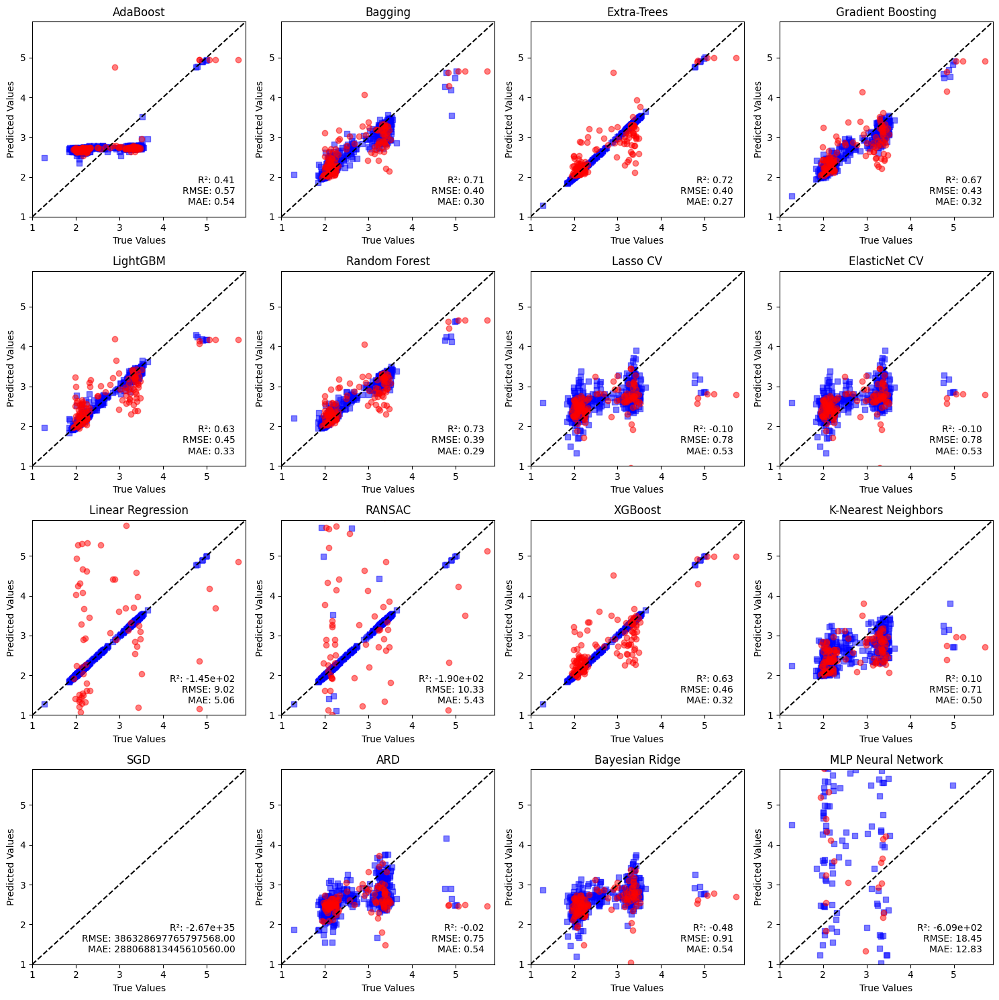

In [20]:
e_direct = BGEvalModel(models_default)
e_direct.plotBG("../models/", "../data/data_processed/")

## Normalization

In [81]:
mg_direct = BGModelDev("../data/data_processed/features_train_normalized.csv", "../data/data_processed/label_train.csv", models_default)
mg_direct.train_direct("../models/", "", "") 

--- Direct Training ---
AdaBoostRegressor
Score:0.19932065655148967

BaggingRegressor
Score:0.8963091250746343

ExtraTreesRegressor
Score:1.0

GradientBoostingRegressor
Score:0.8928334749428688

LGBMRegressor
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 148740
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 901
[LightGBM] [Info] Start training from score 2.615304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.735e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.653e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.707e-02, tolerance: 

Score:0.3707070951161384

ElasticNetCV


c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.720e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.397e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.806e-02, tolerance: 

Score:0.3689182215674268

LinearRegression
Score:1.0

RANSACRegressor
Score:-81.71393743808139

XGBRegressor
Score:0.9999982891839602

KNeighborsRegressor
Score:0.44918580803722696

SGDRegressor
Score:-1.0770239456453296e+23

ARDRegression
Score:0.5170106107236677

BayesianRidge
Score:0.2643596052396897

MLPRegressor
Score:-0.3014476457531028



In [82]:
mg_direct.predict("../models/","../data/data_processed/features_test_normalized.csv","../data/data_processed/label_test.csv")

AdaBoostRegressor
r2: 0.410897720137969

BaggingRegressor
r2: 0.7080722924184362

ExtraTreesRegressor
r2: 0.7126269436937107

GradientBoostingRegressor
r2: 0.6720147104166736

LGBMRegressor
r2: 0.6110790387068541

RandomForestRegressor
r2: 0.7261481899146711

LassoCV
r2: -0.4453972749881081

ElasticNetCV
r2: -0.42319476355487384

LinearRegression
r2: -395.44040802399826

RANSACRegressor
r2: -328.77539278601535

XGBRegressor
r2: 0.6274658363457941

KNeighborsRegressor
r2: 0.10873486147560518

SGDRegressor
r2: -7.985273030854936e+21

ARDRegression
r2: -0.37390126487780906

BayesianRidge
r2: -0.49002432193383316

MLPRegressor
r2: -0.5322890319653177



In [83]:
e_direct = BGEvalModel(models_default)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_direct.performance("../models/", set='test', report_location="../reports/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.5366129032258066
MAPE:  0.21123567224213796
MSE:  0.32963548387096775
RMSE:  0.5741389064250635
E-VAR:  0.4216770547536679
R2:  0.40955710217106034 

Model:  BaggingRegressor
MAE:  0.2985483870967742
MAPE:  0.10823691546422141
MSE:  0.1628274193548387
RMSE:  0.403518796780074
E-VAR:  0.7101520096475009
R2:  0.708343615799833 

Model:  ExtraTreesRegressor
MAE:  0.272741935483871
MAPE:  0.09858251119745212
MSE:  0.16054677419354837
RMSE:  0.4006828848273262
E-VAR:  0.7138885523529761
R2:  0.7124287061612787 

Model:  GradientBoostingRegressor
MAE:  0.3191935483870967
MAPE:  0.11498634257297373
MSE:  0.18306451612903224
RMSE:  0.4278603932698518
E-VAR:  0.6747343955028032
R2:  0.6720949391625909 

Model:  LGBMRegressor
MAE:  0.3390322580645162
MAPE:  0.11993876879163053
MSE:  0.2171854838709678
RMSE:  0.46603163398096464
E-VAR:  0.614869331906835
R2:  0.6109774804664199 

Model:  RandomForestRegressor
MAE:  0.2894354838

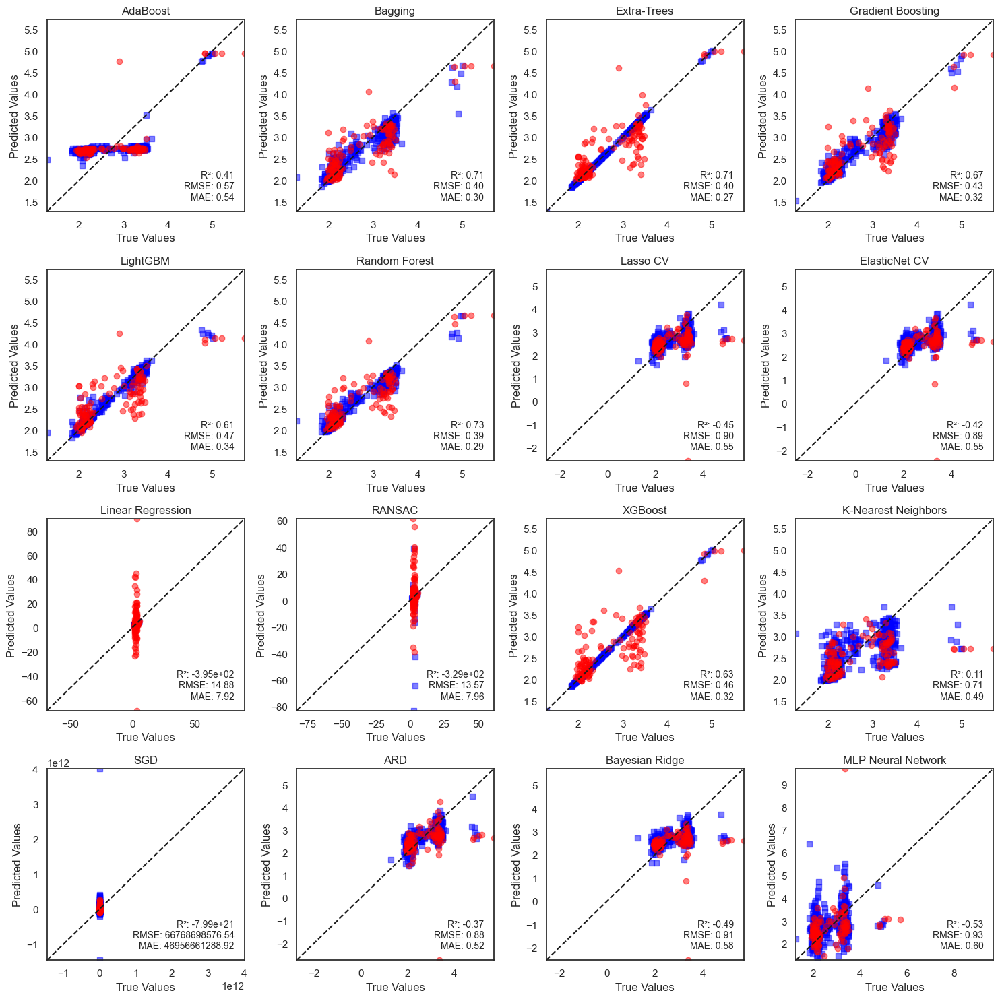

In [84]:
e_direct = BGEvalModel(models_default)
e_direct.plotBG("../models/", "../data/data_processed/", type='_normalized', type_label = False)

## Derivative

In [15]:
mg_direct_derv = BGModelDev("../data/data_processed/features_train_derivative.csv", "../data/data_processed/label_train.csv", models_default)
mg_direct_derv.train_direct("../models/", "", "") 

--- Direct Training ---
AdaBoostRegressor
Score:0.4022396927460087

BaggingRegressor
Score:0.9059883909802231

ExtraTreesRegressor
Score:1.0

GradientBoostingRegressor
Score:0.9321640053465449

LGBMRegressor
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 148866
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 901
[LightGBM] [Info] Start training from score 2.615304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.864e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.940e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.930e-02, tolerance: 

Score:0.21105823109106514

ElasticNetCV


c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.112e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.665e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.359e-02, tolerance: 

Score:0.21018665337241849

LinearRegression
Score:1.0

RANSACRegressor
Score:-31.03172939333401

XGBRegressor
Score:0.999998989335446

KNeighborsRegressor
Score:0.5180238324099895

SGDRegressor
Score:-1.1047233839651024e+24

ARDRegression
Score:0.2966115167897586

BayesianRidge
Score:0.17678887973547674

MLPRegressor
Score:0.3808298170080503



c:\anaconda3\envs\py310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [16]:
mg_direct_derv.predict("../models/","../data/data_processed/features_test_derivative.csv","../data/data_processed/label_test.csv")

AdaBoostRegressor
r2: 0.37666885182138266

BaggingRegressor
r2: 0.5003384416378385

ExtraTreesRegressor
r2: 0.7112216929770447

GradientBoostingRegressor
r2: 0.5270836352202442

LGBMRegressor
r2: 0.5954691755280181

RandomForestRegressor
r2: 0.6106737888108751

LassoCV
r2: -0.31872454061472055

ElasticNetCV
r2: -0.3118933833335513

LinearRegression
r2: -415.02320324974903

RANSACRegressor
r2: -177.01088855570023

XGBRegressor
r2: 0.44529021774802413

KNeighborsRegressor
r2: 0.16429486386138592

SGDRegressor
r2: -6.208971791702275e+23

ARDRegression
r2: -0.8478358972689701

BayesianRidge
r2: -0.23795199369531406

MLPRegressor
r2: -0.3075847738122819



In [17]:
e_direct_derv = BGEvalModel(models_default)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_direct_derv.performance("../models/", set='test', report_location="../reports/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.5120161290322581
MAPE:  0.19177060471320648
MSE:  0.34855241935483877
RMSE:  0.5903832817372446
E-VAR:  0.3757919324264879
R2:  0.37567309771263246 

Model:  BaggingRegressor
MAE:  0.3500806451612903
MAPE:  0.11844385584254401
MSE:  0.27893790322580647
RMSE:  0.5281457215824118
E-VAR:  0.5155326092426635
R2:  0.5003665808034115 

Model:  ExtraTreesRegressor
MAE:  0.2839516129032257
MAPE:  0.09997846147327252
MSE:  0.1610685483870968
RMSE:  0.40133346282997234
E-VAR:  0.7178216540356971
R2:  0.7114941045121077 

Model:  GradientBoostingRegressor
MAE:  0.3484677419354838
MAPE:  0.11993328847759682
MSE:  0.2638185483870967
RMSE:  0.5136326979341334
E-VAR:  0.532538193460724
R2:  0.5274483608940714 

Model:  LGBMRegressor
MAE:  0.3269354838709677
MAPE:  0.11278276108445552
MSE:  0.22546774193548383
RMSE:  0.4748344363412197
E-VAR:  0.6040519130979362
R2:  0.5961423043659787 

Model:  RandomForestRegressor
MAE:  0.3310483

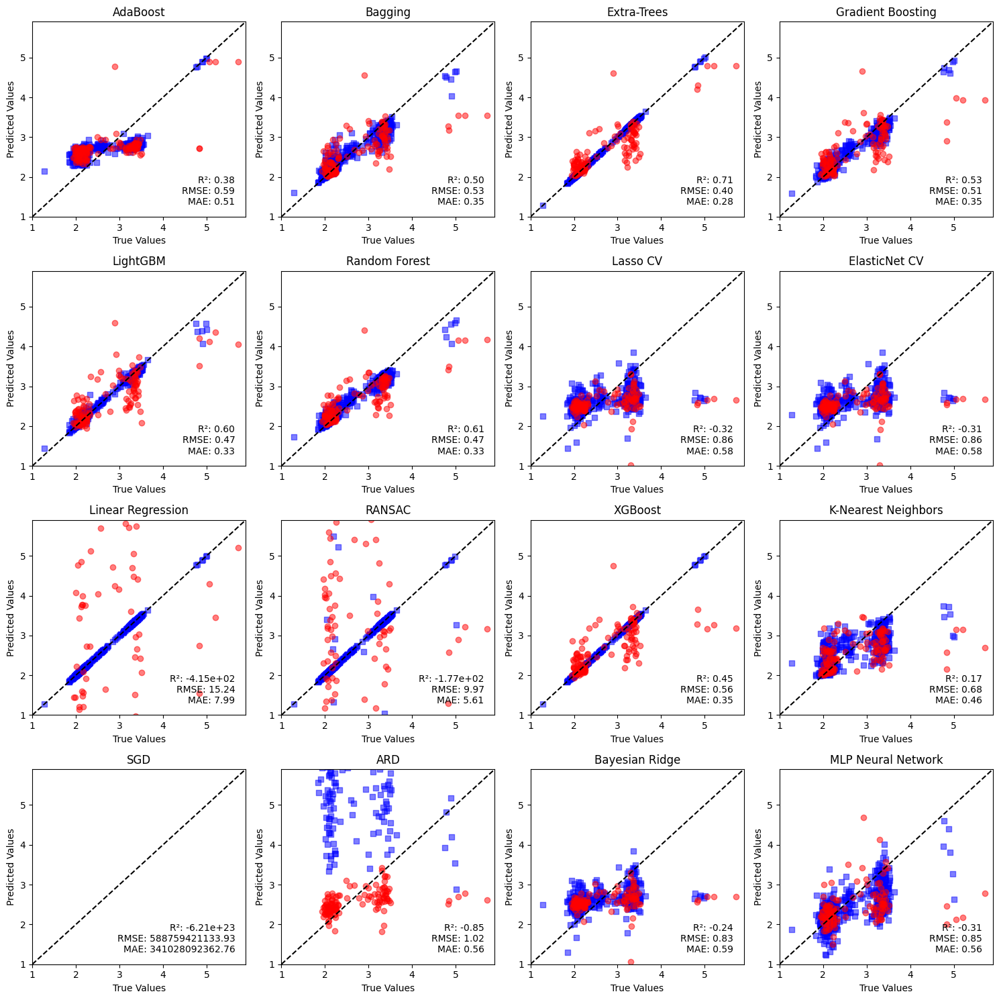

In [21]:
e_direct_derv = BGEvalModel(models_default)
e_direct_derv.plotBG("../models/", "../data/data_processed/", type='_derivative', type_label = False)

### Simple derivative

In [23]:
s = Splitter("", "band_gap_mean")

s.features_train = pd.read_csv("../data/data_processed/features_train.csv")
s.label_train = pd.read_csv("../data/data_processed/label_train.csv")
dx1_round = [float(col) for col in s.features_train.columns]


In [24]:
def derivada(s):
    param = ['features_train', 'features_test']

    for e in param:
        data = getattr(s, e)
        p = Preprocessing(data)
        #data_smooth = savgol_filter(data, 51, 3)   # linea nueva
        data_smooth = pd.DataFrame(columns=data.columns, data=data)
        p.diferentiation(data_smooth)
        dy_dx = p.data_diff/ dx1_round
        data_derivada = savgol_filter(dy_dx, 31, 3)
        #data_derivada = savgol_filter(dy_dx, 101, 3)  # linea nueva
        setattr(s, e, data_derivada)

In [26]:
import copy

#s.features_train, s.label_train = pd.read_csv("../data/data_processed/features_train.csv"), pd.read_csv("../data/data_processed/label_train.csv") #hay backup de s en direct trainin witout pca
s.features_test, s.label_test = pd.read_csv("../data/data_processed/features_test.csv"), pd.read_csv("../data/data_processed/label_test.csv")

s_derived = copy.copy(s)

derivada(s_derived)
s_derived.features_train = pd.DataFrame(s_derived.features_train, columns=s.features_train.columns)
s_derived.features_test = pd.DataFrame(s_derived.features_test, columns=s.features_test.columns)

s_derived.features_train.to_csv("../data/data_processed/features_train_derivative.csv", index=False)
s_derived.features_test.to_csv("../data/data_processed/features_test_derivative.csv", index=False)

#s_derivada_2 = copy.copy(s_derivada)
#s_derivada_2.features_train = pd.DataFrame(s_derivada.features_train, columns=s.features_train.columns)
#s_derivada_2.features_val = pd.DataFrame(s_derivada.features_val, columns=s.features_val.columns)

#derivada(s_derivada_2)

In [27]:
mg_direct_derv = BGModelDev("../data/data_processed/features_train_derivative.csv", "../data/data_processed/label_train.csv", models_default)
mg_direct_derv.train_direct("../models/", "", "") 

--- Direct Training ---
AdaBoostRegressor
Score:0.43729088208435585

BaggingRegressor
Score:0.9008049343607075

ExtraTreesRegressor
Score:1.0

GradientBoostingRegressor
Score:0.9594463941746086

LGBMRegressor
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 148825
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 901
[LightGBM] [Info] Start training from score 2.615304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.420e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.095e-02, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.445e-01, tolerance: 

Score:0.3144717088079634

ElasticNetCV


c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.281e-01, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.361e-01, tolerance: 1.644e-02
  model = cd_fast.enet_coordinate_descent(
c:\anaconda3\envs\py310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.056e-01, tolerance: 

Score:0.3166656038751753

LinearRegression
Score:1.0

RANSACRegressor
Score:-2.9800897249751483

XGBRegressor
Score:0.9999995168006329

KNeighborsRegressor
Score:0.5018197460631834

SGDRegressor
Score:-5.8699193563593286e+25

ARDRegression
Score:0.5433102095795146

BayesianRidge
Score:0.3265260536508853

MLPRegressor
Score:0.07271132331762875



In [28]:
mg_direct_derv.predict("../models/","../data/data_processed/features_test_derivative.csv","../data/data_processed/label_test.csv")

AdaBoostRegressor
r2: 0.4260768834643983

BaggingRegressor
r2: 0.5946121866798879

ExtraTreesRegressor
r2: 0.704576128502252

GradientBoostingRegressor
r2: 0.6090415608419371

LGBMRegressor
r2: 0.5328649425824309

RandomForestRegressor
r2: 0.5840577025210998

LassoCV
r2: -0.0403613415762587

ElasticNetCV
r2: -0.029550770945981464

LinearRegression
r2: -144.4226567706395

RANSACRegressor
r2: -196.33239643553043

XGBRegressor
r2: 0.513370692903128

KNeighborsRegressor
r2: 0.19775579856554903

SGDRegressor
r2: -1.5824723113812578e+24

ARDRegression
r2: -0.554760096756054

BayesianRidge
r2: -0.08692157526827016

MLPRegressor
r2: -1.470003598493677



In [30]:
e_direct_derv = BGEvalModel(models_default)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_direct_derv.performance("../models/", set='test', report_location="../reports/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.5025806451612903
MAPE:  0.18753637857717528
MSE:  0.3204274193548387
RMSE:  0.5660630877868992
E-VAR:  0.4261367406507214
R2:  0.42605058227961334 

Model:  BaggingRegressor
MAE:  0.3369354838709678
MAPE:  0.11693686669459998
MSE:  0.22617258064516127
RMSE:  0.4755760513789159
E-VAR:  0.6038600720953118
R2:  0.5948797976559703 

Model:  ExtraTreesRegressor
MAE:  0.2956451612903226
MAPE:  0.10286100781249148
MSE:  0.1651548387096774
RMSE:  0.40639246881515584
E-VAR:  0.7114819426219731
R2:  0.7041747435285697 

Model:  GradientBoostingRegressor
MAE:  0.33137096774193553
MAPE:  0.11433525493923337
MSE:  0.2186782258064516
RMSE:  0.4676304372113214
E-VAR:  0.6184442868938624
R2:  0.608303681930693 

Model:  LGBMRegressor
MAE:  0.34056451612903227
MAPE:  0.11435231377498085
MSE:  0.26047822580645164
RMSE:  0.510370674908396
E-VAR:  0.548175215559018
R2:  0.533431544867589 

Model:  RandomForestRegressor
MAE:  0.337500000

# Models selected with best performance for Genetic Search

In [22]:
models_genetic_subset = [
    (   sklearn.ensemble.AdaBoostRegressor(random_state=123),
        {
            'n_estimators': Integer(50,200),
            'learning_rate': Continuous(0.01,1, distribution='log-uniform'),
            'loss':Categorical(['linear','square', 'exponential'])
        }
    ),
    (   sklearn.ensemble.BaggingRegressor(random_state=123),
        {   
            'n_estimators': Integer(50, 200),
            'max_samples': Continuous(0.1, 1.0, distribution='log-uniform'),
            'max_features': Continuous(0.1, 1.0, distribution='log-uniform'),
            'bootstrap': Categorical([True, False]),
            'bootstrap_features': Categorical([True, False]),
        }
    ),
    (   sklearn.ensemble.ExtraTreesRegressor(random_state=123),
        {
            'n_estimators': Integer(50, 200),
            'bootstrap': Categorical([True, False]),
            'max_depth': Categorical([10, 30, 50, None]),
            'max_features': Categorical(['sqrt', 'log2', 1.0]),
            'min_samples_split': Integer(2, 10),
            'min_samples_leaf': Integer(1, 4)         
        }
    ),
    (   sklearn.ensemble.GradientBoostingRegressor(random_state=123),
        {   
            'n_estimators': Integer(50, 200),
            'loss': Categorical(['squared_error', 'absolute_error']),
            'max_depth': Categorical([10, 30, 50, None]),
            'max_features': Categorical(['sqrt', 'log2', 1.0]),
            'min_samples_split': Integer(2, 10),
            'min_samples_leaf': Integer(1, 4)   
        }
    ), #  LightGBM
    (
        lgb.LGBMRegressor(random_state=123),
        {   
            'n_estimators': Integer(50, 200),
            'learning_rate': Continuous(0.01, 0.3, distribution='log-uniform'),
            'max_depth': Integer(10, 30),
            'num_leaves': Integer(20, 100),
            'min_child_samples': Integer(5, 20),
            'subsample': Continuous(0.7, 1.0, distribution='uniform'),
            'colsample_bytree': Continuous(0.7, 1.0, distribution='uniform'),
            'reg_alpha': Continuous(1e-3, 1.0, distribution='log-uniform'), # Regularización L1
            'reg_lambda': Continuous(1e-3, 1.0, distribution='log-uniform'),# Regularización L2
        }
    ),
    (
        sklearn.ensemble.RandomForestRegressor(random_state=123),
          {
            'n_estimators': Integer(50, 1000),
            'bootstrap': Categorical([True, False]),
            'criterion': Categorical(['squared_error', 'absolute_error', 'friedman_mse', 'poisson']),
            'max_depth': Categorical([10, 30, 50, None]),
            'max_features': Categorical(['sqrt', 'log2', 1.0]),
            'min_samples_split': Integer(2, 10),
            'min_samples_leaf': Integer(1, 4)
          }
    ),  
    (
        XGBRegressor(random_state=123),
           {
            'n_estimators': Integer(50, 200),
            'learning_rate': Continuous(0.05, 0.5),
            'subsample': Categorical([0.5, 0.75, 1]),
            'max_depth': Categorical([3, 6, 10]),
           }
    ),
    (
        sklearn.neighbors.KNeighborsRegressor(),
           {
            'n_neighbors': Integer(1, 20),
            'weights': Categorical(['uniform', 'distance']),
            'p': Integer(1, 2)
           }
    ),
    ]

# Genetic search 
Se observo que los resutlados con PCA son malos, y la normalizacion no aporto nada

## Original dataset

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.102003	0.0900121  	0.232497   	-0.0305885 
1  	100   	0.191246	0.0618768  	0.232497   	-0.025627  
2  	100   	0.216767	0.0238276  	0.232497   	0.100019   
3  	100   	0.225454	0.00863381 	0.233864   	0.179468   
4  	100   	0.229837	0.00366664 	0.234389   	0.211533   
5  	100   	0.231496	0.00255254 	0.235791   	0.224045   
6  	100   	0.231789	0.00531803 	0.237294   	0.197484   
7  	100   	0.231779	0.00490805 	0.235791   	0.206508   
8  	100   	0.233477	0.00204846 	0.236192   	0.224261   
9  	100   	0.233862	0.00192387 	0.236192   	0.226203   
10 	100   	0.234245	0.00172041 	0.236192   	0.226203   
AdaBoostRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.331974	0.0688141  	0.459959   	0.212526   
1  	100   	0.397261	0.0548567  	0.464906   	0.283341   
2  	100   	0.440292	0.027124   	0.465606   	0.354682   
3  	100   	0.458253	0.0125348  	0.473026   	0.383048   
4  	100   	0.464117	0.00360803 	0.470053   	0.446502   
5  	100   	0.466124	0.00198146 	0.470053   	0.458872   
6  	100   	0.466447	0.00293576 	0.470053   	0.454038   
7  	100   	0.466248	0.00301384 	0.470053   	0.455574   
8  	100   	0.466343	0.00643083 	0.470053   	0.434745   
9  	100   	0.46611 	0.00885645 	0.470053   	0.415463   
10 	100   	0.468224	0.00239649 	0.470053   	0.456903   
BaggingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.362654	0.051129   	0.460416   	0.269699   
1  	100   	0.409181	0.0396317  	0.45856    	0.321747   
2  	100   	0.438424	0.0237313  	0.460416   	0.340335   
3  	100   	0.451725	0.00405714 	0.460416   	0.440573   
4  	100   	0.454181	0.00281201 	0.460416   	0.447048   
5  	100   	0.456101	0.00252653 	0.460416   	0.451035   
6  	100   	0.457128	0.00196303 	0.462005   	0.453275   
7  	100   	0.45807 	0.00195792 	0.462005   	0.452703   
8  	100   	0.458854	0.00192762 	0.462005   	0.453875   
9  	100   	0.459233	0.0019395  	0.462005   	0.453918   
10 	100   	0.460187	0.00157215 	0.462005   	0.453383   
ExtraTreesRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.418936	0.034566   	0.467515   	0.272575   
1  	100   	0.442219	0.0165186  	0.467515   	0.407783   
2  	100   	0.453662	0.0107546  	0.469537   	0.432725   
3  	100   	0.460318	0.00808767 	0.468772   	0.434375   
4  	100   	0.464241	0.00605863 	0.468868   	0.443364   
5  	100   	0.465609	0.00514617 	0.469422   	0.43978    
6  	100   	0.468034	0.000716833	0.469422   	0.466014   
7  	100   	0.467609	0.00422623 	0.469422   	0.446379   
8  	100   	0.468893	0.000796555	0.469595   	0.464311   
9  	100   	0.468769	0.00248306 	0.469595   	0.452345   
10 	100   	0.469424	0.000277237	0.469635   	0.468254   
GradientBoostingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.410524	0.0349607  	0.47492    	0.274729   
1  	100   	0.443551	0.0258324  	0.484486   	0.389885   
2  	100   	0.462452	0.0157703  	0.484486   	0.415476   
3  	100   	0.471623	0.00893348 	0.488284   	0.449375   
4  	100   	0.475254	0.00571769 	0.488284   	0.462423   
5  	100   	0.479271	0.00447201 	0.488284   	0.466615   
6  	100   	0.480918	0.00456105 	0.488314   	0.47147    
7  	100   	0.483223	0.00391774 	0.488742   	0.47329    
8  	100   	0.485416	0.00335434 	0.488742   	0.470169   
9  	100   	0.486377	0.00283396 	0.489831   	0.473577   
10 	100   	0.486825	0.00282822 	0.49033    	0.47206    
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 148665
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 901
[LightGBM] [Info] Start training from 

c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.360542	0.118846   	0.439947   	0.0436339  
1  	100   	0.424216	0.00953362 	0.445325   	0.404498   
2  	100   	0.431257	0.00568547 	0.445325   	0.413617   
3  	100   	0.435606	0.0055106  	0.445325   	0.423449   
4  	100   	0.440142	0.00396438 	0.445325   	0.429773   
5  	100   	0.442406	0.00324992 	0.449912   	0.435185   
6  	100   	0.443872	0.00311169 	0.449912   	0.435073   
7  	100   	0.445636	0.00236634 	0.450055   	0.440074   
8  	100   	0.447289	0.00272967 	0.452433   	0.442386   
9  	100   	0.448493	0.00336848 	0.453265   	0.437814   
10 	100   	0.449003	0.00272455 	0.453641   	0.438445   
RandomForestRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.337306	0.0825888  	0.438512   	0.106136   
1  	100   	0.390948	0.0448534  	0.438512   	0.2428     
2  	100   	0.413833	0.020188   	0.440456   	0.369647   
3  	100   	0.423269	0.0147147  	0.445291   	0.376147   
4  	100   	0.432368	0.010703   	0.445291   	0.404577   
5  	100   	0.437528	0.00866496 	0.454488   	0.415617   
6  	100   	0.438781	0.00947721 	0.454488   	0.405308   
7  	100   	0.442055	0.009587   	0.454488   	0.406488   
8  	100   	0.441798	0.0109983  	0.454871   	0.410301   
9  	100   	0.446827	0.00706589 	0.458254   	0.41058    
10 	100   	0.448628	0.00641229 	0.458254   	0.422364   
XGBRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`sha

gen	nevals	fitness  	fitness_std	fitness_max	fitness_min
0  	50    	0.0503428	0.121869   	0.131588   	-0.383893  
1  	100   	0.109351 	0.0149358  	0.132625   	0.078525   
2  	100   	0.121358 	0.00856395 	0.132625   	0.100381   
3  	100   	0.125163 	0.00784392 	0.132625   	0.0963615  
4  	100   	0.128707 	0.00725202 	0.132625   	0.0895267  
5  	100   	0.131671 	0.00254897 	0.132625   	0.117453   
6  	100   	0.131063 	0.00401087 	0.132625   	0.111605   
7  	100   	0.131965 	0.00309928 	0.132625   	0.111605   
8  	100   	0.132016 	0.00308836 	0.132625   	0.111605   
9  	100   	0.132068 	0.00307654 	0.132625   	0.111605   
10 	100   	0.132214 	0.00162729 	0.132625   	0.125773   
KNeighborsRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

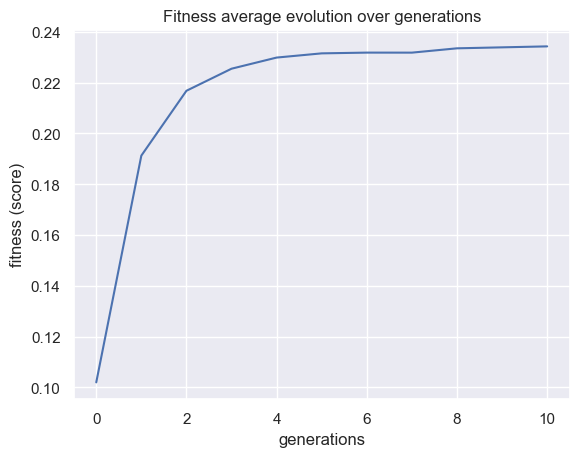

<Figure size 1000x1000 with 0 Axes>

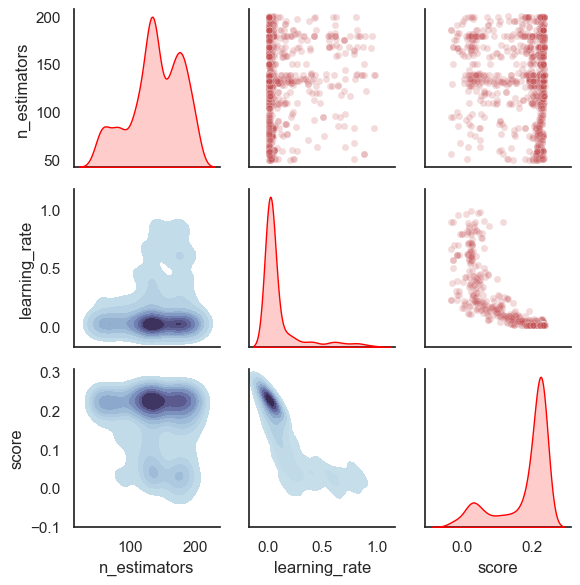

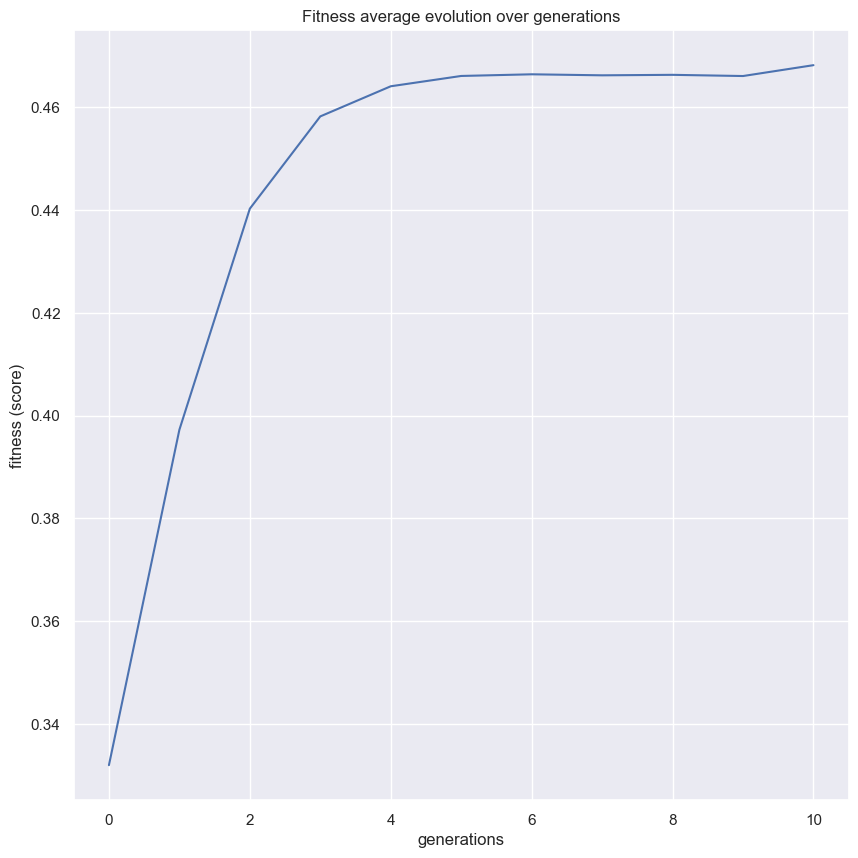

<Figure size 1000x1000 with 0 Axes>

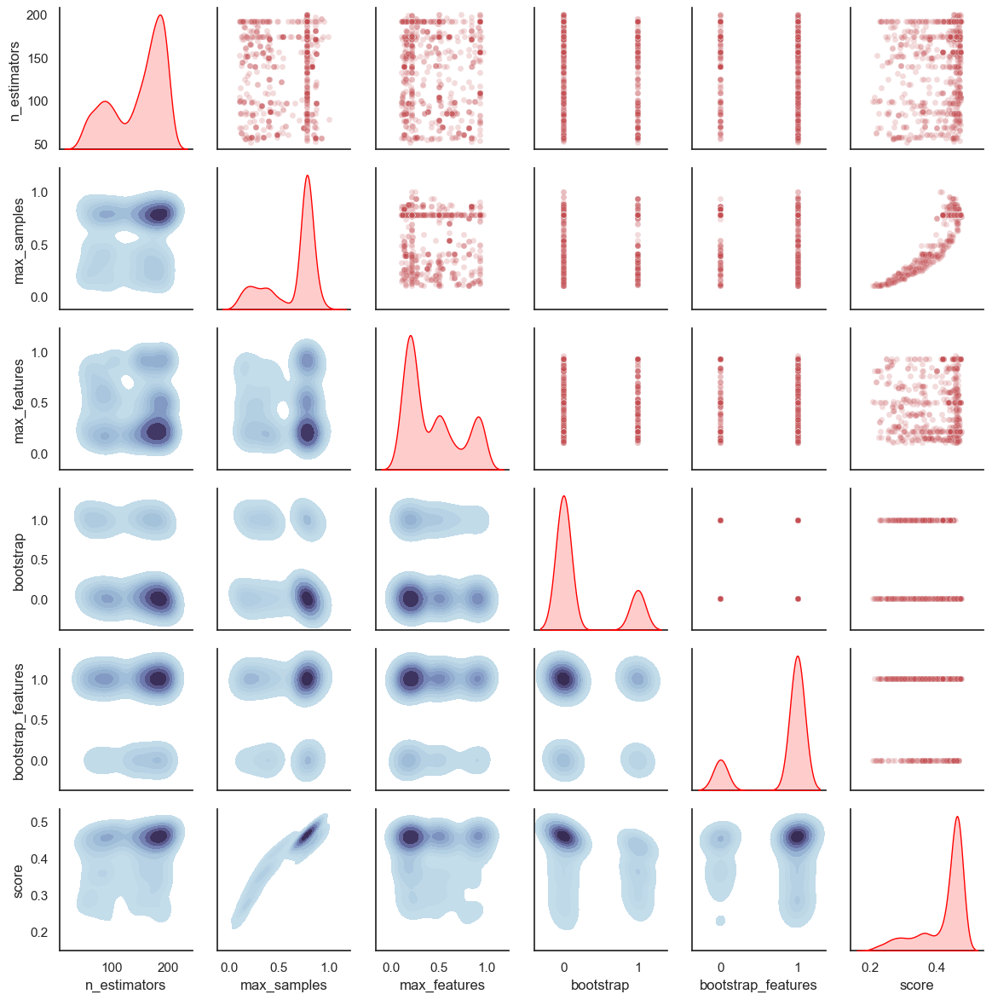

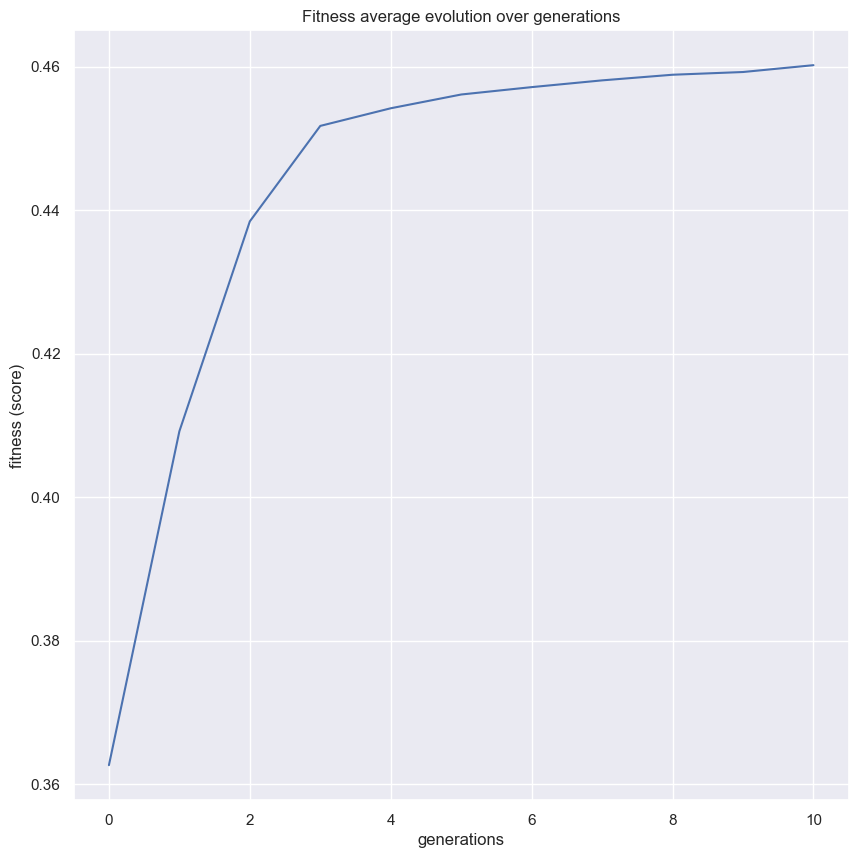

<Figure size 1000x1000 with 0 Axes>

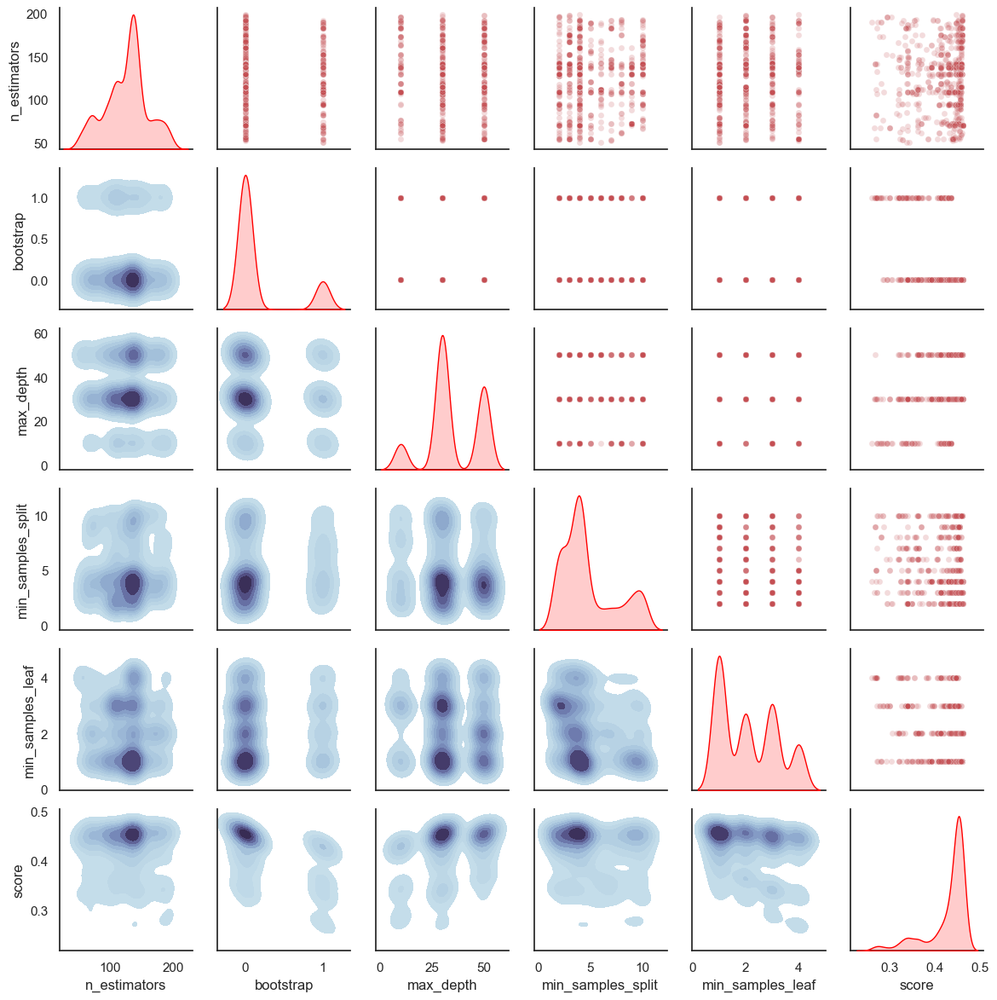

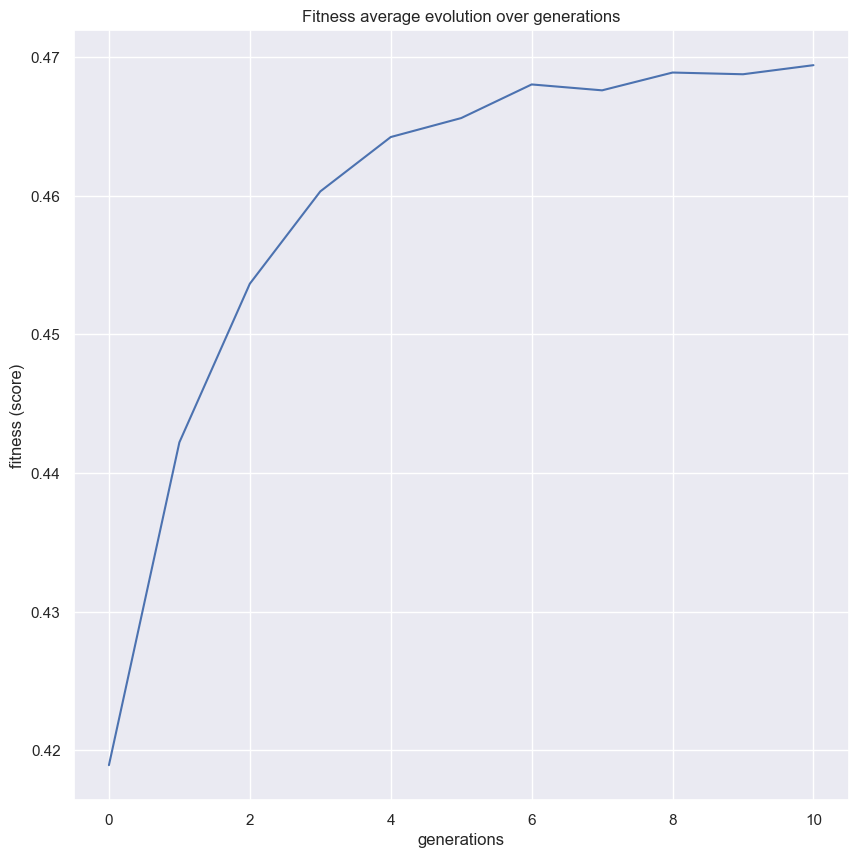

<Figure size 1000x1000 with 0 Axes>

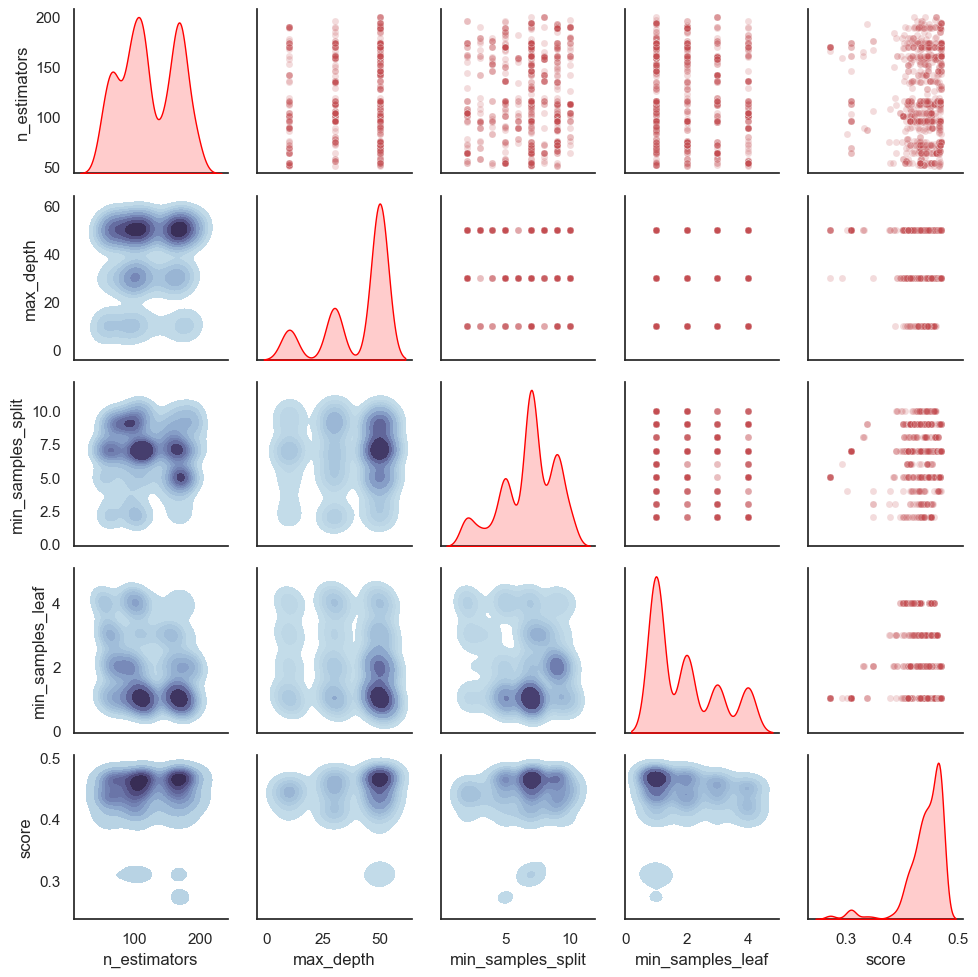

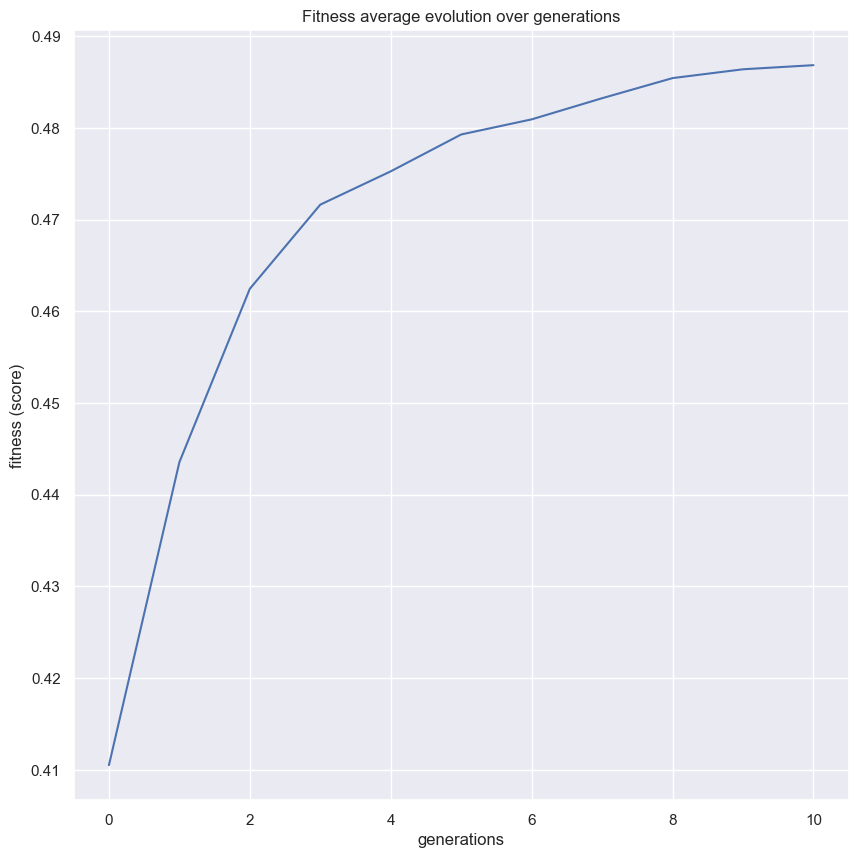

<Figure size 1000x1000 with 0 Axes>

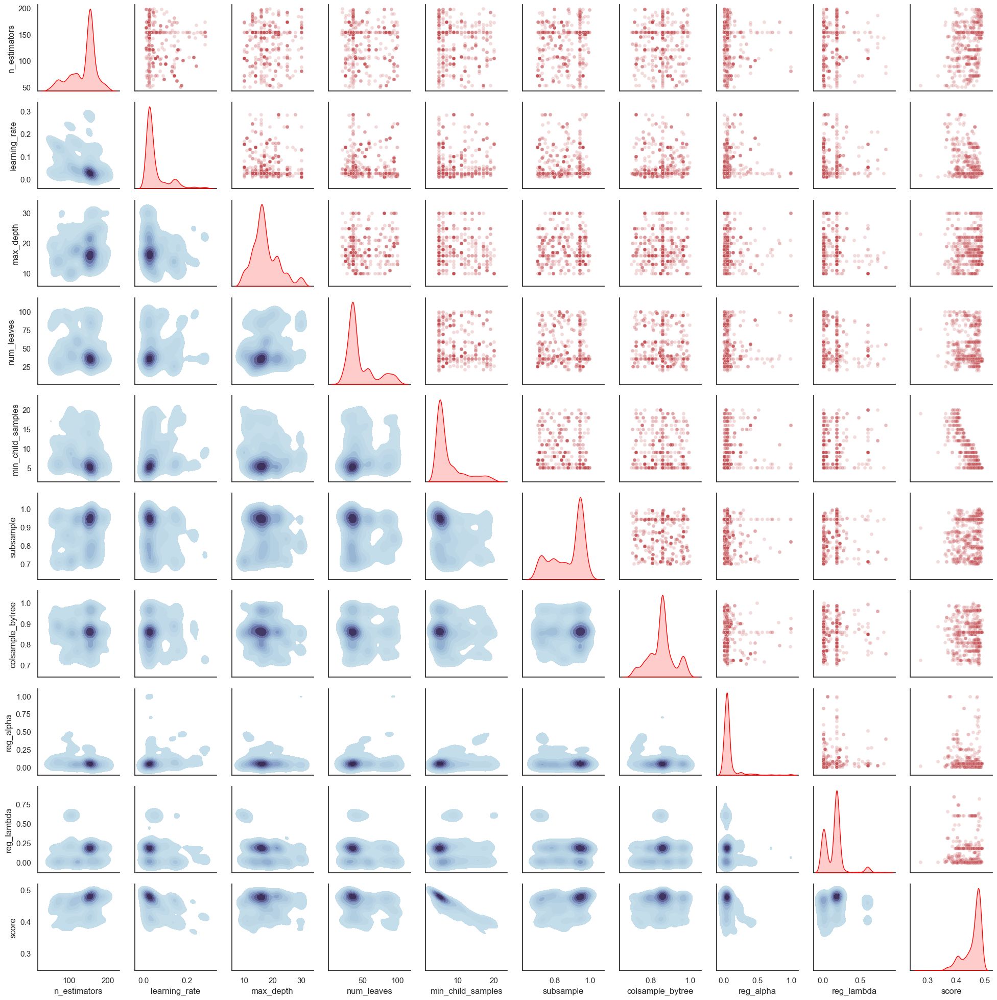

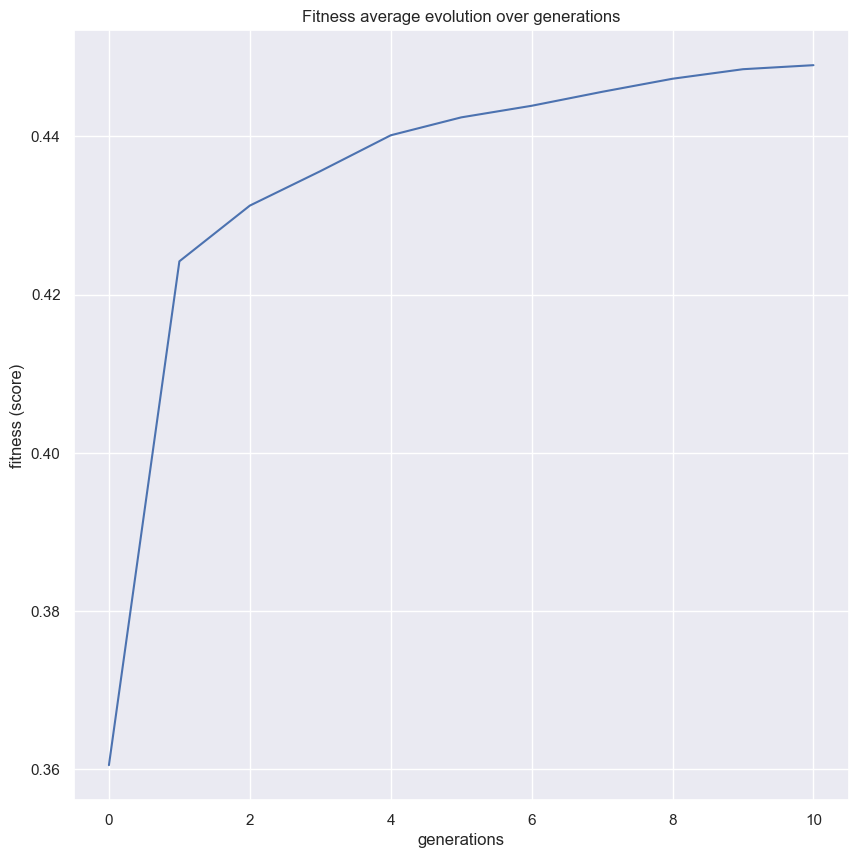

<Figure size 1000x1000 with 0 Axes>

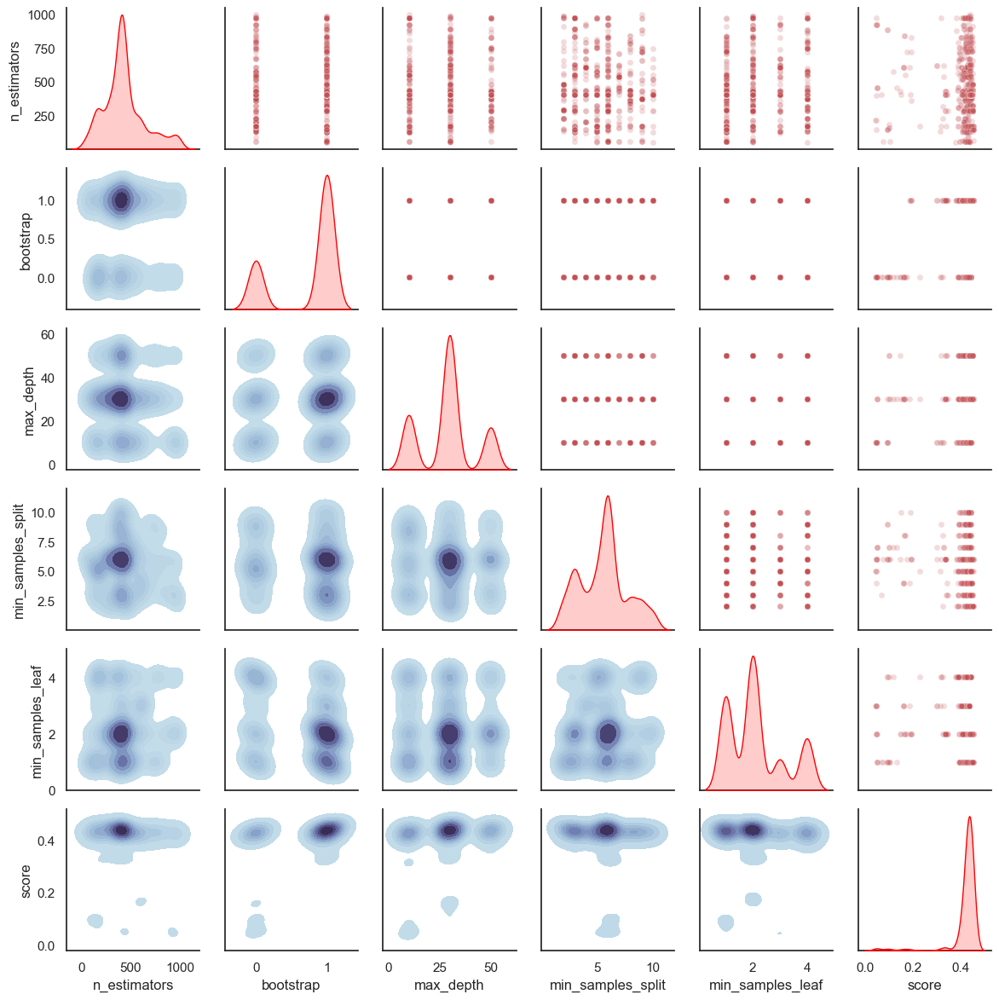

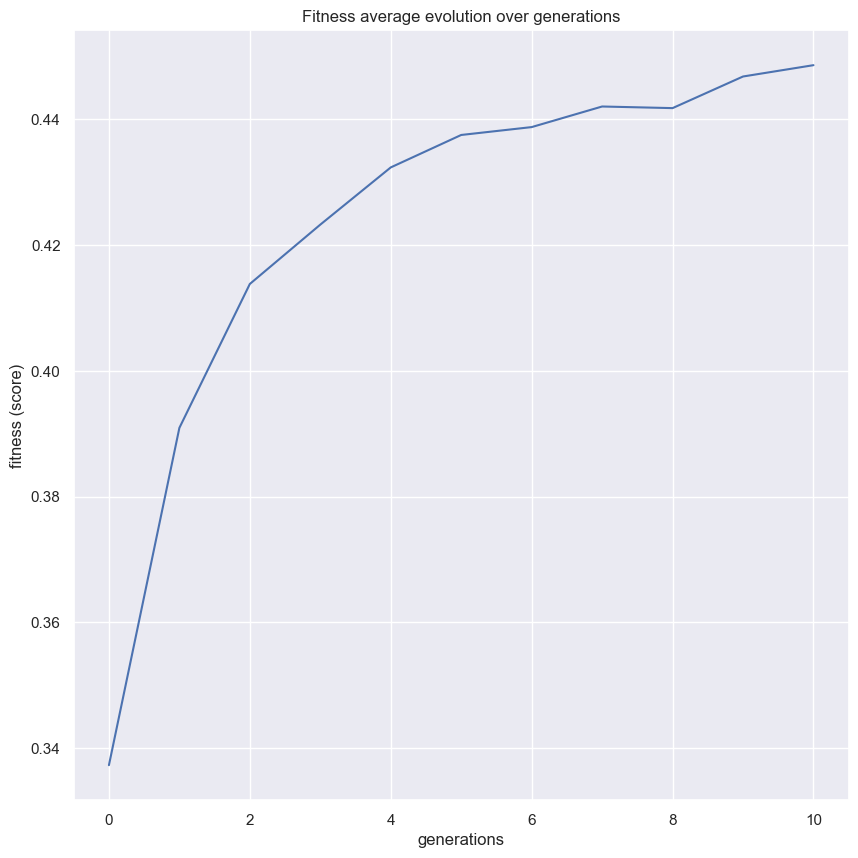

<Figure size 1000x1000 with 0 Axes>

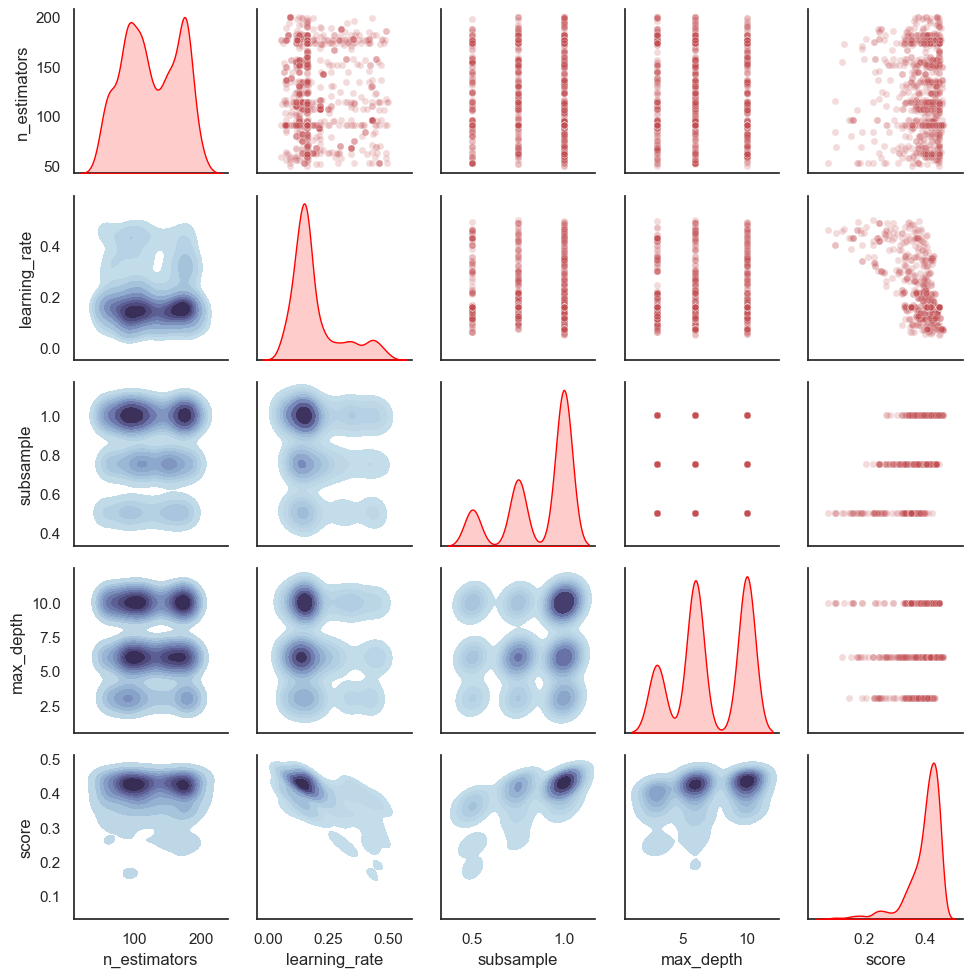

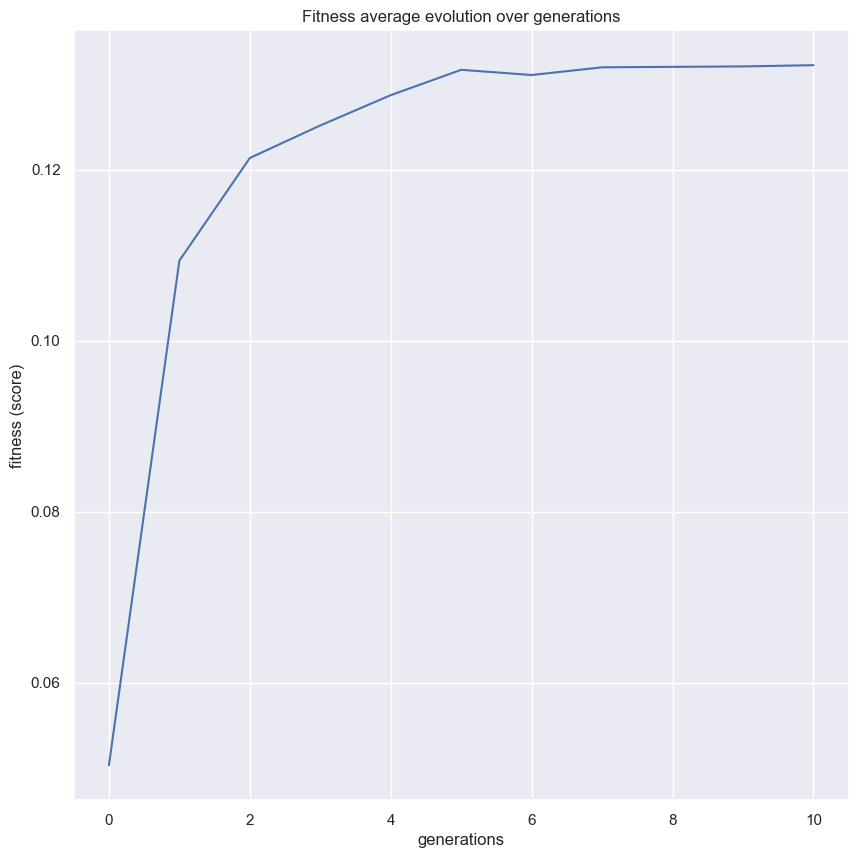

<Figure size 1000x1000 with 0 Axes>

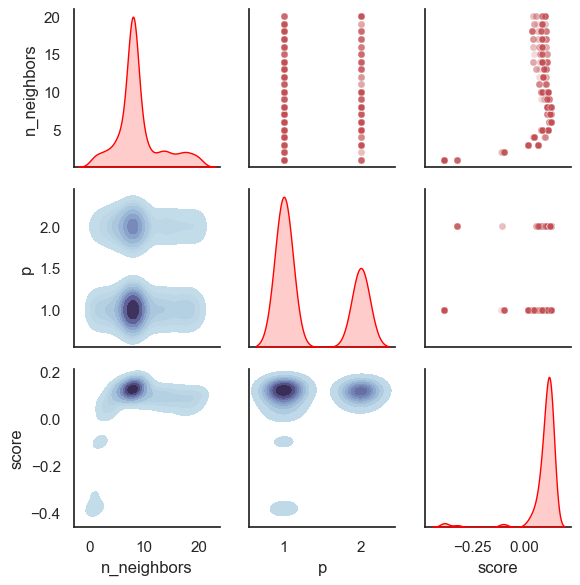

In [33]:
mg = BGModelDev("../data/data_processed/features_train.csv", "../data/data_processed/label_train.csv", models_genetic_subset)
mg.genetic_search("../reports/genetic_search/", -1, models_genetic_subset, score='r2', generations=10, pipeline=False) ##### %Obs: take a coffee

In [34]:
mg.summary_cv_scores

[{'model': 'AdaBoostRegressor',
  'mean_absolute_error': '-0.4623 ± 0.0187',
  'mean_absolute_percentage_error': '-0.1750 ± 0.0077',
  'mean_squared_error': '-0.3015 ± 0.0381',
  'root_mean_squared_error': '-0.5480 ± 0.0341',
  'r2': '0.2375 ± 0.0284',
  'explained_variance': '0.2541 ± 0.0155'},
 {'model': 'BaggingRegressor',
  'mean_absolute_error': '-0.3292 ± 0.0375',
  'mean_absolute_percentage_error': '-0.1237 ± 0.0095',
  'mean_squared_error': '-0.2118 ± 0.0533',
  'root_mean_squared_error': '-0.4568 ± 0.0559',
  'r2': '0.4730 ± 0.0565',
  'explained_variance': '0.4839 ± 0.0585'},
 {'model': 'ExtraTreesRegressor',
  'mean_absolute_error': '-0.3271 ± 0.0430',
  'mean_absolute_percentage_error': '-0.1232 ± 0.0111',
  'mean_squared_error': '-0.2169 ± 0.0606',
  'root_mean_squared_error': '-0.4617 ± 0.0611',
  'r2': '0.4620 ± 0.0661',
  'explained_variance': '0.4721 ± 0.0708'},
 {'model': 'GradientBoostingRegressor',
  'mean_absolute_error': '-0.3229 ± 0.0287',
  'mean_absolute_percen

In [38]:
tt = copy.copy(mg)

In [39]:
mg = BGModelDev("../data/data_processed/features_train.csv", "../data/data_processed/label_train.csv", models_genetic_subset)
mg.train_best_models("../reports/genetic_search/","genetic_search","../models/genetic_search/")
mg.predict("../models/genetic_search/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")

[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    1.6s remaining:   12.0s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  59 out of  70 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  70 out of  70 | elapsed:    0.1s finished


building tree 1 of 70building tree 2 of 70
building tree 3 of 70

building tree 4 of 70
building tree 5 of 70
building tree 6 of 70
building tree 7 of 70
building tree 8 of 70
building tree 9 of 70
building tree 10 of 70
building tree 11 of 70
building tree 12 of 70
building tree 13 of 70
building tree 14 of 70
building tree 15 of 70
building tree 16 of 70
building tree 17 of 70
building tree 18 of 70
building tree 19 of 70
building tree 20 of 70
building tree 21 of 70
building tree 22 of 70
building tree 23 of 70
building tree 24 of 70
building tree 25 of 70
building tree 26 of 70
building tree 27 of 70
building tree 28 of 70
building tree 29 of 70
building tree 30 of 70
building tree 31 of 70
building tree 32 of 70
building tree 33 of 70
building tree 34 of 70
building tree 35 of 70
building tree 36 of 70
building tree 37 of 70
building tree 38 of 70
building tree 39 of 70
building tree 40 of 70
building tree 41 of 70
building tree 42 of 70
building tree 43 of 70
building tree 44 of 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done 153 out of 153 | elapsed:    0.1s finished


building tree 87 of 153building tree 88 of 153
building tree 89 of 153
building tree 90 of 153
building tree 91 of 153
building tree 92 of 153

building tree 93 of 153
building tree 94 of 153
building tree 95 of 153
building tree 96 of 153
building tree 97 of 153
building tree 98 of 153
building tree 99 of 153
building tree 100 of 153
building tree 101 of 153
building tree 102 of 153
building tree 103 of 153
building tree 104 of 153
building tree 105 of 153
building tree 106 of 153
building tree 107 of 153
building tree 108 of 153
building tree 109 of 153
building tree 110 of 153
building tree 111 of 153
building tree 112 of 153
building tree 113 of 153
building tree 114 of 153
building tree 115 of 153
building tree 116 of 153
building tree 117 of 153
building tree 118 of 153
building tree 119 of 153
building tree 120 of 153
building tree 121 of 153
building tree 122 of 153
building tree 123 of 153
building tree 124 of 153
building tree 125 of 153
building tree 126 of 153
building tree

c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: [16:57:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)


AdaBoostRegressor
r2: 0.583930555689143

BaggingRegressor


[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    0.0s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done  59 out of  70 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  70 out of  70 | elapsed:    0.0s finished


r2: 0.7323200179642344

ExtraTreesRegressor
r2: 0.7292723047882705

GradientBoostingRegressor
r2: 0.6845416719020213

LGBMRegressor
r2: 0.6845806412183906

RandomForestRegressor
r2: 0.7352465958998208

XGBRegressor
r2: 0.6626208288014359

KNeighborsRegressor
r2: 0.3054242293897207



[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 153 out of 153 | elapsed:    0.0s finished


In [40]:
e = BGEvalModel(models_genetic_subset)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Test --------- ")
e.performance("../models/genetic_search/", set='test', report_location="../reports/genetic_search/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.39201612903225813
MAPE:  0.14533420576901798
MSE:  0.2322943548387097
RMSE:  0.481969246776918
E-VAR:  0.5860384879555349
R2:  0.583914479079685 

Model:  BaggingRegressor
MAE:  0.26653225806451614
MAPE:  0.09640875247482163
MSE:  0.1495185483870968
RMSE:  0.3866762837142935
E-VAR:  0.7343868007612131
R2:  0.7321824581742812 

Model:  ExtraTreesRegressor
MAE:  0.2730645161290322
MAPE:  0.09932270525560444
MSE:  0.1511951612903226
RMSE:  0.3888382199454197
E-VAR:  0.7306556982882022
R2:  0.7291793100620303 

Model:  GradientBoostingRegressor
MAE:  0.2934677419354839
MAPE:  0.10500316323517675
MSE:  0.17593629032258065
RMSE:  0.419447601402822
E-VAR:  0.6912594336193785
R2:  0.6848630133156386 

Model:  LGBMRegressor
MAE:  0.28427419354838707
MAPE:  0.10256781560406593
MSE:  0.1761717741935484
RMSE:  0.4197282146741489
E-VAR:  0.6859593657737385
R2:  0.6844412147351782 

Model:  RandomForestRegressor
MAE:  0.2812096774

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   3 out of  16 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  12 out of  16 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done  70 out of  70 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 153 out of 153 | elapsed:    0.0s finished


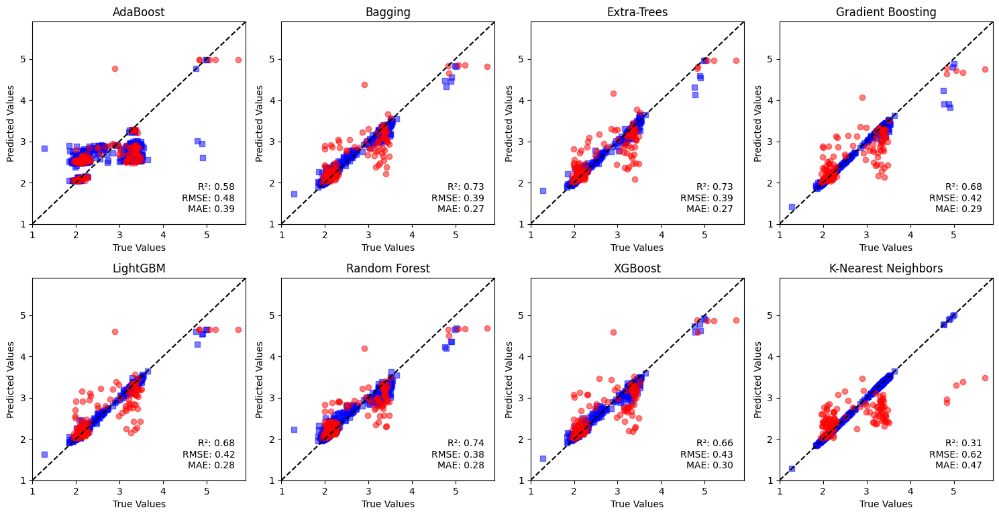

In [30]:
e = BGEvalModel(models_genetic_subset)
e.plotBG("../models/genetic_search/", "../data/data_processed/")

Concluision: Best results with R2 as score in genetic search

## Augmentation 

## Metodo 1: Shift

In [663]:
mg_aug = BGModelDev("../data/data_processed/features_train_augmentated.csv", "../data/data_processed/label_train_augmentated.csv", models_genetic_subset)
mg_aug.genetic_search("../reports/genetic_search/", -1, models_genetic_subset, score='r2', generations=10) ##### %Obs: take a coffee

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.757138	0.00944517 	0.769761   	0.728553   
1  	100   	0.764345	0.00479792 	0.77027    	0.745996   
2  	100   	0.767074	0.00249296 	0.77027    	0.760448   
3  	100   	0.76812 	0.001663   	0.770894   	0.763602   
4  	100   	0.768862	0.00163233 	0.772297   	0.761643   
5  	100   	0.769524	0.00111783 	0.772297   	0.767687   
6  	100   	0.769809	0.00105058 	0.772297   	0.765      
7  	100   	0.769171	0.00220701 	0.771696   	0.761143   
8  	100   	0.77    	0.00139231 	0.772809   	0.765342   
9  	100   	0.76974 	0.00161178 	0.771696   	0.76191    
10 	100   	0.770176	0.000917792	0.771696   	0.767267   
AdaBoostRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.880176	0.0120439  	0.89473    	0.856062   
1  	100   	0.889565	0.00607852 	0.895461   	0.867213   
2  	100   	0.892955	0.00225327 	0.895461   	0.885302   
3  	100   	0.894372	0.000805236	0.895829   	0.890713   
4  	100   	0.894877	0.000389432	0.895829   	0.893722   
5  	100   	0.895081	0.000310313	0.895697   	0.894292   
6  	100   	0.895229	0.000273762	0.89587    	0.894575   
7  	100   	0.8952  	0.000458766	0.895932   	0.89325    
8  	100   	0.895275	0.000335487	0.895886   	0.894486   
9  	100   	0.895292	0.000334554	0.895886   	0.894193   
10 	100   	0.89537 	0.000248776	0.895754   	0.894961   
BaggingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.882716	0.0211288  	0.901134   	0.818309   
1  	100   	0.893999	0.0066653  	0.901134   	0.86631    
2  	100   	0.898951	0.00303786 	0.901151   	0.889677   
3  	100   	0.900642	0.00104804 	0.901854   	0.894378   
4  	100   	0.900929	0.000781278	0.901968   	0.896793   
5  	100   	0.901146	0.000398524	0.901968   	0.899849   
6  	100   	0.901385	0.00033425 	0.901968   	0.900084   
7  	100   	0.901449	0.000335221	0.901968   	0.900084   
8  	100   	0.901495	0.000260929	0.902032   	0.901011   
9  	100   	0.901479	0.00054042 	0.902032   	0.898566   
10 	100   	0.901645	0.000283057	0.902032   	0.900267   
ExtraTreesRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

In [7]:
mg_aug.train_best_models("../reports/genetic_search/","genetic_search","../models/genetic_search/")
mg_aug.predict("../models/genetic_search/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")

[LightGBM] [Warning] Unknown parameter: verboes
[LightGBM] [Warning] Unknown parameter: verboes
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 229755
[LightGBM] [Info] Number of data points in the train set: 7249, number of used features: 901
[LightGBM] [Info] Start training from score 3.693442
RandomForestRegressor

[Errno 2] No such file or directory: '../reports/genetic_search/genetic_search_RandomForestRegressor.json'
XGBRegressor

[Errno 2] No such file or directory: '../reports/genetic_search/genetic_search_XGBRegressor.json'
KNeighborsRegressor

[Errno 2] No such file or directory: '../reports/genetic_search/genetic_search_KNeighborsRegressor.json'
AdaBoostRegressor
r2: 0.3023241332220239

BaggingRegressor
r2: 0.706678937638975

ExtraTreesRegressor
r2: 0.7060963692014602

GradientBoostingRegressor
r2: 0.7307627616915365

LGBMRegressor
[L

c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


r2: 0.3256706671984968



In [8]:
mg_aug.predict("../models/genetic_search/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")

AdaBoostRegressor
r2: 0.3023241332220239

BaggingRegressor
r2: 0.706678937638975

ExtraTreesRegressor
r2: 0.7060963692014603

GradientBoostingRegressor
r2: 0.7307627616915365

LGBMRegressor
[LightGBM] [Warning] Unknown parameter: verboes
r2: 0.6712362592273693

RandomForestRegressor
r2: 0.6999062870681365

XGBRegressor
r2: 0.6756059533977342

KNeighborsRegressor
r2: 0.3256706671984968



In [9]:
e_aug = BGEvalModel(models_genetic_subset)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_aug.performance("../models/genetic_search/", set='test', report_location="../reports/genetic_search/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.5646774193548387
MAPE:  0.22932065758083672
MSE:  0.3891290322580646
RMSE:  0.6238020777923592
E-VAR:  0.3721204744721457
R2:  0.3029922909459617 

Model:  BaggingRegressor
MAE:  0.31612903225806455
MAPE:  0.11316744247238025
MSE:  0.1635258064516129
RMSE:  0.40438324205091997
E-VAR:  0.7084552162859357
R2:  0.7070926652153167 

Model:  ExtraTreesRegressor
MAE:  0.30838709677419357
MAPE:  0.11056429788591586
MSE:  0.16405806451612906
RMSE:  0.40504081833332434
E-VAR:  0.7091930842180603
R2:  0.706139284862221 

Model:  GradientBoostingRegressor
MAE:  0.2897580645161291
MAPE:  0.10510416793765061
MSE:  0.15018467741935482
RMSE:  0.38753667880518716
E-VAR:  0.7314693450472682
R2:  0.7309892882172253 

Model:  LGBMRegressor
MAE:  0.31814516129032255
MAPE:  0.11461312395049157
MSE:  0.18362983870967745
RMSE:  0.42852052309040867
E-VAR:  0.6717702143661277
R2:  0.6710823336663485 

Model:  RandomForestRegressor
MAE:  0.31

[LightGBM] [Warning] Unknown parameter: verboes


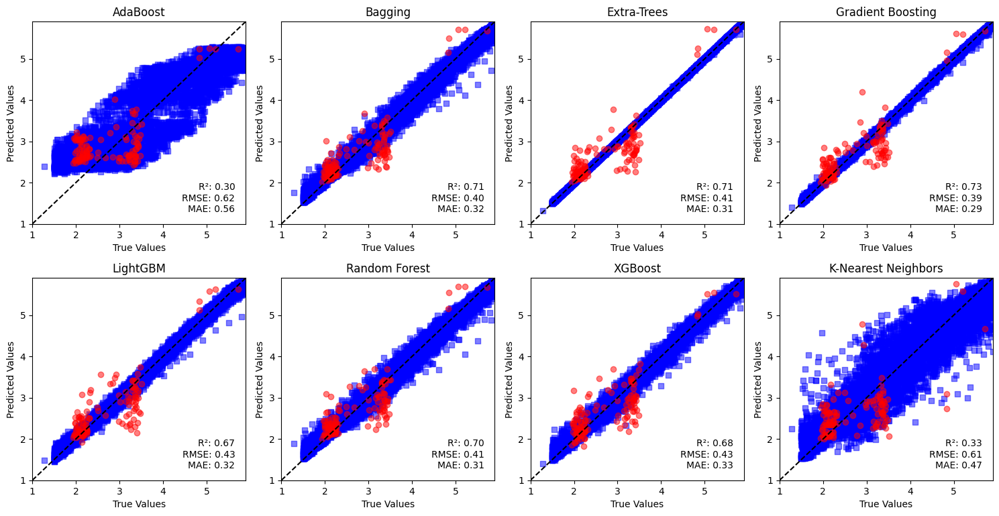

In [32]:
e_aug = BGEvalModel(models_genetic_subset)
e_aug.plotBG("../models/genetic_search/", "../data/data_processed/", type_label=True, type='_augmentated')

## Metodo 2:  SMOGN


In [13]:
s = Splitter("", "band_gap_mean")

s.features_train = pd.read_csv("../data/data_processed/features_train.csv")
s.label_train = pd.read_csv("../data/data_processed/label_train.csv")

In [41]:
import smogn

data_train = pd.concat([s.features_train,s.label_train], axis=1)

data_train_smogn = smogn.smoter(
    data = data_train.reset_index(drop=True), 
    y = "band_gap_mean",
        ## phi relevance arguments
    rel_thres = 0.80,         ## positive real number (0 < R < 1)
    rel_method = 'auto',      ## string ('auto' or 'manual')
    rel_xtrm_type = 'high',   ## string ('low' or 'both' or 'high')
    rel_coef = 0.7           ## positive real number (0 < R)
)

r_index: 100%|##########| 98/98 [00:02<00:00, 43.62it/s]


In [42]:
import copy
s_smogn = copy.copy(s)

In [45]:
data_train_ = pd.concat([data_train.reset_index(), data_train_smogn.reset_index()], axis=0).drop('index', axis=1).reset_index()
data_train_.drop('index', axis=1, inplace=True)

s_smogn.features_train_smogn = data_train_.iloc[:,:-1]
s_smogn.label_train_smogn = data_train_.iloc[:,-1].round(2)

s_smogn.features_train_smogn.to_csv("../data/data_processed/features_train_smogn.csv", index=False)
s_smogn.label_train_smogn.to_csv("../data/data_processed/label_train_smogn.csv", index=False)

In [46]:
print(s_smogn.features_train_smogn.shape)
print(s_smogn.label_train_smogn.shape)

(840, 901)
(840,)


gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.270225	0.0506258  	0.342332   	0.20418    
1  	100   	0.322565	0.02772    	0.344523   	0.242583   
2  	100   	0.338688	0.00756726 	0.348374   	0.302589   
3  	100   	0.341465	0.00342437 	0.348374   	0.334456   
4  	100   	0.342128	0.00297464 	0.348374   	0.335563   
5  	100   	0.342396	0.00227097 	0.346761   	0.336768   
6  	100   	0.342546	0.00246825 	0.347092   	0.331515   
7  	100   	0.340776	0.0101446  	0.346761   	0.285026   
8  	100   	0.339896	0.0107012  	0.346761   	0.281077   
9  	100   	0.343651	0.00380356 	0.352162   	0.326835   
10 	100   	0.342517	0.00660763 	0.353863   	0.306522   
AdaBoostRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.595357	0.109105   	0.768583   	0.414109   
1  	100   	0.66556 	0.0640146  	0.764679   	0.492778   
2  	100   	0.720473	0.039582   	0.764933   	0.57797    
3  	100   	0.747113	0.0117284  	0.766769   	0.695546   
4  	100   	0.756028	0.00889009 	0.766769   	0.742852   
5  	100   	0.761614	0.00605307 	0.76775    	0.746193   
6  	100   	0.765127	0.00252732 	0.76986    	0.754531   
7  	100   	0.766286	0.00187542 	0.76986    	0.760227   
8  	100   	0.767433	0.0016481  	0.770509   	0.760227   
9  	100   	0.767549	0.00366523 	0.7703     	0.746689   
10 	100   	0.768476	0.00161214 	0.77063    	0.763243   


[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    0.4s remaining:    3.4s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    0.4s remaining:    0.2s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    0.6s finished
[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    0.3s remaining:    2.7s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    0.3s remaining:    0.1s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    0.4s finished
[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    0.0s finished
[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent wo

BaggingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.656481	0.0780635  	0.77807    	0.476498   
1  	100   	0.734376	0.0397169  	0.779611   	0.60742    
2  	100   	0.76753 	0.0125331  	0.786057   	0.728531   
3  	100   	0.775111	0.0102517  	0.793316   	0.74726    
4  	100   	0.784047	0.00837506 	0.794481   	0.758696   
5  	100   	0.787887	0.00471222 	0.794481   	0.776465   
6  	100   	0.789897	0.00371738 	0.7951     	0.779058   
7  	100   	0.791364	0.00287476 	0.7951     	0.786334   
8  	100   	0.792884	0.00209577 	0.7951     	0.7867     
9  	100   	0.793598	0.00236637 	0.794481   	0.779243   
10 	100   	0.793474	0.0026846  	0.794481   	0.77964    
building tree 1 of 128
building tree 2 of 128


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 3 of 128
building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
building tree 43 of 128
building tree 44 of 128

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.7s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
building tree 43 of 128
building tree 44 of 128
building tree 45 of 128
building tree 46 of 1

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.6s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 128building tree 2 of 128

building tree 3 of 128
building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.6s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 128
building tree 2 of 128
building tree 3 of 128
building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.6s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 128building tree 2 of 128
building tree 3 of 128

building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.7s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 128building tree 2 of 128
building tree 3 of 128
building tree 4 of 128

building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.6s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished
c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\sit

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.755756	0.0114968  	0.787133   	0.728687   
1  	100   	0.763111	0.00851499 	0.787133   	0.744612   
2  	100   	0.768978	0.00620818 	0.787133   	0.755137   
3  	100   	0.775   	0.00638412 	0.787133   	0.763914   
4  	100   	0.778081	0.00769327 	0.789362   	0.75562    
5  	100   	0.780881	0.00642126 	0.789362   	0.767284   
6  	100   	0.784962	0.00464734 	0.789362   	0.771723   
7  	100   	0.786451	0.00296515 	0.789362   	0.778287   
8  	100   	0.787403	0.00247248 	0.789362   	0.77651    
9  	100   	0.787715	0.00303836 	0.789362   	0.775326   
10 	100   	0.787628	0.00370303 	0.789484   	0.770238   
      Iter       Train Loss   Remaining Time 
         1           0.5540            2.82s
         2           0.5041            2.78s
         3           0.4575            1.84s
         4           0.4147            2.07s
         5           0.3778            2.19s
         6           0.3452            1.81s
         7  

c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.735415	0.0595634  	0.786458   	0.428922   
1  	100   	0.769684	0.0129887  	0.793898   	0.730693   
2  	100   	0.77977 	0.00988168 	0.793898   	0.757608   
3  	100   	0.78816 	0.00514452 	0.793898   	0.769668   
4  	100   	0.791382	0.00349201 	0.795078   	0.782246   
5  	100   	0.792582	0.00306934 	0.795623   	0.782104   
6  	100   	0.792922	0.00269235 	0.795837   	0.781428   
7  	100   	0.793912	0.00145337 	0.795824   	0.789349   
8  	100   	0.794551	0.00142363 	0.79727    	0.789349   
9  	100   	0.794619	0.00251633 	0.799532   	0.781374   
10 	100   	0.794494	0.00283959 	0.799532   	0.78501    
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000054
[LightGBM] [Debug] init for col-wise cost 0.000008 seconds, init for row-wise cost 0.004654 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013883 seconds.
You can set `force_col_wise=true` to remove the

c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.678543	0.0887615  	0.777557   	0.306896   
1  	100   	0.729085	0.0255369  	0.775303   	0.660199   
2  	100   	0.746416	0.0169396  	0.792625   	0.714217   
3  	100   	0.755942	0.0139475  	0.792625   	0.720247   
4  	100   	0.768224	0.012602   	0.794089   	0.738287   
5  	100   	0.780242	0.00978141 	0.79445    	0.754719   
6  	100   	0.785014	0.00799418 	0.795041   	0.763096   
7  	100   	0.789207	0.00739165 	0.795956   	0.758674   
8  	100   	0.792955	0.0047271  	0.795956   	0.763778   
9  	100   	0.793058	0.00677237 	0.796132   	0.754648   
10 	100   	0.792159	0.0127129  	0.796132   	0.708894   


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885building tree 2 of 885
building tree 3 of 885

building tree 4 of 885
building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    1.2s


building tree 144 of 885
building tree 145 of 885
building tree 146 of 885
building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885
building tree 180 of 885
building tree 181 of 885
building tree 182 of 885
building tree 183 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    3.5s


building tree 343 of 885
building tree 344 of 885
building tree 345 of 885
building tree 346 of 885
building tree 347 of 885
building tree 348 of 885
building tree 349 of 885
building tree 350 of 885
building tree 351 of 885
building tree 352 of 885
building tree 353 of 885
building tree 354 of 885
building tree 355 of 885
building tree 356 of 885
building tree 357 of 885
building tree 358 of 885
building tree 359 of 885
building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885
building tree 382 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    6.6s


building tree 639 of 885
building tree 640 of 885
building tree 641 of 885
building tree 642 of 885
building tree 643 of 885
building tree 644 of 885
building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885
building tree 674 of 885
building tree 675 of 885
building tree 676 of 885
building tree 677 of 885
building tree 678 of 885b

[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885building tree 2 of 885
building tree 3 of 885

building tree 4 of 885
building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    0.9s


building tree 145 of 885
building tree 146 of 885
building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885
building tree 180 of 885
building tree 181 of 885
building tree 182 of 885
building tree 183 of 885
building tree 184 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    2.4s


building tree 342 of 885
building tree 343 of 885
building tree 344 of 885
building tree 345 of 885
building tree 346 of 885
building tree 347 of 885
building tree 348 of 885
building tree 349 of 885
building tree 350 of 885
building tree 351 of 885
building tree 352 of 885
building tree 353 of 885
building tree 354 of 885
building tree 355 of 885
building tree 356 of 885
building tree 357 of 885
building tree 358 of 885
building tree 359 of 885
building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    4.6s


building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885
building tree 674 of 885
building tree 675 of 885
building tree 676 of 885
building tree 677 of 885
building tree 678 of 885
building tree 679 of 885
building tree 680 of 885
building tree 681 of 885
building tree 682 of 885
building tree 683 of 885
building tree 684 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    6.8s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885
building tree 2 of 885
building tree 3 of 885
building tree 4 of 885
building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    0.9s


building tree 143 of 885
building tree 144 of 885
building tree 145 of 885
building tree 146 of 885
building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885
building tree 180 of 885
building tree 181 of 885
building tree 182 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    2.5s


building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885
building tree 382 of 885
building tree 383 of 885
building tree 384 of 885
building tree 385 of 885
building tree 386 of 885
building tree 387 of 885
building tree 388 of 885
building tree 389 of 885
building tree 390 of 885
building tree 391 of 885
building tree 392 of 885
building tree 393 of 885
building tree 394 of 885
building tree 395 of 885
building tree 396 of 885
building tree 397 of 885
building tree 398 of 885
building tree 399 of 885
building tree 400 of 885
building tree 401 of 885
building tree 402 of 885
building tree 403 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    4.8s


building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885
building tree 674 of 885
building tree 675 of 885
building tree 676 of 885
building tree 677 of 885
building tree 678 of 885
building tree 679 of 885
building tree 680 of 885
building tree 681 of 885
building tree 682 of 885
building tree 683 of 885
building tree 684 of 885
building tree 685 of 885
building tree 686 of 885
building tree 687 of 885
building tree 688 of 885
building tree 689 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    7.1s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885building tree 2 of 885
building tree 3 of 885
building tree 4 of 885
building tree 5 of 885

building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    0.9s


building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885
building tree 180 of 885
building tree 181 of 885
building tree 182 of 885
building tree 183 of 885
building tree 184 of 885
building tree 185 of 885
building tree 186 of 885
building tree 187 of 885
building tree 188 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    2.4s


building tree 343 of 885building tree 344 of 885

building tree 345 of 885
building tree 346 of 885
building tree 347 of 885
building tree 348 of 885
building tree 349 of 885
building tree 350 of 885
building tree 351 of 885
building tree 352 of 885
building tree 353 of 885
building tree 354 of 885
building tree 355 of 885
building tree 356 of 885
building tree 357 of 885
building tree 358 of 885
building tree 359 of 885
building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885
building tree 382 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    4.7s


building tree 626 of 885building tree 627 of 885

building tree 628 of 885
building tree 629 of 885
building tree 630 of 885
building tree 631 of 885
building tree 632 of 885
building tree 633 of 885
building tree 634 of 885
building tree 635 of 885
building tree 636 of 885
building tree 637 of 885
building tree 638 of 885
building tree 639 of 885
building tree 640 of 885
building tree 641 of 885
building tree 642 of 885
building tree 643 of 885
building tree 644 of 885
building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    6.9s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885building tree 2 of 885
building tree 3 of 885
building tree 4 of 885

building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    0.9s


building tree 140 of 885
building tree 141 of 885
building tree 142 of 885
building tree 143 of 885
building tree 144 of 885
building tree 145 of 885
building tree 146 of 885
building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    2.6s


building tree 344 of 885
building tree 345 of 885
building tree 346 of 885
building tree 347 of 885
building tree 348 of 885
building tree 349 of 885
building tree 350 of 885
building tree 351 of 885
building tree 352 of 885
building tree 353 of 885
building tree 354 of 885
building tree 355 of 885
building tree 356 of 885
building tree 357 of 885
building tree 358 of 885
building tree 359 of 885
building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885building tree 368 of 885
building tree 369 of 885

building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885
building tree 382 of 885
building tree 383 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    4.9s


building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885
building tree 674 of 885building tree 675 of 885

building tree 676 of 885
building tree 677 of 885
building tree 678 of 885
building tree 679 of 885
building tree 680 of 885
building tree 681 of 885
building tree 682 of 885
building tree 683 of 885
building tree 684 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    7.2s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885
building tree 2 of 885
building tree 3 of 885
building tree 4 of 885
building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    0.9s


building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885
building tree 179 of 885
building tree 180 of 885
building tree 181 of 885
building tree 182 of 885
building tree 183 of 885
building tree 184 of 885
building tree 185 of 885
building tree 186 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    2.6s


building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885
building tree 382 of 885
building tree 383 of 885
building tree 384 of 885
building tree 385 of 885
building tree 386 of 885
building tree 387 of 885
building tree 388 of 885
building tree 389 of 885
building tree 390 of 885
building tree 391 of 885
building tree 392 of 885
building tree 393 of 885
building tree 394 of 885
building tree 395 of 885
building tree 396 of 885
building tree 397 of 885
building tree 398 of 885
building tree 399 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    4.8s


building tree 634 of 885
building tree 635 of 885
building tree 636 of 885
building tree 637 of 885
building tree 638 of 885
building tree 639 of 885
building tree 640 of 885
building tree 641 of 885
building tree 642 of 885
building tree 643 of 885
building tree 644 of 885
building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    7.0s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished
c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)


RandomForestRegressor


c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwar

gen	nevals	fitness	fitness_std	fitness_max	fitness_min
0  	50    	0.72218	0.0347123  	0.766953   	0.589154   
1  	100   	0.747942	0.0145944  	0.776052   	0.708417   
2  	100   	0.761616	0.00775629 	0.775077   	0.74438    
3  	100   	0.765691	0.00883112 	0.790693   	0.748932   
4  	100   	0.768986	0.00769813 	0.790693   	0.755061   
5  	100   	0.773722	0.00896246 	0.793207   	0.76036    
6  	100   	0.776792	0.0101961  	0.793207   	0.731428   
7  	100   	0.782949	0.00754208 	0.793207   	0.763426   
8  	100   	0.785953	0.00688322 	0.793363   	0.759381   
9  	100   	0.788871	0.00869883 	0.795158   	0.73761    
10 	100   	0.791597	0.00166235 	0.793207   	0.785318   


c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: [18:03:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)
c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: [18:03:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)
c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: [18:03:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)
c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: 

XGBRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`sha

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.418455	0.196701   	0.680019   	0.161251   
1  	100   	0.588288	0.127129   	0.680029   	0.209961   
2  	100   	0.657811	0.0198694  	0.680029   	0.612741   
3  	100   	0.671999	0.0107783  	0.680029   	0.631902   
4  	100   	0.67501 	0.00785289 	0.680029   	0.650137   
5  	100   	0.676904	0.00641346 	0.680029   	0.650137   
6  	100   	0.678503	0.00554699 	0.680029   	0.640572   
7  	100   	0.677748	0.00807796 	0.680029   	0.640572   
8  	100   	0.67835 	0.00772723 	0.680029   	0.640572   
9  	100   	0.678997	0.00658613 	0.680029   	0.632999   
10 	100   	0.679938	0.000444916	0.680029   	0.677759   
KNeighborsRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

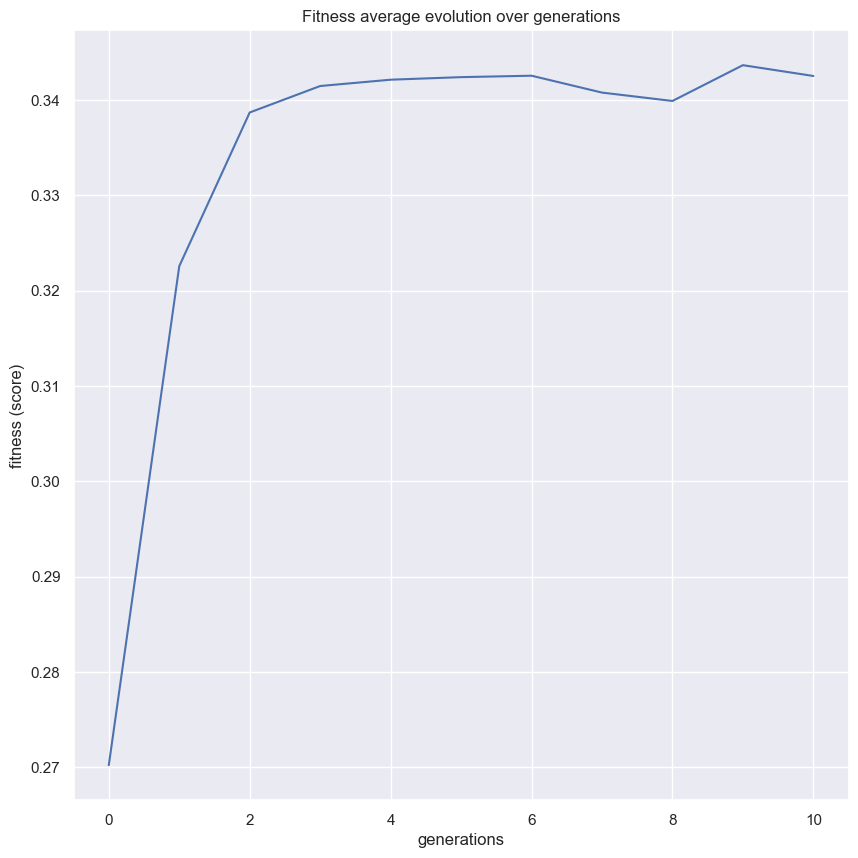

<Figure size 1000x1000 with 0 Axes>

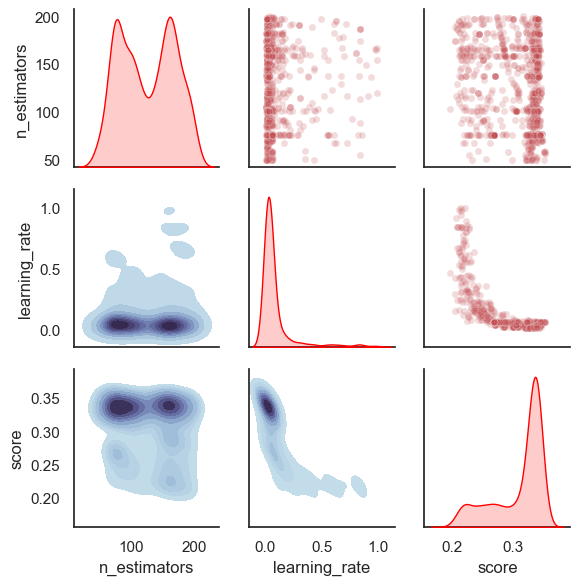

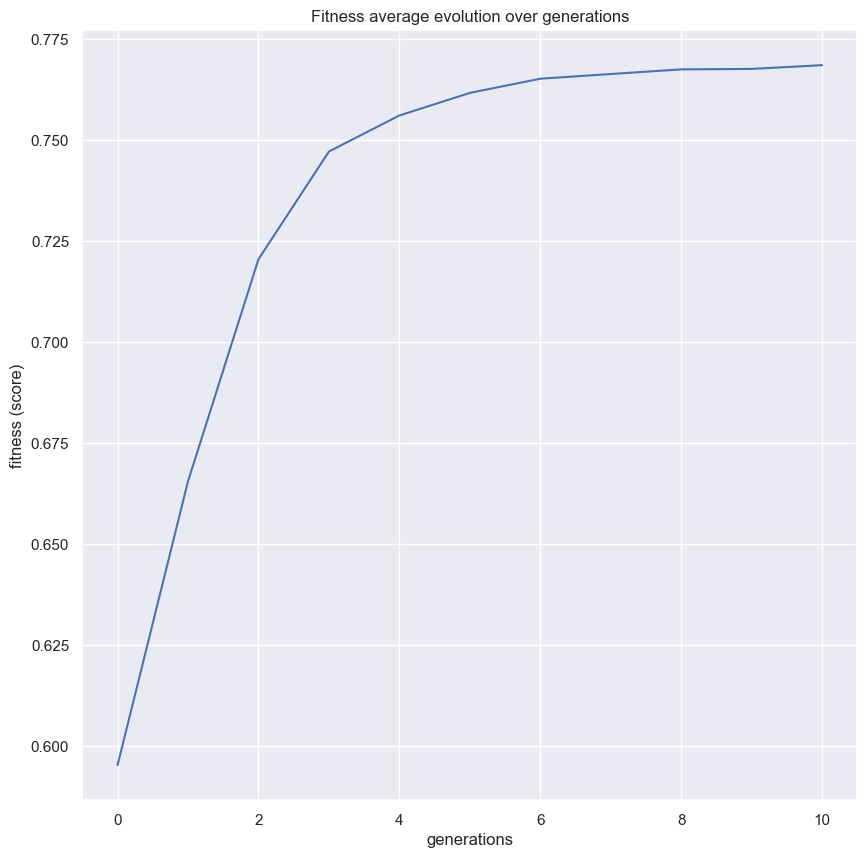

<Figure size 1000x1000 with 0 Axes>

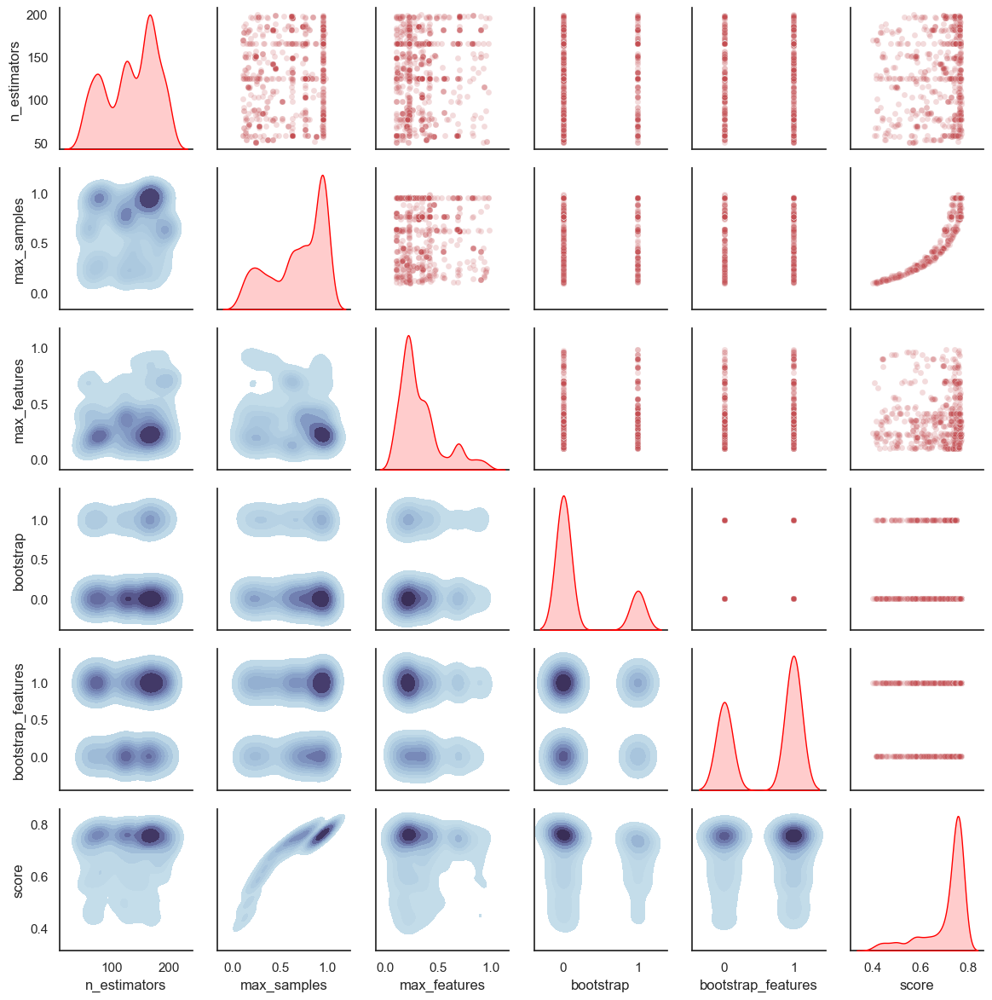

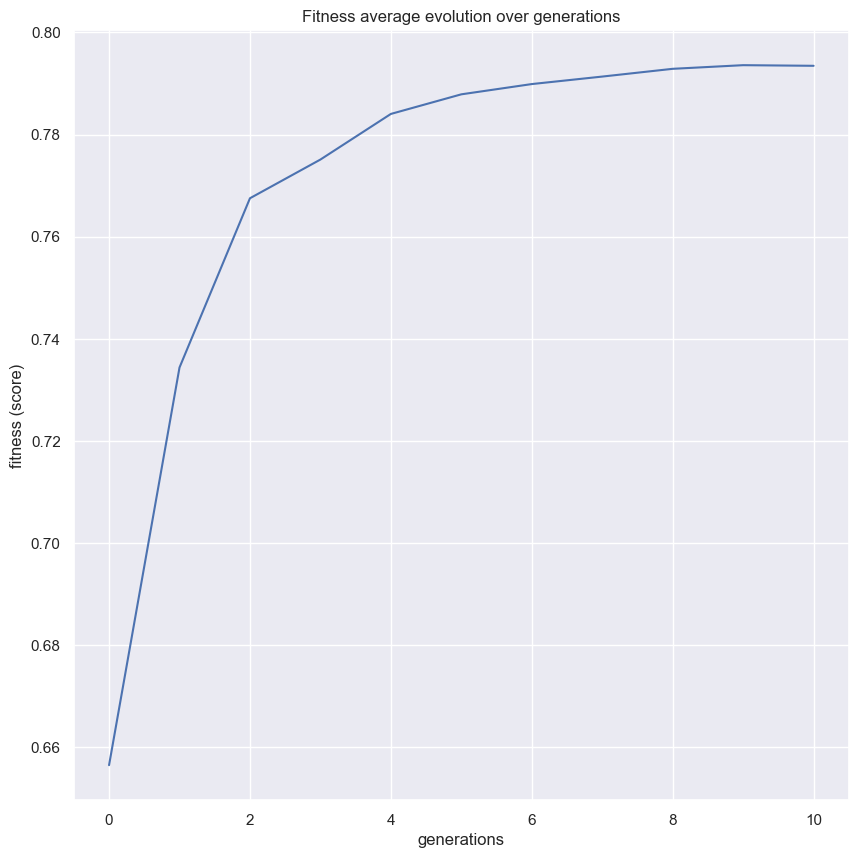

<Figure size 1000x1000 with 0 Axes>

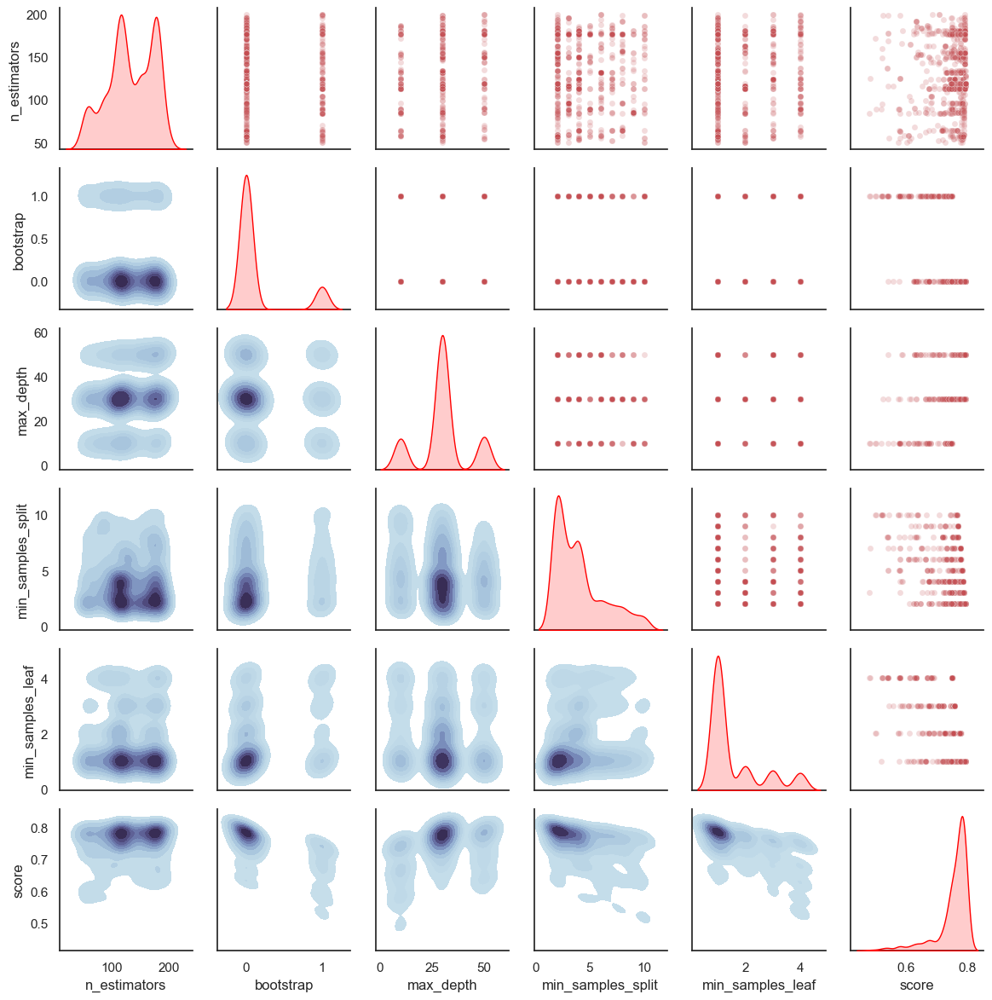

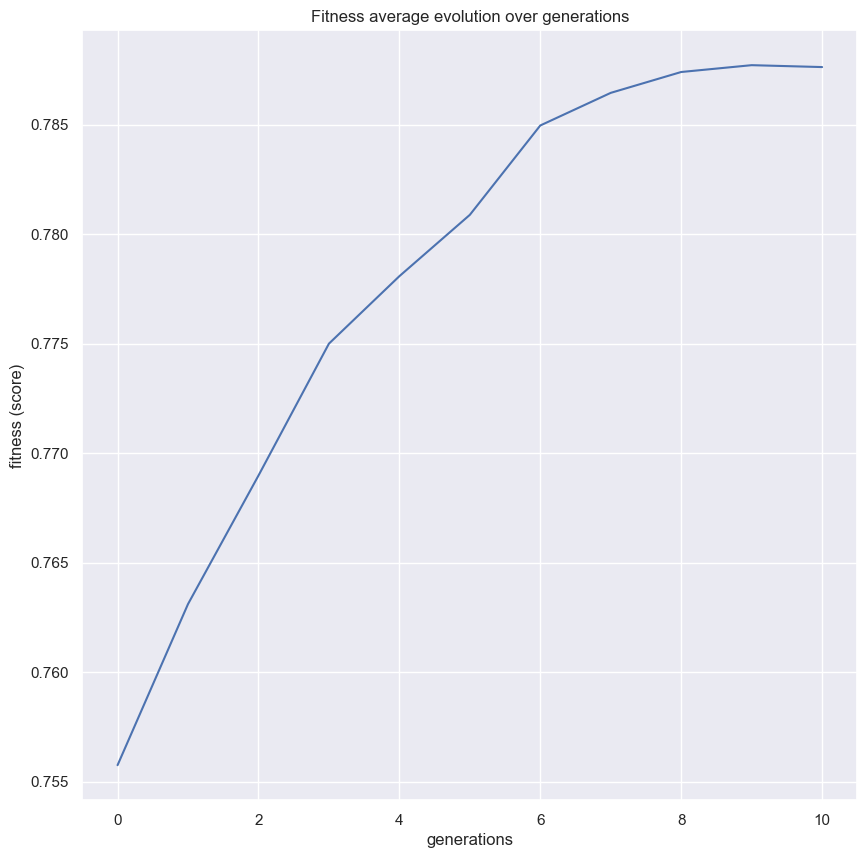

<Figure size 1000x1000 with 0 Axes>

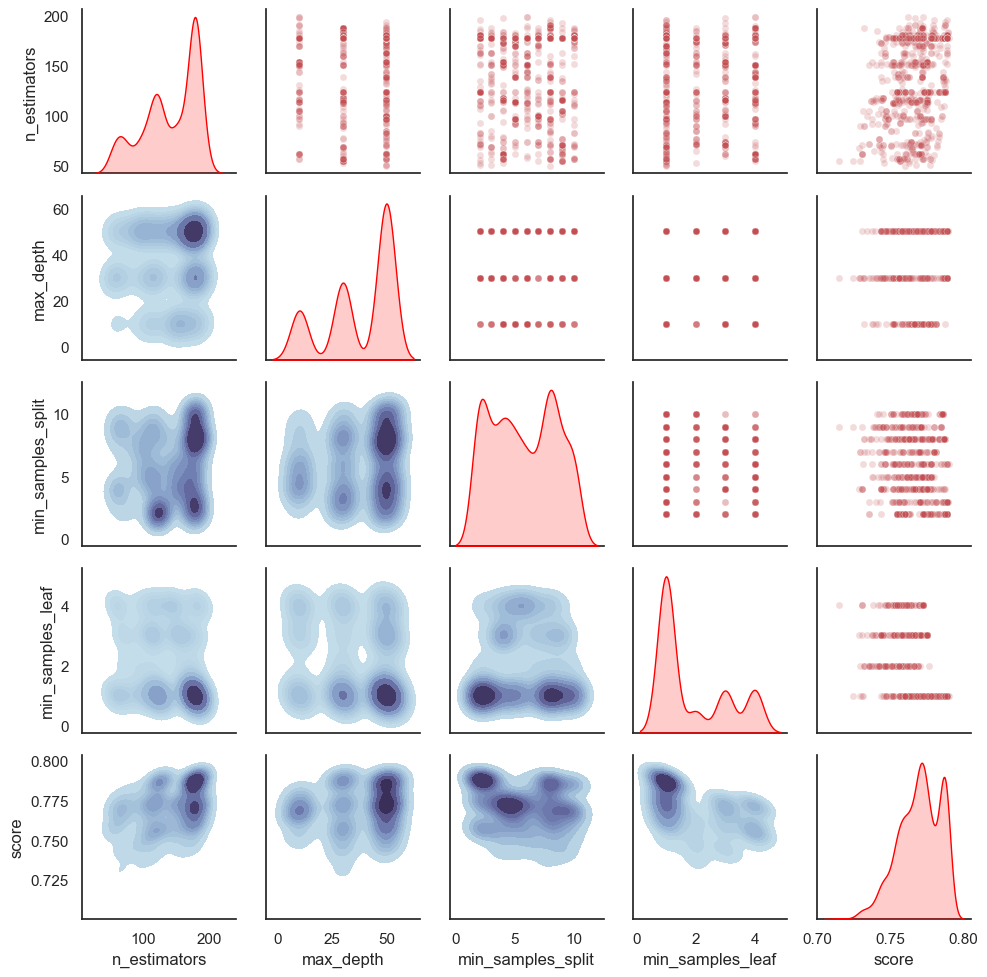

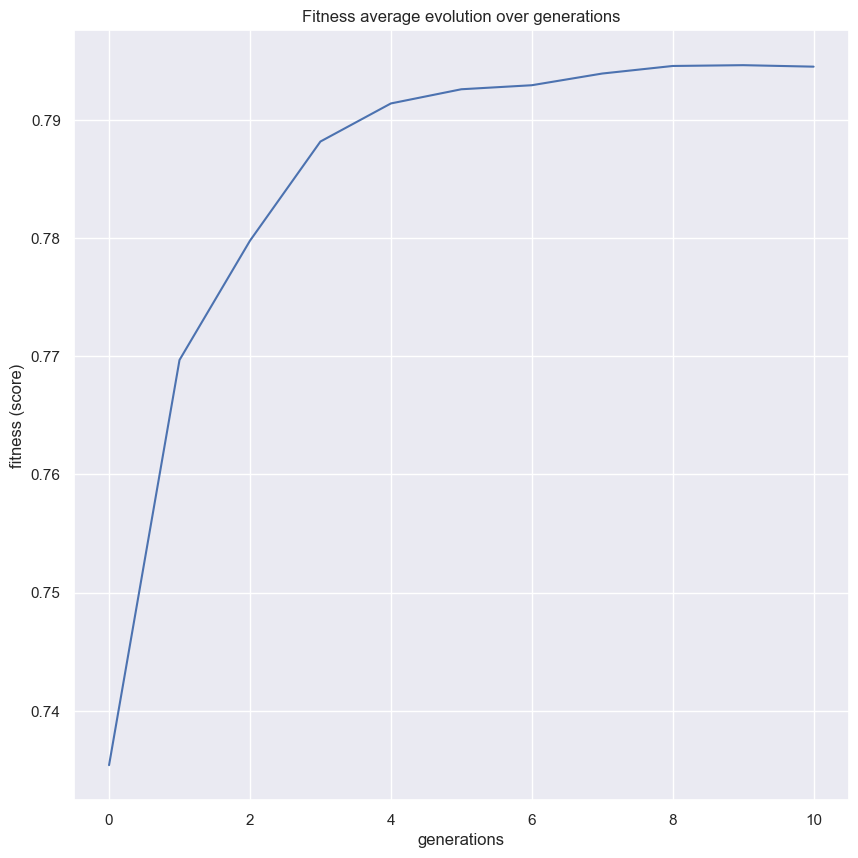

<Figure size 1000x1000 with 0 Axes>

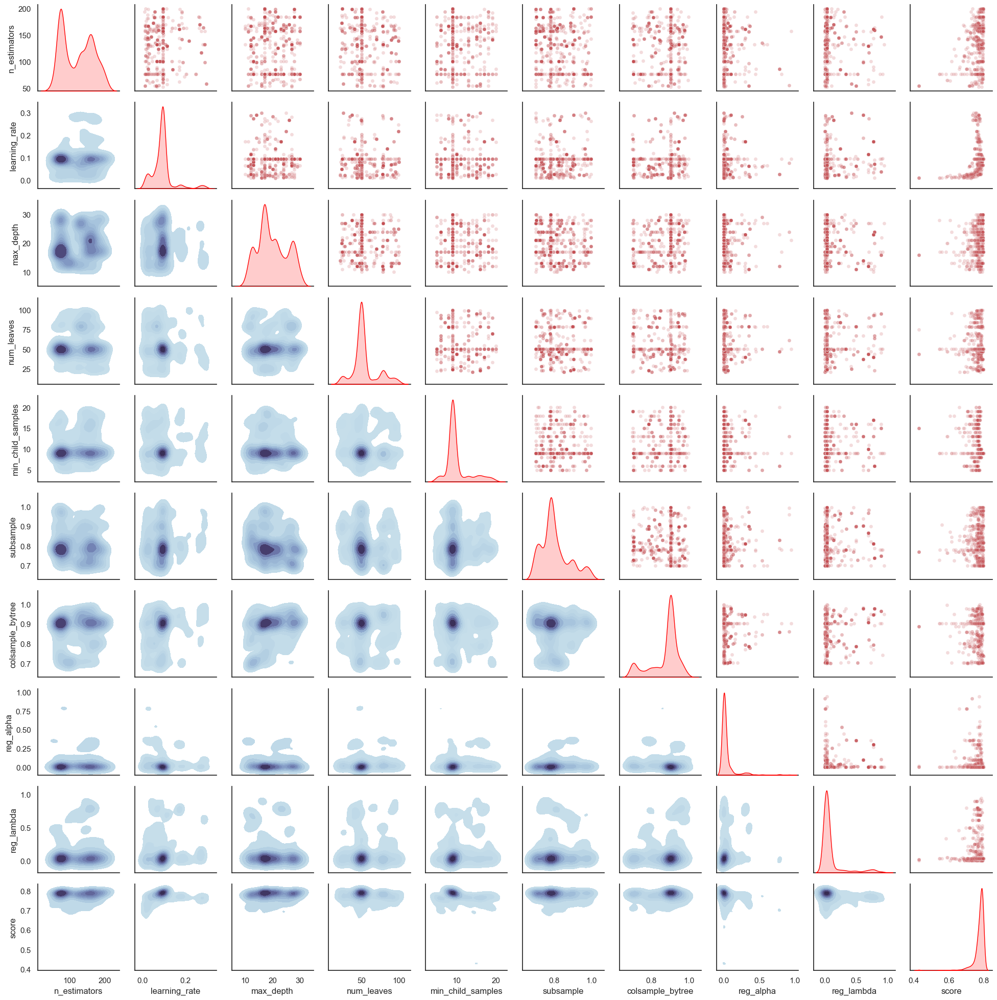

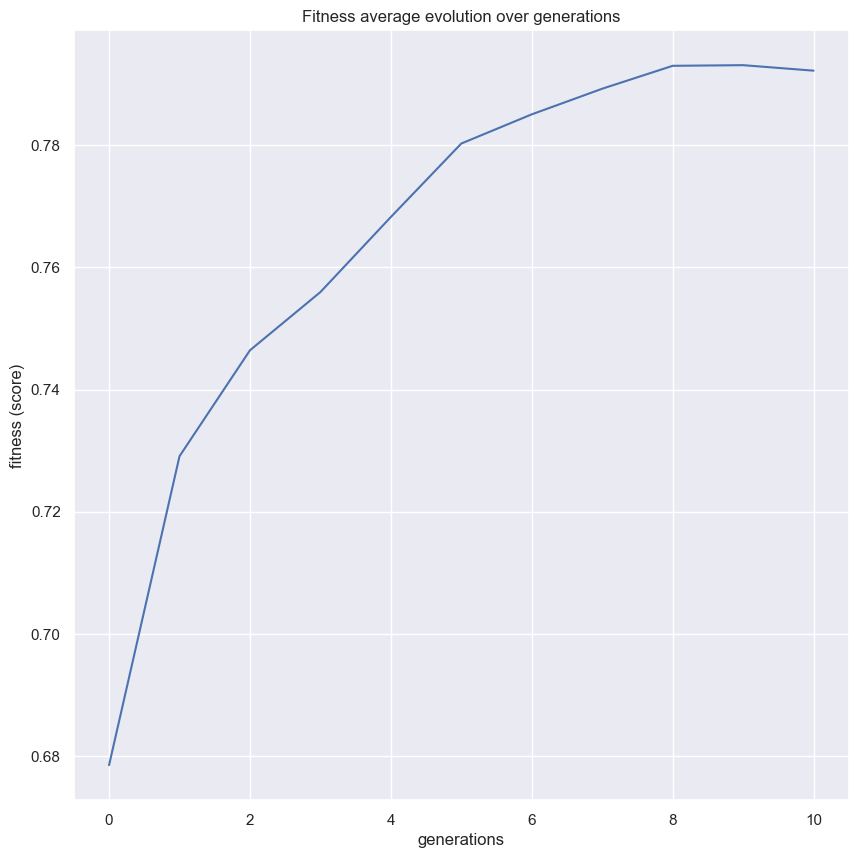

<Figure size 1000x1000 with 0 Axes>

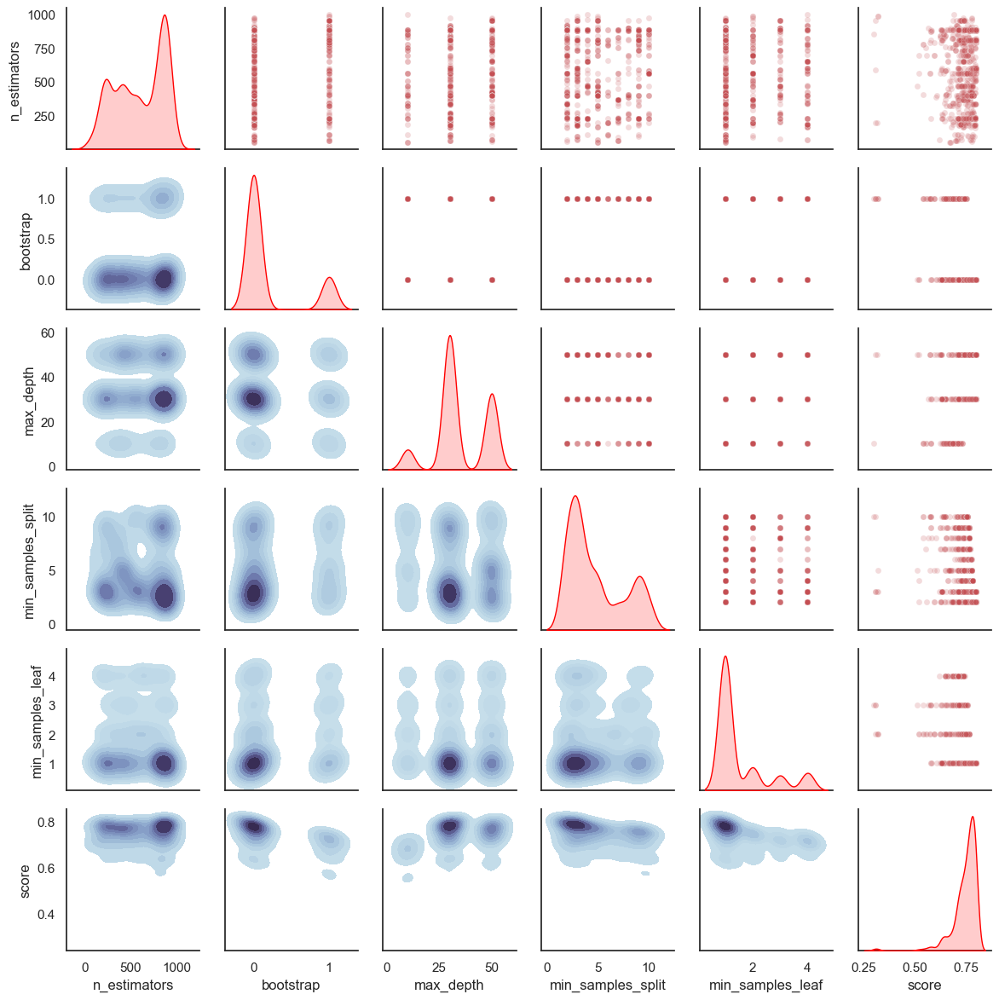

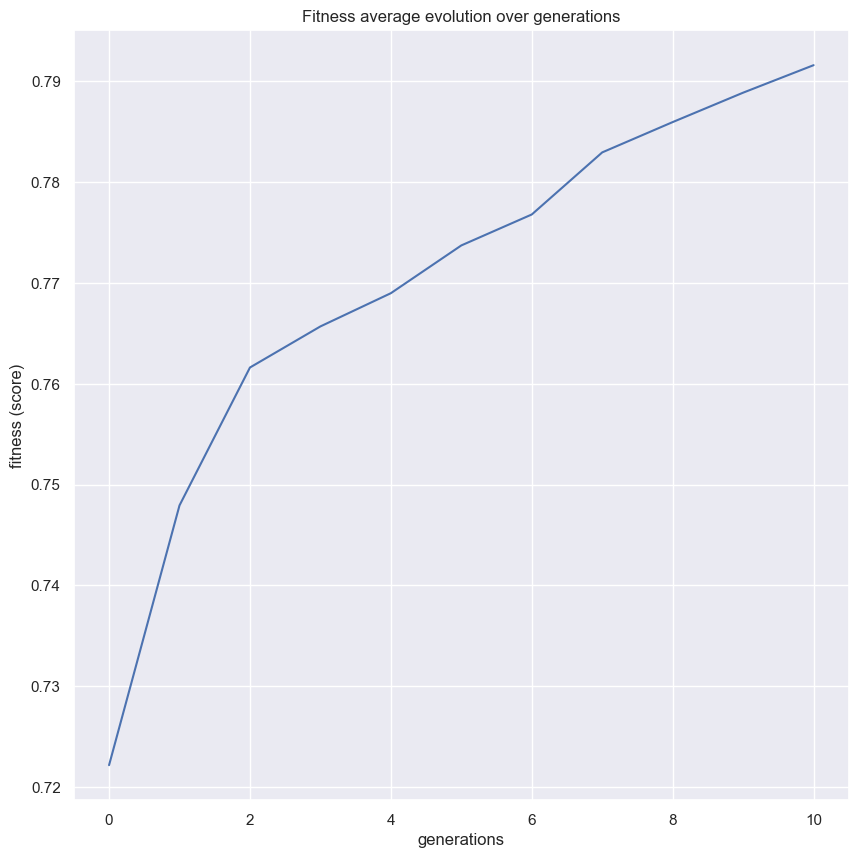

<Figure size 1000x1000 with 0 Axes>

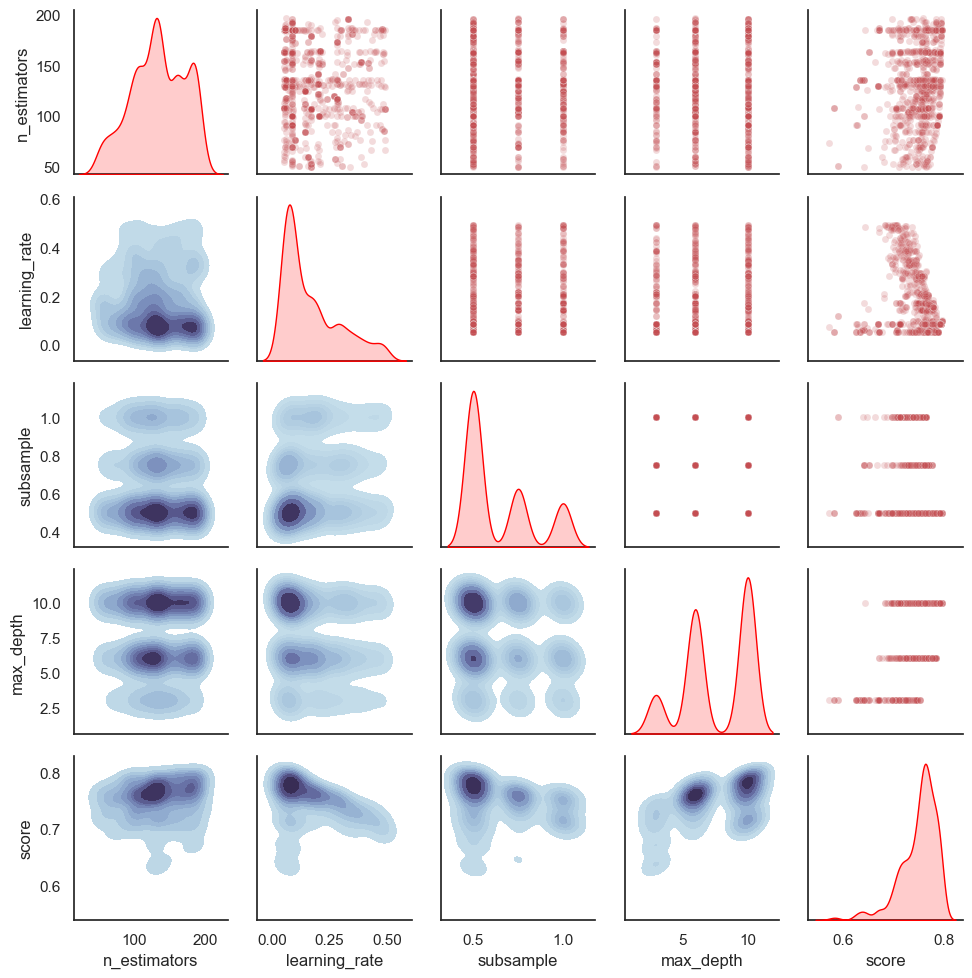

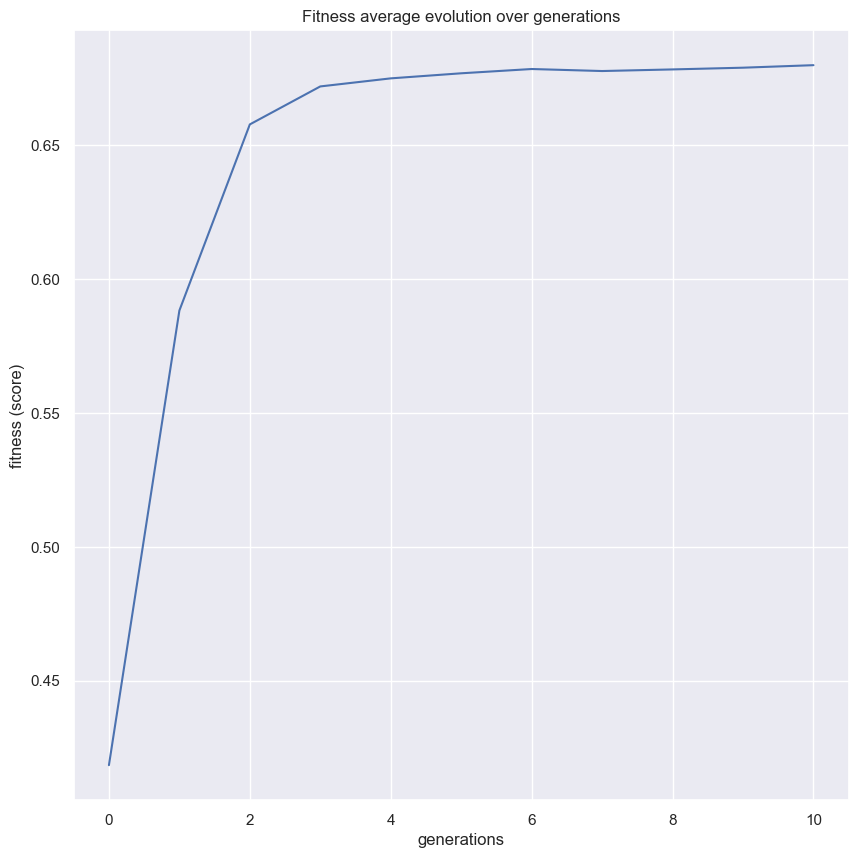

<Figure size 1000x1000 with 0 Axes>

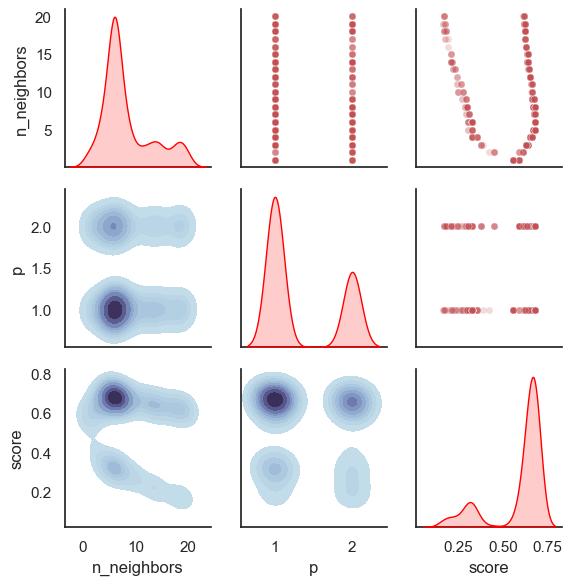

In [47]:
from sklearn.pipeline import Pipeline

mg_smogn = BGModelDev("../data/data_processed/features_train_smogn.csv", "../data/data_processed/label_train_smogn.csv", models_genetic_subset)
mg_smogn.genetic_search("../reports/genetic_search/", -1, models_genetic_subset, score='r2', generations=10) ##### %Obs: take a coffee

In [48]:
mg_smogn.summary_cv_scores

[{'model': 'AdaBoostRegressor',
  'mean_absolute_error': '-0.4643 ± 0.0226',
  'mean_absolute_percentage_error': '-0.1747 ± 0.0070',
  'mean_squared_error': '-0.2987 ± 0.0407',
  'root_mean_squared_error': '-0.5453 ± 0.0357',
  'r2': '0.3539 ± 0.0384',
  'explained_variance': '0.3550 ± 0.0373'},
 {'model': 'BaggingRegressor',
  'mean_absolute_error': '-0.1615 ± 0.0210',
  'mean_absolute_percentage_error': '-0.0630 ± 0.0062',
  'mean_squared_error': '-0.1051 ± 0.0214',
  'root_mean_squared_error': '-0.3223 ± 0.0350',
  'r2': '0.7732 ± 0.0366',
  'explained_variance': '0.7756 ± 0.0375'},
 {'model': 'ExtraTreesRegressor',
  'mean_absolute_error': '-0.1501 ± 0.0167',
  'mean_absolute_percentage_error': '-0.0594 ± 0.0048',
  'mean_squared_error': '-0.0952 ± 0.0210',
  'root_mean_squared_error': '-0.3065 ± 0.0351',
  'r2': '0.7951 ± 0.0338',
  'explained_variance': '0.7980 ± 0.0337'},
 {'model': 'GradientBoostingRegressor',
  'mean_absolute_error': '-0.1614 ± 0.0254',
  'mean_absolute_percen

In [49]:
mg_smogn.train_best_models("../reports/genetic_search/","genetic_search","../models/genetic_search/")
mg_smogn.predict("../models/genetic_search/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")

[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    3.0s remaining:   21.8s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    3.1s remaining:    1.5s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 128building tree 2 of 128

building tree 3 of 128
building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:    0.7s finished


      Iter       Train Loss   Remaining Time 
         1           0.5540            1.95s
         2           0.5041            1.86s
         3           0.4575            1.88s
         4           0.4147            1.79s
         5           0.3778            1.77s
         6           0.3452            1.76s
         7           0.3146            1.72s
         8           0.2869            1.71s
         9           0.2624            1.70s
        10           0.2401            1.71s
        11           0.2202            1.68s
        12           0.2029            1.71s
        13           0.1871            1.72s
        14           0.1728            1.72s
        15           0.1591            1.69s
        16           0.1470            1.69s
        17           0.1362            1.68s
        18           0.1260            1.67s
        19           0.1176            1.67s
        20           0.1098            1.67s
        21           0.1028            1.67s
        2

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.


building tree 1 of 885building tree 2 of 885

building tree 3 of 885
building tree 4 of 885
building tree 5 of 885
building tree 6 of 885
building tree 7 of 885
building tree 8 of 885
building tree 9 of 885
building tree 10 of 885
building tree 11 of 885
building tree 12 of 885
building tree 13 of 885
building tree 14 of 885
building tree 15 of 885
building tree 16 of 885
building tree 17 of 885
building tree 18 of 885
building tree 19 of 885
building tree 20 of 885
building tree 21 of 885
building tree 22 of 885
building tree 23 of 885
building tree 24 of 885
building tree 25 of 885
building tree 26 of 885
building tree 27 of 885
building tree 28 of 885
building tree 29 of 885
building tree 30 of 885
building tree 31 of 885
building tree 32 of 885
building tree 33 of 885
building tree 34 of 885
building tree 35 of 885
building tree 36 of 885
building tree 37 of 885
building tree 38 of 885
building tree 39 of 885
building tree 40 of 885
building tree 41 of 885
building tree 42 of 885
b

[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    1.2s


building tree 139 of 885
building tree 140 of 885
building tree 141 of 885
building tree 142 of 885
building tree 143 of 885
building tree 144 of 885
building tree 145 of 885
building tree 146 of 885
building tree 147 of 885
building tree 148 of 885
building tree 149 of 885
building tree 150 of 885
building tree 151 of 885
building tree 152 of 885
building tree 153 of 885
building tree 154 of 885
building tree 155 of 885
building tree 156 of 885
building tree 157 of 885
building tree 158 of 885
building tree 159 of 885
building tree 160 of 885
building tree 161 of 885
building tree 162 of 885
building tree 163 of 885
building tree 164 of 885
building tree 165 of 885
building tree 166 of 885
building tree 167 of 885
building tree 168 of 885
building tree 169 of 885
building tree 170 of 885
building tree 171 of 885
building tree 172 of 885
building tree 173 of 885
building tree 174 of 885
building tree 175 of 885
building tree 176 of 885
building tree 177 of 885
building tree 178 of 885


[Parallel(n_jobs=-1)]: Done 317 tasks      | elapsed:    3.4s


building tree 342 of 885
building tree 343 of 885
building tree 344 of 885
building tree 345 of 885
building tree 346 of 885
building tree 347 of 885
building tree 348 of 885
building tree 349 of 885
building tree 350 of 885
building tree 351 of 885
building tree 352 of 885
building tree 353 of 885
building tree 354 of 885
building tree 355 of 885
building tree 356 of 885
building tree 357 of 885
building tree 358 of 885
building tree 359 of 885
building tree 360 of 885
building tree 361 of 885
building tree 362 of 885
building tree 363 of 885
building tree 364 of 885
building tree 365 of 885
building tree 366 of 885
building tree 367 of 885
building tree 368 of 885
building tree 369 of 885
building tree 370 of 885
building tree 371 of 885
building tree 372 of 885
building tree 373 of 885
building tree 374 of 885
building tree 375 of 885
building tree 376 of 885
building tree 377 of 885
building tree 378 of 885
building tree 379 of 885
building tree 380 of 885
building tree 381 of 885


[Parallel(n_jobs=-1)]: Done 600 tasks      | elapsed:    6.4s


building tree 639 of 885
building tree 640 of 885
building tree 641 of 885
building tree 642 of 885
building tree 643 of 885
building tree 644 of 885
building tree 645 of 885
building tree 646 of 885
building tree 647 of 885
building tree 648 of 885
building tree 649 of 885
building tree 650 of 885
building tree 651 of 885
building tree 652 of 885
building tree 653 of 885
building tree 654 of 885
building tree 655 of 885
building tree 656 of 885
building tree 657 of 885
building tree 658 of 885
building tree 659 of 885
building tree 660 of 885
building tree 661 of 885
building tree 662 of 885
building tree 663 of 885
building tree 664 of 885
building tree 665 of 885
building tree 666 of 885
building tree 667 of 885
building tree 668 of 885
building tree 669 of 885
building tree 670 of 885
building tree 671 of 885
building tree 672 of 885
building tree 673 of 885
building tree 674 of 885
building tree 675 of 885
building tree 676 of 885
building tree 677 of 885
building tree 678 of 885


[Parallel(n_jobs=-1)]: Done 885 out of 885 | elapsed:    9.4s finished
c:\anaconda3\envs\py310\lib\site-packages\xgboost\core.py:160: UserWarning: [13:59:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "verbose" } are not used.

  warnings.warn(smsg, UserWarning)


AdaBoostRegressor
r2: 0.5885666273334684

BaggingRegressor
r2: 0.7382118186535471

ExtraTreesRegressor


[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   3 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  16 out of  24 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=24)]: Done  24 out of  24 | elapsed:    0.0s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 128 out of 128 | elapsed:    0.0s finished


r2: 0.7217372135602393

GradientBoostingRegressor
r2: 0.6344732664764587

LGBMRegressor
r2: 0.6882687400021057

RandomForestRegressor
r2: 0.7120705510690539

XGBRegressor
r2: 0.7024436490826642

KNeighborsRegressor
r2: 0.39781303213363617



[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done 114 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 317 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 600 tasks      | elapsed:    0.0s
[Parallel(n_jobs=24)]: Done 885 out of 885 | elapsed:    0.0s finished


In [50]:
e_smogn = BGEvalModel(models_genetic_subset)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Val --------- ")
e_smogn.performance("../models/genetic_search/", set='test', report_location="../reports/genetic_search/")

 -------- Results on Val --------- 
Model:  AdaBoostRegressor
MAE:  0.40653225806451615
MAPE:  0.1595660296887328
MSE:  0.2295991935483871
RMSE:  0.4791651005116995
E-VAR:  0.5982410109186745
R2:  0.5887420505039961 

Model:  BaggingRegressor
MAE:  0.2557258064516129
MAPE:  0.09502327649294676
MSE:  0.14620887096774193
RMSE:  0.3823726859593163
E-VAR:  0.7384356384386555
R2:  0.7381107505517117 

Model:  ExtraTreesRegressor
MAE:  0.2719354838709677
MAPE:  0.09944666788808623
MSE:  0.15510967741935486
RMSE:  0.39383965953082334
E-VAR:  0.7221810975336991
R2:  0.7221676309197184 

Model:  GradientBoostingRegressor
MAE:  0.33161290322580644
MAPE:  0.12269361758068086
MSE:  0.20393709677419353
RMSE:  0.45159395121524104
E-VAR:  0.6347527641506618
R2:  0.6347079841643802 

Model:  LGBMRegressor
MAE:  0.28572580645161305
MAPE:  0.10427799503916646
MSE:  0.1739137096774194
RMSE:  0.4170296268581159
E-VAR:  0.6884956557355658
R2:  0.6884858586574018 

Model:  RandomForestRegressor
MAE:  0.2782

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   3 out of  16 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  12 out of  16 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 128 out of 128 | elapsed:    0.0s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 130 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 333 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 616 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 885 out of 885 | elapsed:    0.0s finished


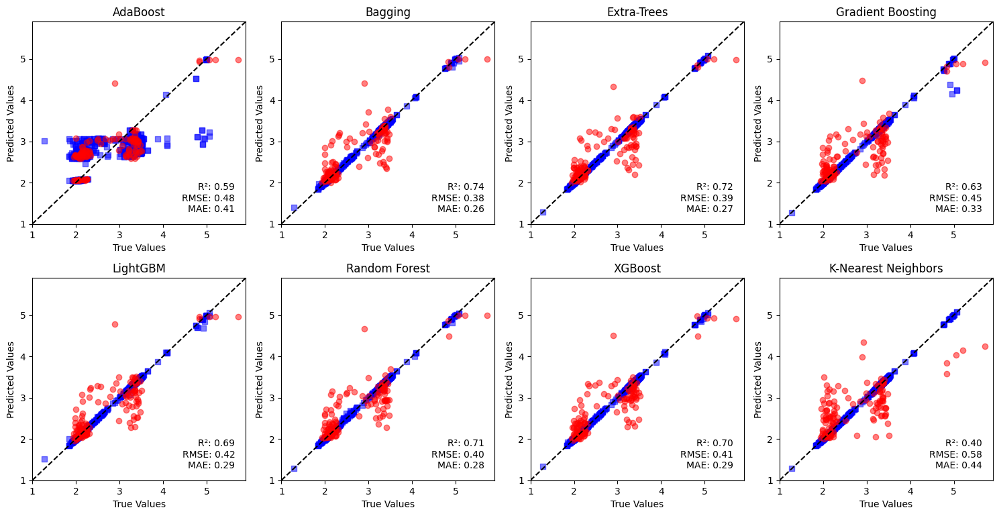

In [34]:
e_aug = BGEvalModel(models_genetic_subset)
e_aug.plotBG("../models/genetic_search/", "../data/data_processed/", type='_smogn', type_label=True)

# Genetic Search - PCA

In [32]:
models_genetic_subset_pca = [
    (   sklearn.ensemble.AdaBoostRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50,200),
            'rg__learning_rate': Continuous(0.01,1, distribution='log-uniform'),
            'rg__loss':Categorical(['linear','square', 'exponential'])
        }
    ),
    (   sklearn.ensemble.BaggingRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__max_samples': Continuous(0.1, 1.0, distribution='log-uniform'),
            'rg__max_features': Continuous(0.1, 1.0, distribution='log-uniform'),
            'rg__bootstrap': Categorical([True, False]),
            'rg__bootstrap_features': Categorical([True, False]),
        }
    ),
    (   sklearn.ensemble.ExtraTreesRegressor(random_state=123),
        {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__bootstrap': Categorical([True, False]),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)         
        }
    ),
    (   sklearn.ensemble.GradientBoostingRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__loss': Categorical(['squared_error', 'absolute_error']),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)   
        }
    ), #  LightGBM
    (
        lgb.LGBMRegressor(random_state=123),
        {   
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__learning_rate': Continuous(0.01, 0.3, distribution='log-uniform'),
            'rg__max_depth': Integer(10, 30),
            'rg__num_leaves': Integer(20, 100),
            'rg__min_child_samples': Integer(5, 20),
            'rg__subsample': Continuous(0.7, 1.0, distribution='uniform'),
            'rg__colsample_bytree': Continuous(0.7, 1.0, distribution='uniform'),
            'rg__reg_alpha': Continuous(1e-3, 1.0, distribution='log-uniform'), # Regularización L1
            'rg__reg_lambda': Continuous(1e-3, 1.0, distribution='log-uniform'),# Regularización L2
        }
    ),
    (
        sklearn.ensemble.RandomForestRegressor(random_state=123),
          {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 1000),
            'rg__bootstrap': Categorical([True, False]),
            'rg__criterion': Categorical(['squared_error', 'absolute_error', 'friedman_mse', 'poisson']),
            'rg__max_depth': Categorical([10, 30, 50, None]),
            'rg__max_features': Categorical(['sqrt', 'log2', 1.0]),
            'rg__min_samples_split': Integer(2, 10),
            'rg__min_samples_leaf': Integer(1, 4)
          }
    ),  
    (
        XGBRegressor(random_state=123),
           {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_estimators': Integer(50, 200),
            'rg__learning_rate': Continuous(0.05, 0.5),
            'rg__subsample': Categorical([0.5, 0.75, 1]),
            'rg__max_depth': Categorical([3, 6, 10]),
           }
    ),
    (
        sklearn.neighbors.KNeighborsRegressor(),
           {
            'pca__n_components': Continuous(0.9, 0.99),
            'rg__n_neighbors': Integer(1, 20),
            'rg__weights': Categorical(['uniform', 'distance']),
            'rg__p': Integer(1, 2)
           }
    )
]

gen	nevals	fitness    	fitness_std	fitness_max	fitness_min
0  	50    	-0.00715074	0.0337076  	0.09185    	-0.0683911 
1  	100   	0.0221645  	0.0403691  	0.0957932  	-0.0260968 
2  	100   	0.0598176  	0.0334652  	0.0957932  	-0.00760598
3  	100   	0.0772578  	0.0232703  	0.0980244  	0.00375933 
4  	100   	0.086456   	0.010899   	0.0982347  	0.0555637  
5  	100   	0.0889842  	0.0101121  	0.102152   	0.0555637  
6  	100   	0.0930228  	0.014579   	0.102152   	-0.00209043
7  	100   	0.0960186  	0.00651614 	0.102152   	0.0688497  
8  	100   	0.0976496  	0.0050658  	0.102152   	0.0777797  
9  	100   	0.0992197  	0.00307933 	0.104126   	0.0882042  
10 	100   	0.100543   	0.00243551 	0.104126   	0.0931132  
AdaBoostRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness   	fitness_std	fitness_max	fitness_min
0  	50    	0.00856466	0.0799357  	0.15656    	-0.281338  
1  	100   	0.066596  	0.0531892  	0.15656    	-0.0119593 
2  	100   	0.121046  	0.0388707  	0.194731   	0.0313975  
3  	100   	0.152055  	0.018724   	0.194731   	0.106518   
4  	100   	0.157488  	0.0140947  	0.178936   	0.118322   
5  	100   	0.159971  	0.0132471  	0.179981   	0.118099   
6  	100   	0.165575  	0.0154277  	0.189695   	0.112051   
7  	100   	0.174284  	0.0142914  	0.203666   	0.127293   
8  	100   	0.181717  	0.0115208  	0.203666   	0.162159   
9  	100   	0.186565  	0.0110688  	0.204256   	0.159611   
10 	100   	0.191735  	0.0122919  	0.208163   	0.154581   
BaggingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness 	fitness_std	fitness_max	fitness_min
0  	50    	0.102952	0.0603152  	0.217742   	0.00748004 
1  	100   	0.152678	0.0407593  	0.228601   	0.0175875  
2  	100   	0.182127	0.0163229  	0.228601   	0.143501   
3  	100   	0.191844	0.0159474  	0.228601   	0.166026   
4  	100   	0.201125	0.0134985  	0.228601   	0.170055   
5  	100   	0.210102	0.00826752 	0.228601   	0.190305   
6  	100   	0.214398	0.00684166 	0.230788   	0.195223   
7  	100   	0.218951	0.00606374 	0.230788   	0.194342   
8  	100   	0.221964	0.0065742  	0.234308   	0.195352   
9  	100   	0.223423	0.00952177 	0.234308   	0.164236   
10 	100   	0.226167	0.00515484 	0.235749   	0.214434   
ExtraTreesRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness   	fitness_std	fitness_max	fitness_min
0  	50    	-0.0623426	0.145282   	0.149288   	-0.595142  
1  	100   	0.0563395 	0.0797322  	0.149288   	-0.16964   
2  	100   	0.110967  	0.0274982  	0.151306   	0.0140243  
3  	100   	0.133602  	0.0190164  	0.162928   	0.081117   
4  	100   	0.147061  	0.00819447 	0.163289   	0.112934   
5  	100   	0.152021  	0.00660442 	0.167233   	0.133594   
6  	100   	0.156459  	0.00809273 	0.170867   	0.136576   
7  	100   	0.16251   	0.0066704  	0.170867   	0.145705   
8  	100   	0.166021  	0.00504573 	0.170867   	0.154917   
9  	100   	0.167209  	0.0044881  	0.170867   	0.1529     
10 	100   	0.168576  	0.00355784 	0.170867   	0.151671   
GradientBoostingRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness  	fitness_std	fitness_max	fitness_min
0  	50    	0.0502766	0.115287   	0.201527   	-0.301746  
1  	100   	0.130915 	0.051442   	0.20096    	-0.0186847 
2  	100   	0.160319 	0.029781   	0.205346   	0.0581053  
3  	100   	0.178026 	0.0196361  	0.205779   	0.0901386  
4  	100   	0.195226 	0.00931567 	0.206991   	0.171348   
5  	100   	0.201372 	0.00641278 	0.208313   	0.184687   
6  	100   	0.205207 	0.00285085 	0.208313   	0.192182   
7  	100   	0.206312 	0.0013255  	0.208428   	0.202421   
8  	100   	0.206814 	0.00128631 	0.208313   	0.20173    
9  	100   	0.207126 	0.00329622 	0.210677   	0.185842   
10 	100   	0.208922 	0.00185825 	0.212662   	0.206157   


c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\anaconda3\envs\py310\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 991
[LightGBM] [Info] Number of data points in the train set: 494, number of used features: 6
[LightGBM] [Info] Start training from score 2.615304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness  	fitness_std	fitness_max	fitness_min
0  	50    	0.0451147	0.133124   	0.203618   	-0.536102  
1  	100   	0.126679 	0.0548521  	0.203618   	0.0281843  
2  	100   	0.162047 	0.0423725  	0.205052   	0.0374295  
3  	100   	0.189013 	0.0171469  	0.205052   	0.131225   
4  	100   	0.200265 	0.00662134 	0.209332   	0.184369   
5  	100   	0.203843 	0.00637556 	0.219051   	0.18976    
6  	100   	0.207394 	0.00546789 	0.219563   	0.194914   
7  	100   	0.211631 	0.00597124 	0.219565   	0.19601    
8  	100   	0.216233 	0.00425217 	0.220501   	0.205512   
9  	100   	0.218053 	0.00290016 	0.220212   	0.209332   
10 	100   	0.219543 	0.000589414	0.22097    	0.217137   
RandomForestRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

gen	nevals	fitness   	fitness_std	fitness_max	fitness_min
0  	50    	-0.0776985	0.106082   	0.148096   	-0.30216   
1  	100   	-0.00433241	0.0729477  	0.148096   	-0.195063  
2  	100   	0.042636   	0.0512265  	0.159191   	-0.0999624 
3  	100   	0.074706   	0.044044   	0.159191   	-0.0362885 
4  	100   	0.104624   	0.0302     	0.159191   	-0.00231747
5  	100   	0.123048   	0.019238   	0.159191   	0.0850469  
6  	100   	0.136104   	0.0194389  	0.159191   	0.0864849  
7  	100   	0.14634    	0.0162174  	0.178465   	0.101445   
8  	100   	0.153783   	0.0213511  	0.178465   	0.0452031  
9  	100   	0.161399   	0.014121   	0.182711   	0.118871   
10 	100   	0.16943    	0.00952895 	0.182711   	0.145196   
XGBRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`sha

gen	nevals	fitness  	fitness_std	fitness_max	fitness_min
0  	50    	0.0613565	0.0752167  	0.137447   	-0.339038  
1  	100   	0.109275 	0.0173774  	0.143807   	0.064956   
2  	100   	0.122582 	0.0116152  	0.143807   	0.0665163  
3  	100   	0.129744 	0.00721889 	0.141276   	0.109896   
4  	100   	0.131985 	0.00714142 	0.146887   	0.107866   
5  	100   	0.137474 	0.00465974 	0.146887   	0.128599   
6  	100   	0.139406 	0.00465382 	0.1444     	0.126292   
7  	100   	0.141749 	0.003334   	0.150596   	0.131772   
8  	100   	0.142744 	0.0041885  	0.150596   	0.128071   
9  	100   	0.144098 	0.00647103 	0.150596   	0.110665   
10 	100   	0.147223 	0.00347412 	0.150596   	0.139521   
KNeighborsRegressor


c:\anaconda3\envs\py310\lib\site-packages\sklearn_genetic\plots.py:48: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  ax = sns.lineplot(x=range(len(estimator)), y=fitness_history, markers=True, palette=palette)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1615: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=x, y=y, **kwargs)
c:\a

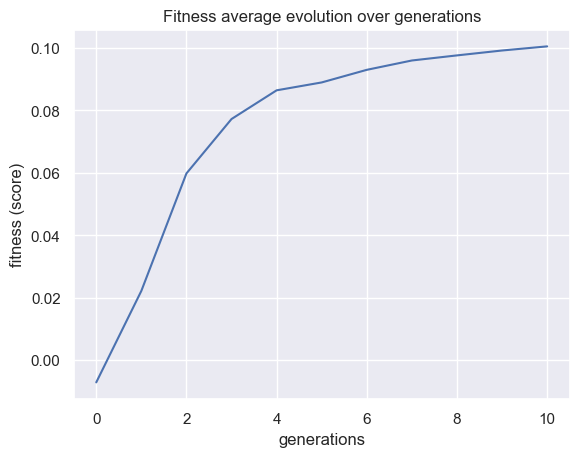

<Figure size 1000x1000 with 0 Axes>

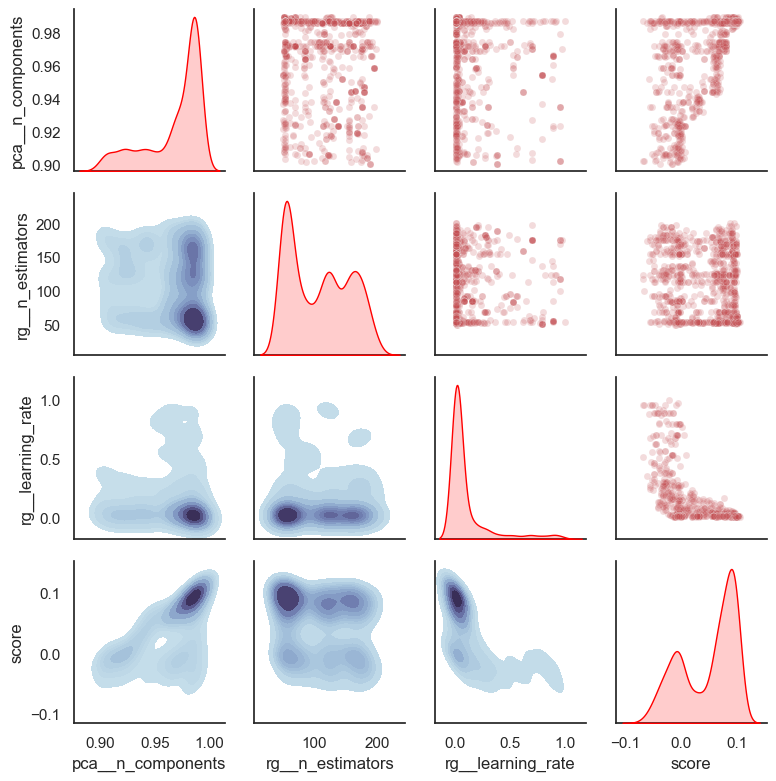

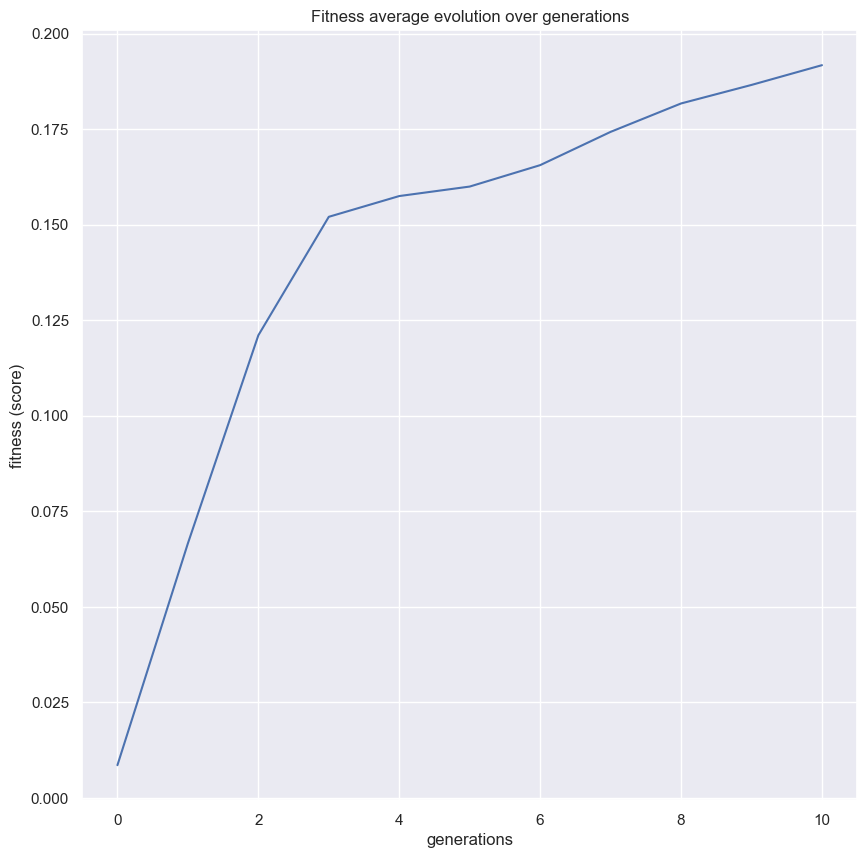

<Figure size 1000x1000 with 0 Axes>

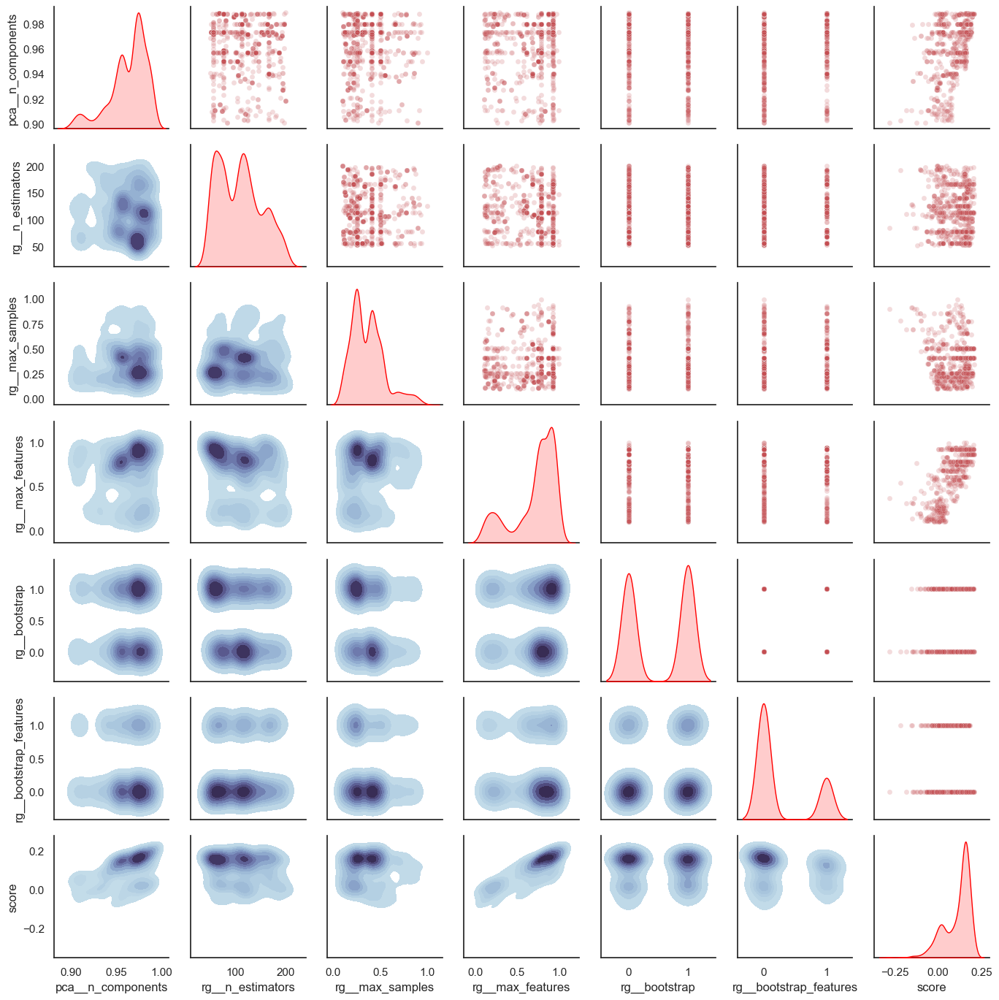

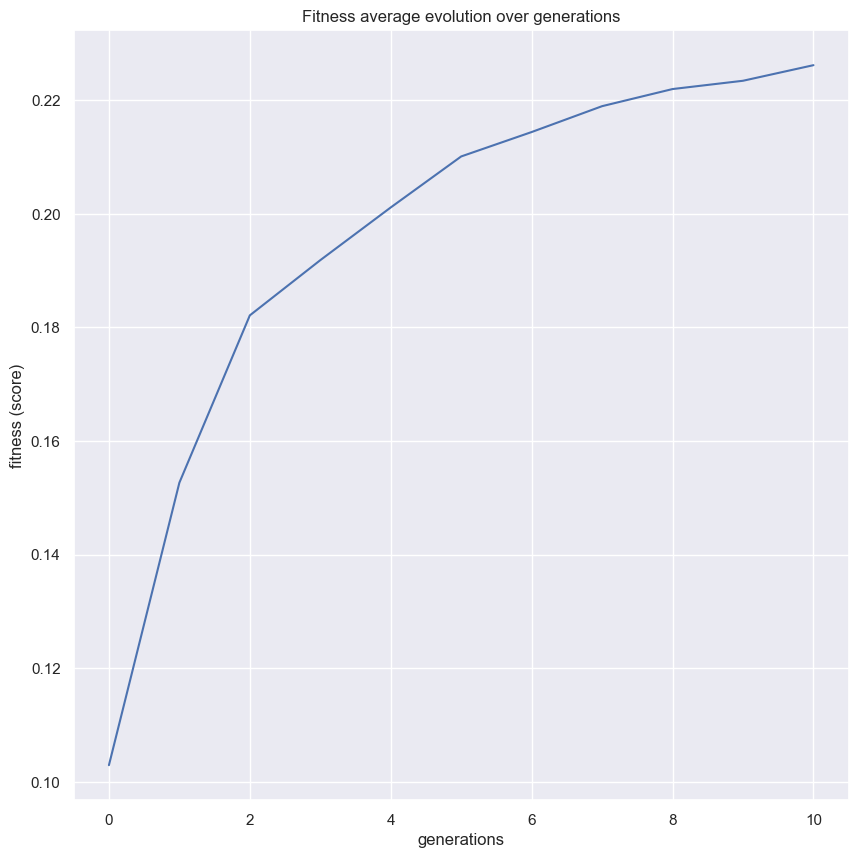

<Figure size 1000x1000 with 0 Axes>

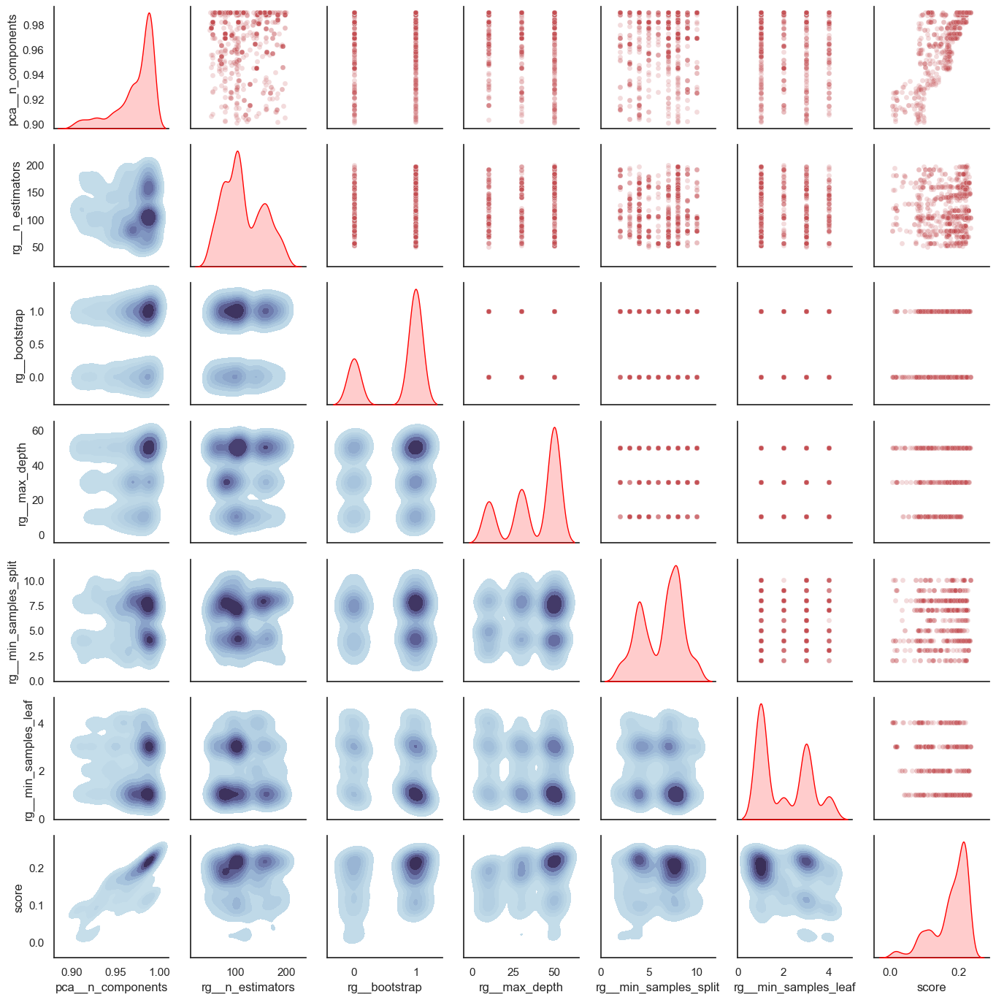

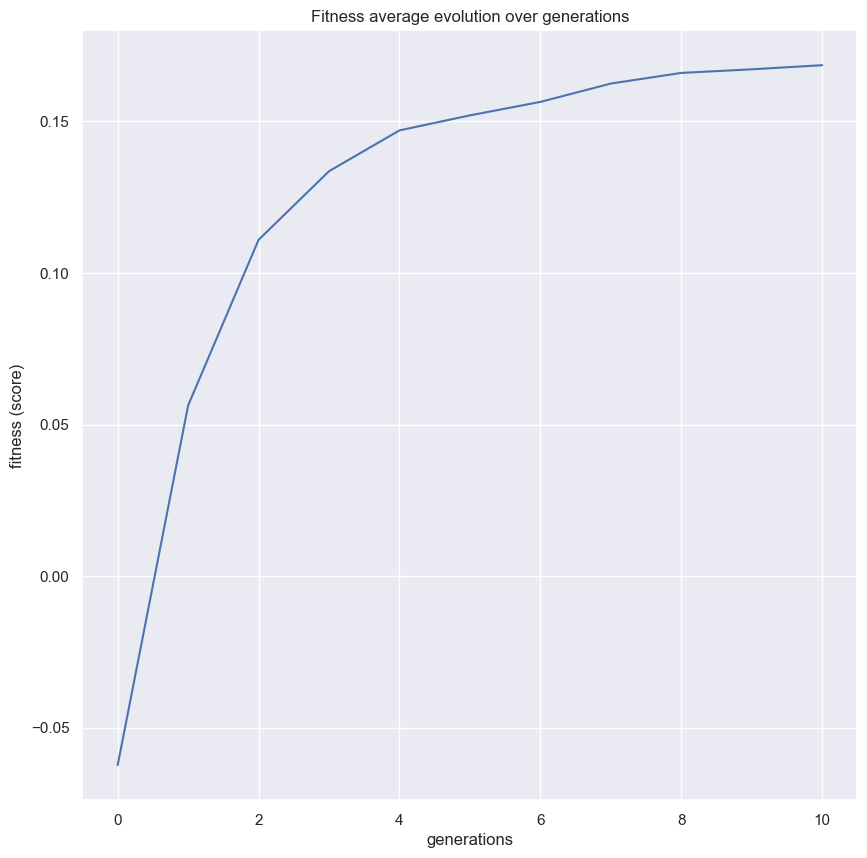

<Figure size 1000x1000 with 0 Axes>

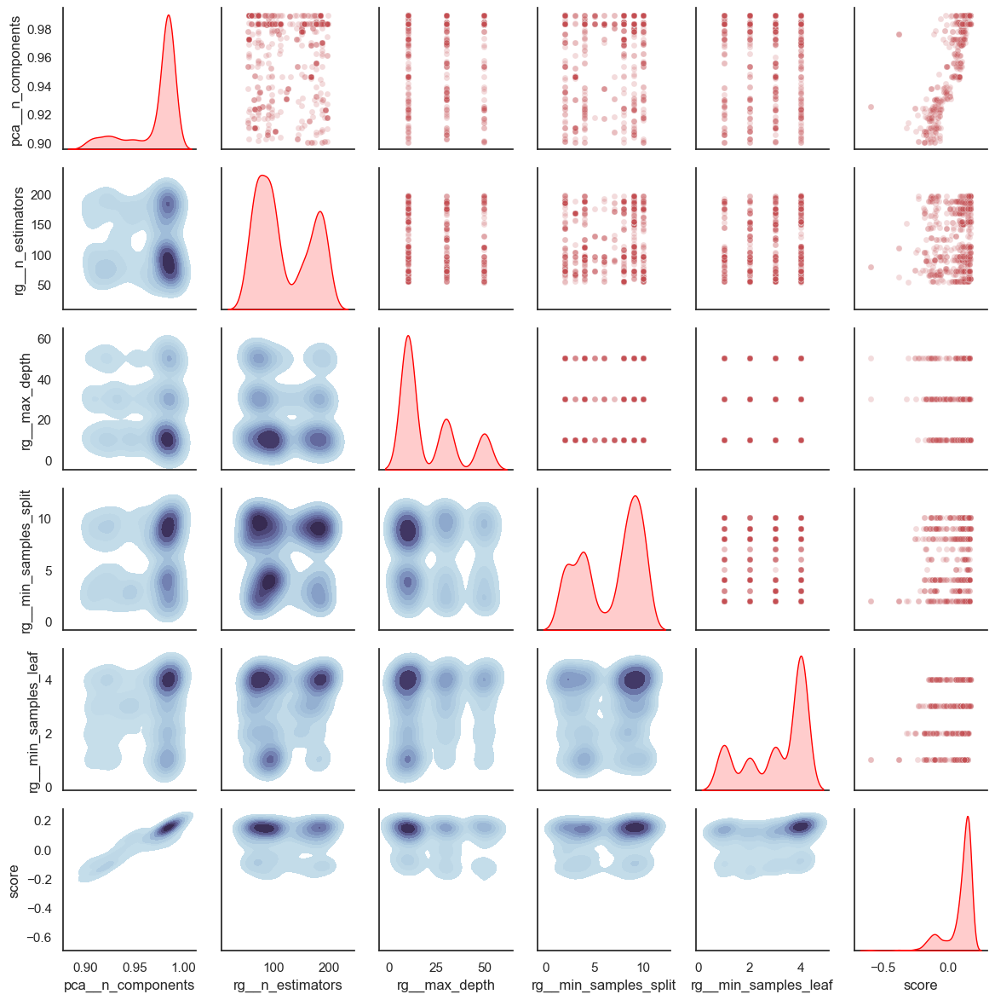

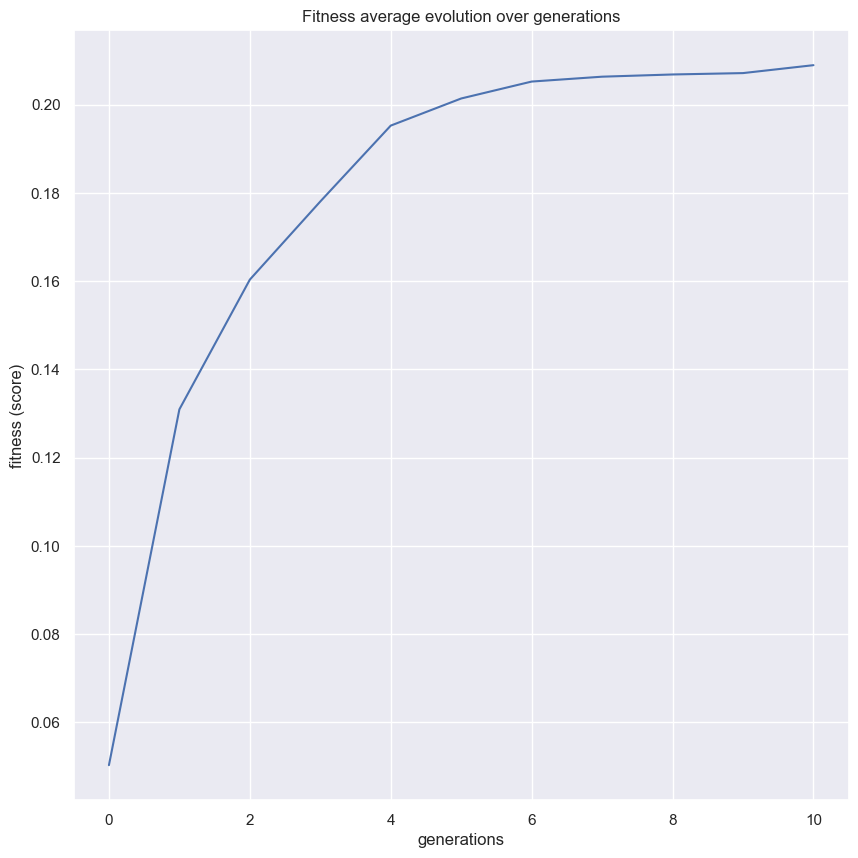

<Figure size 1000x1000 with 0 Axes>

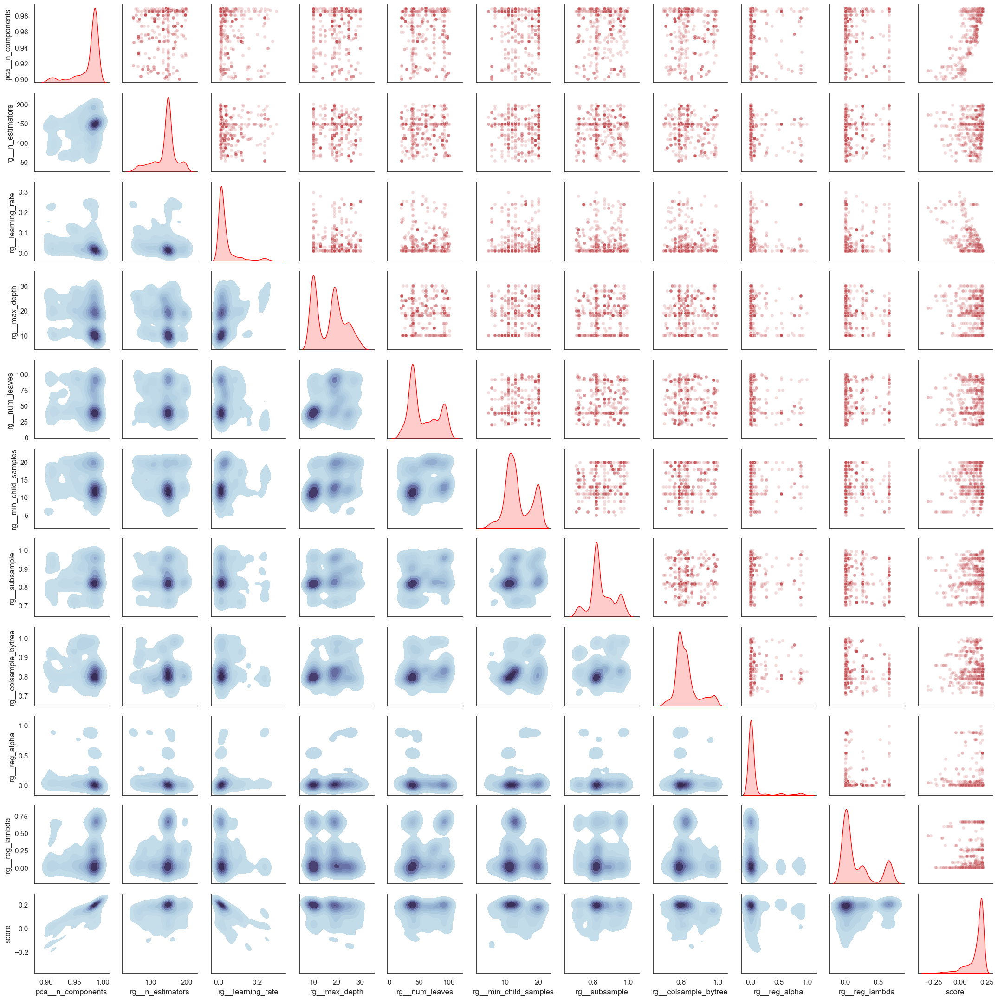

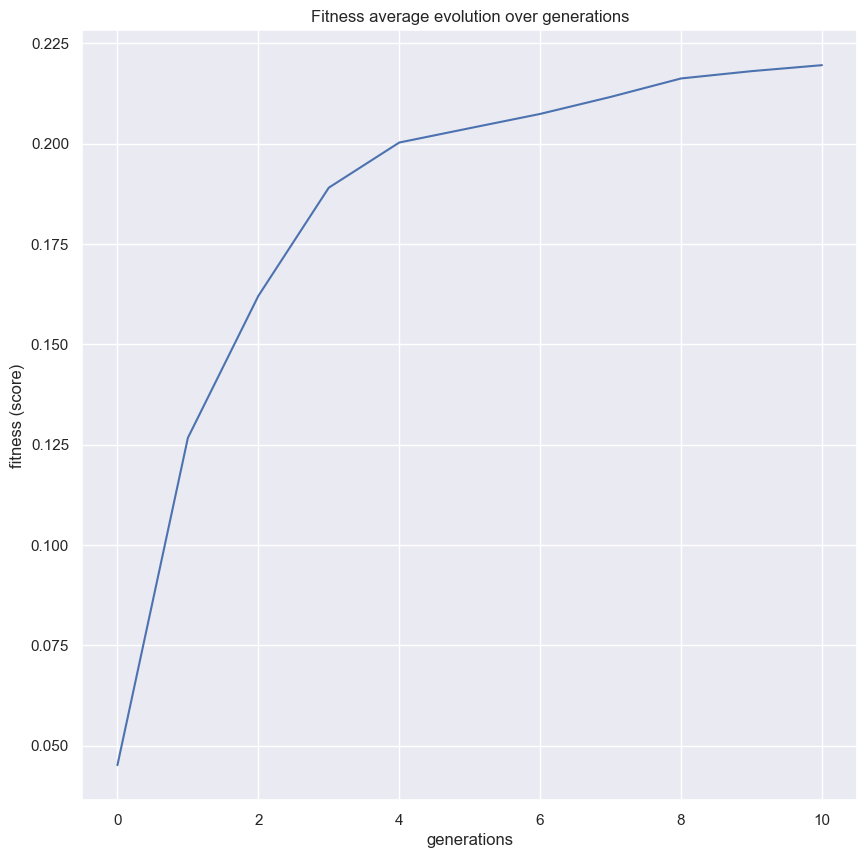

<Figure size 1000x1000 with 0 Axes>

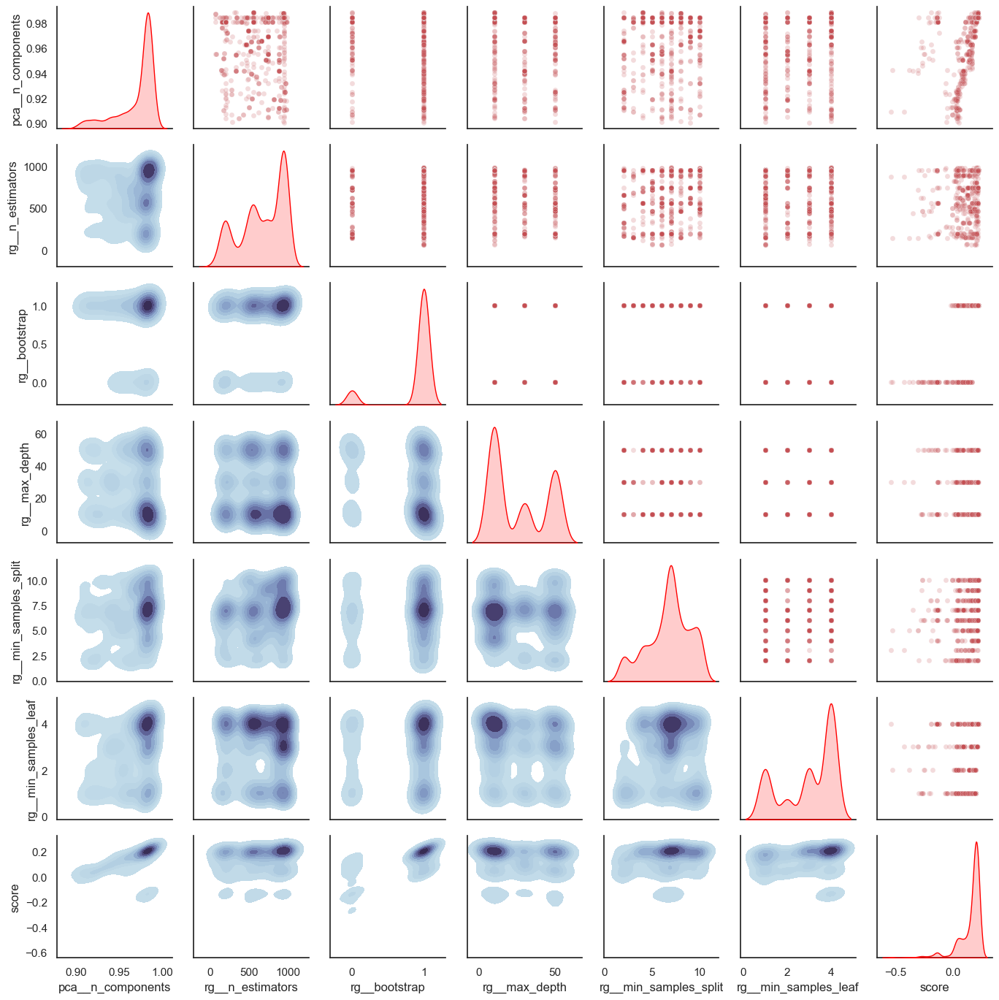

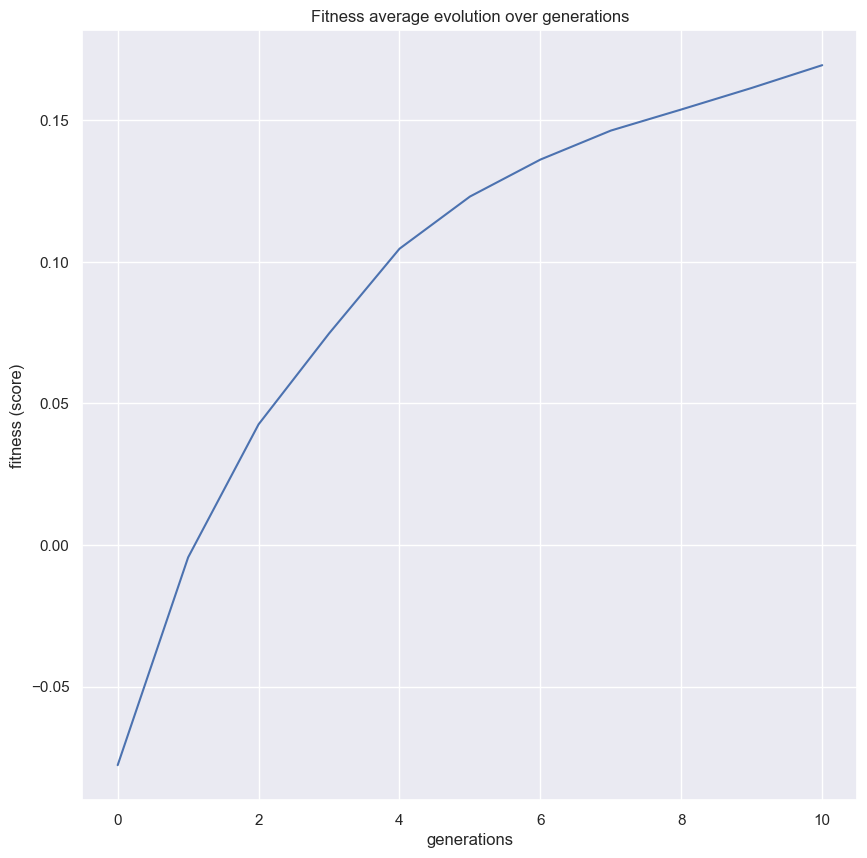

<Figure size 1000x1000 with 0 Axes>

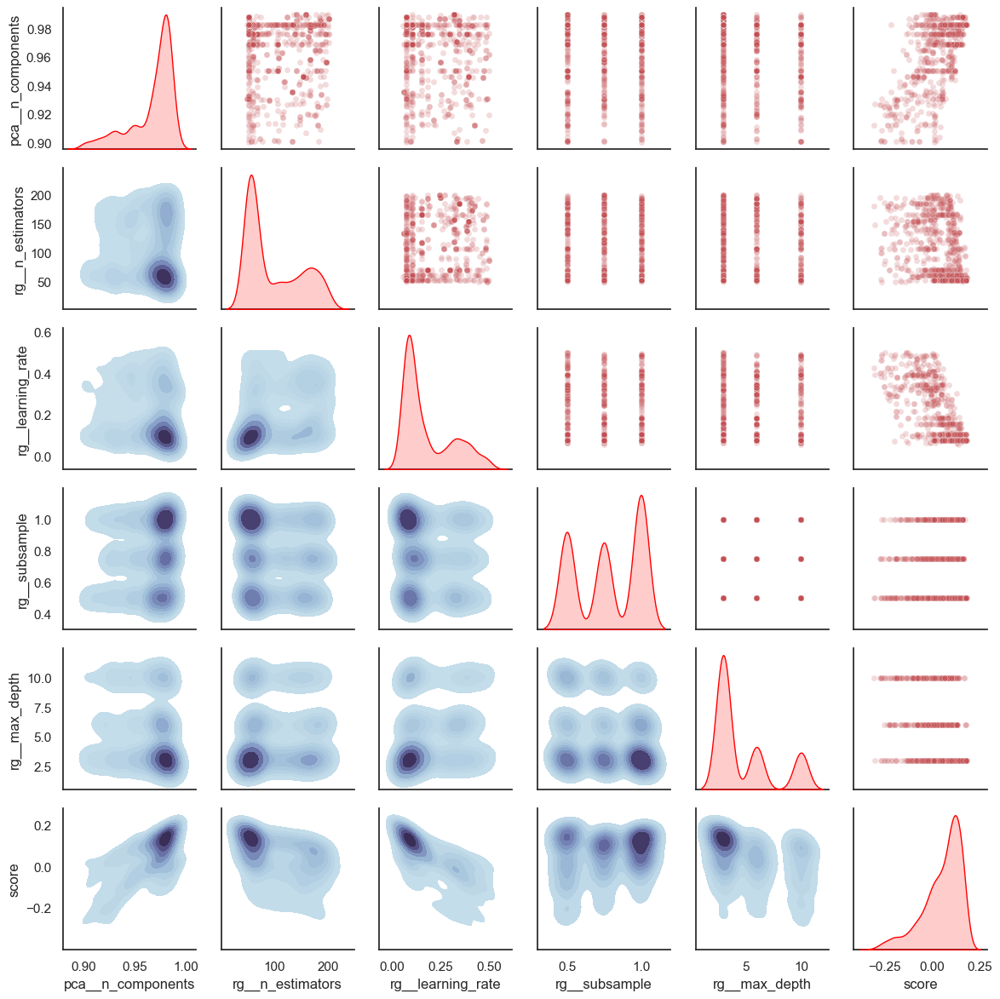

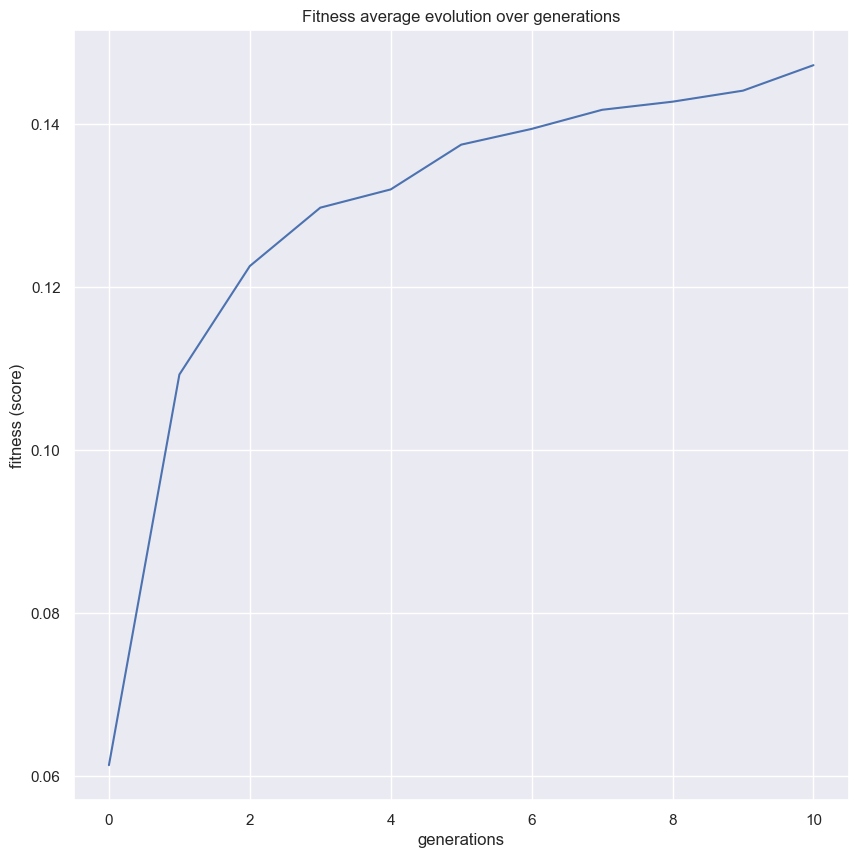

<Figure size 1000x1000 with 0 Axes>

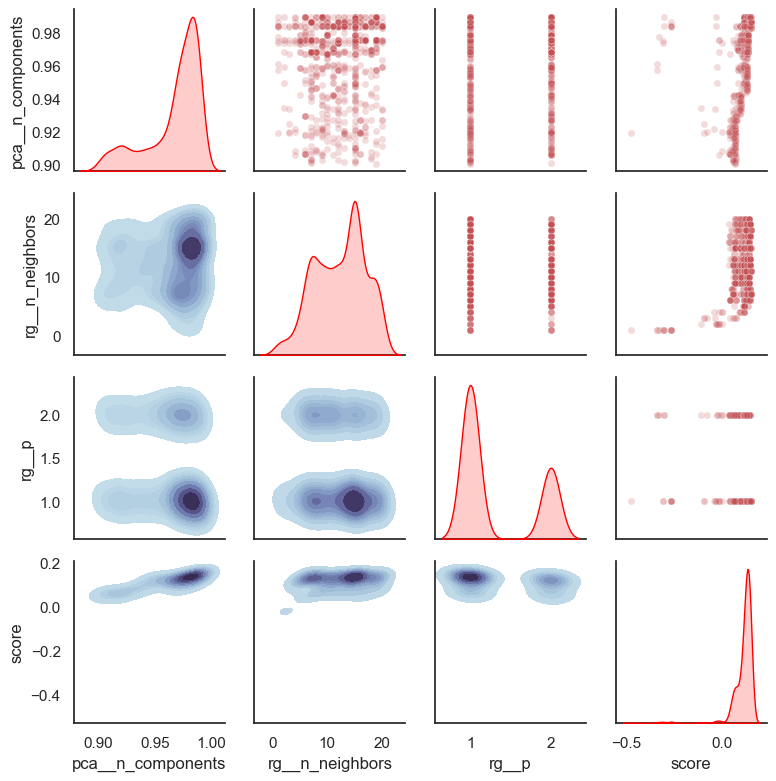

In [10]:
from sklearn.pipeline import Pipeline

mg_pca = BGModelDev("../data/data_processed/features_train.csv", "../data/data_processed/label_train.csv", models_genetic_subset_pca)
mg_pca.genetic_search("../reports/genetic_search/", -1, models_genetic_subset_pca, score='r2', generations=10, pipeline=True) ##### %Obs: take a coffee

In [11]:
mg_pca.summary_cv_scores

[{'model': 'AdaBoostRegressor',
  'mean_absolute_error': '-0.4876 ± 0.0244',
  'mean_absolute_percentage_error': '-0.1859 ± 0.0048',
  'mean_squared_error': '-0.3573 ± 0.0793',
  'root_mean_squared_error': '-0.5942 ± 0.0656',
  'r2': '0.1055 ± 0.1065',
  'explained_variance': '0.1210 ± 0.1008'},
 {'model': 'BaggingRegressor',
  'mean_absolute_error': '-0.4428 ± 0.0288',
  'mean_absolute_percentage_error': '-0.1687 ± 0.0063',
  'mean_squared_error': '-0.3169 ± 0.0707',
  'root_mean_squared_error': '-0.5597 ± 0.0601',
  'r2': '0.2082 ± 0.0637',
  'explained_variance': '0.2238 ± 0.0667'},
 {'model': 'ExtraTreesRegressor',
  'mean_absolute_error': '-0.4346 ± 0.0214',
  'mean_absolute_percentage_error': '-0.1656 ± 0.0063',
  'mean_squared_error': '-0.3051 ± 0.0632',
  'root_mean_squared_error': '-0.5496 ± 0.0555',
  'r2': '0.2357 ± 0.0612',
  'explained_variance': '0.2492 ± 0.0655'},
 {'model': 'GradientBoostingRegressor',
  'mean_absolute_error': '-0.3980 ± 0.0424',
  'mean_absolute_percen

In [14]:
mg_pca = BGModelDev("../data/data_processed/features_train.csv", "../data/data_processed/label_train.csv", models_genetic_subset_pca)
mg_pca.train_best_models("../reports/genetic_search/","genetic_search","../models/genetic_search/", pipeline=True)
mg_pca.predict("../models/genetic_search/","../data/data_processed/features_test.csv","../data/data_processed/label_test.csv")

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing pca, total=   0.3s
[Pipeline] ................ (step 3 of 3) Processing rg, total=   0.1s
[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing pca, total=   0.2s
[Pipeline] ................ (step 3 of 3) Processing rg, total=   0.2s
[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing pca, total=   0.3s
[Pipeline] ................ (step 3 of 3) Processing rg, total=   0.0s
[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing pca, total=   0.3s
[Pipeline] ................ (step 3 of 3) Processing rg, total=   1.1s
[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 3) Processing pca, total=   0.2s
[Light

In [15]:
e_pca = BGEvalModel(models_genetic_subset_pca)
#print(" -------- Results on Train --------- ")
#e.performance("../models/genetic_search/", set='train')

print(" -------- Results on Test --------- ")
e_pca.performance("../models/genetic_search/", set='test', report_location="../reports/genetic_search/")

 -------- Results on Test --------- 
Model:  AdaBoostRegressor
MAE:  0.5406451612903226
MAPE:  0.18465537847995966
MSE:  0.5033129032258066
RMSE:  0.7094454899608613
E-VAR:  0.14385982978945466
R2:  0.09846620392460892 

Model:  BaggingRegressor
MAE:  0.4655645161290322
MAPE:  0.15971074605528784
MSE:  0.37361854838709674
RMSE:  0.6112434444532692
E-VAR:  0.35937943839094
R2:  0.3307746611445782 

Model:  ExtraTreesRegressor
MAE:  0.4856451612903226
MAPE:  0.16399376349237682
MSE:  0.4433709677419354
RMSE:  0.6658610724031969
E-VAR:  0.24604952918108058
R2:  0.20583416587140635 

Model:  GradientBoostingRegressor
MAE:  0.4465322580645162
MAPE:  0.1455167212347432
MSE:  0.4464169354838709
RMSE:  0.6681443971806326
E-VAR:  0.2701321335776269
R2:  0.200378230123464 

Model:  LGBMRegressor
MAE:  0.5013709677419355
MAPE:  0.170594187767925
MSE:  0.48265887096774196
RMSE:  0.6947365478854138
E-VAR:  0.1697249665431525
R2:  0.13546169517177586 

Model:  RandomForestRegressor
MAE:  0.473145161

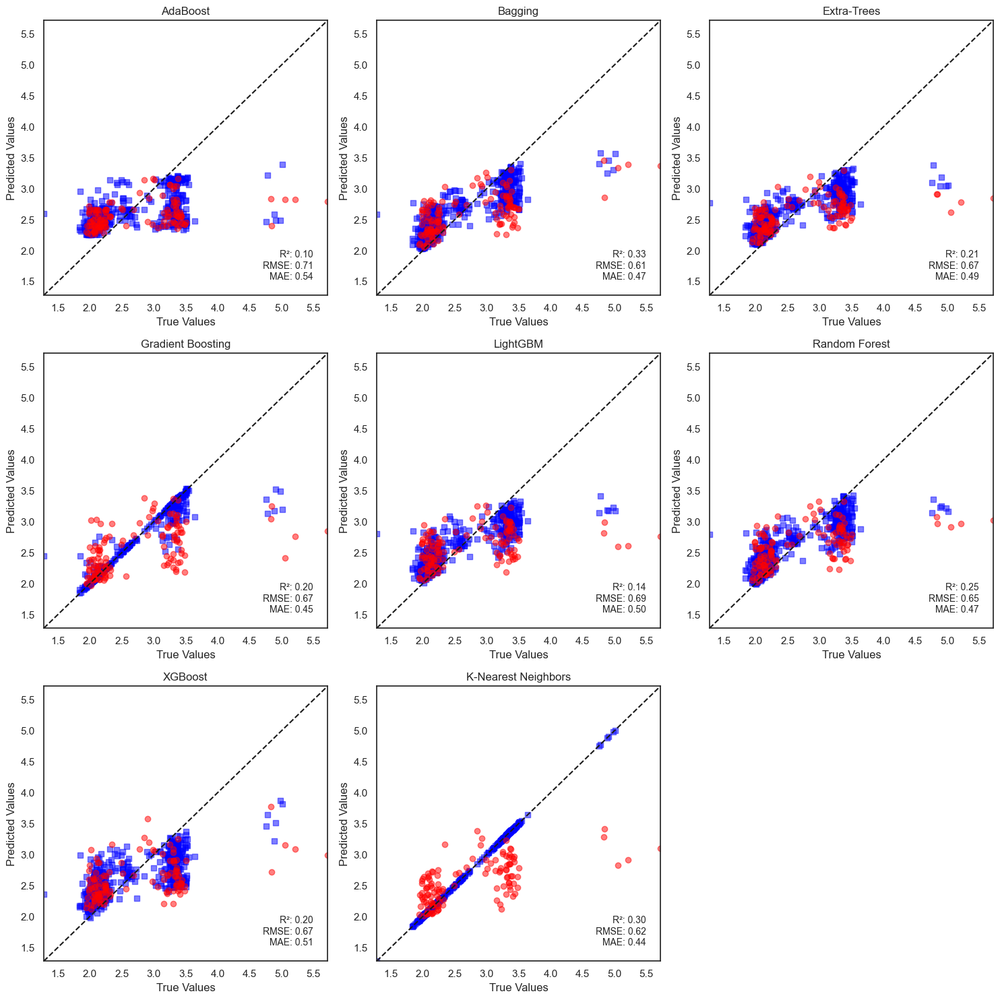

In [57]:
e_direct = BGEvalModel(models_genetic_subset_pca)
e_direct.plotBG("../models/genetic_search/", "../data/data_processed/")

# Manual Bandgap estimation

In [ ]:

def manual_bg(s):
    x = dx1_round


    for index, row in s.features_train.reset_index().drop('index', axis=1).iloc[300:311,:].iterrows():
        y_smooth = savgol_filter(row, 51, 3)

        dy = np.diff(y_smooth, 1)
        dx = np.diff(x, 1)
        dydx_smooth = savgol_filter(dy / dx, 101, 3)
        maxindex = np.argmax(dydx_smooth)

        x_linear = x[maxindex - 10: maxindex + 10]
        y_linear = y_smooth[maxindex - 10: maxindex + 10]
        a, b, r_value, p_value, stderr = linregress(x_linear, y_linear)
        E_bandgap = round(-b/a, 2)

        visualization_x = np.linspace(E_bandgap, x[maxindex-60], 2)
        print(index)
        plt.scatter(E_bandgap, 0, marker='x', color='k', label="Bandgap = " + str(E_bandgap) + "eV" + "REF:" + str(s.label_train.iloc[index]))

        plt.plot(x, y_smooth)
        plt.plot(x[:-1], dydx_smooth,'k-.')
        plt.plot(visualization_x, f(visualization_x, a, b), color='red')
        plt.xlabel("Energia")
        plt.ylabel("$(alpha h nu)^2$")
        plt.title("Tauc plot")
        plt.legend()
        plt.grid()
        plt.show()

In [56]:
#data = np.concatenate([dx1_round, ])
data = s.features_train.T.iloc[:,:-1].reset_index()
data.rename(columns={'index':'eV'}, inplace=True)
data

,eV,48,418,20,457,370,612,499,199,472,...,430,424,276,27,376,141,138,246,66,406
0,1.127,0.017706,0.191924,0.023533,8.558849,0.854691,1.526578,1.217960,0.356007,15.637619,...,0.521909,0.552884,3.909260,0.030116,0.581705,0.922603,0.857922,3.406056,0.006311,0.301506
1,1.133,0.021236,0.172468,0.015363,8.558849,0.562486,1.510370,3.446781,0.716835,15.817903,...,0.569332,0.206643,0.886750,0.038630,0.418593,0.554379,0.479108,3.406056,0.002798,0.245930
2,1.139,0.026703,0.181682,0.030805,9.131609,0.181652,1.126853,1.828354,1.512039,7.254789,...,0.383981,0.477070,0.659854,0.014767,0.460221,0.586264,0.216579,2.897659,0.003403,0.360722
3,1.144,0.016057,0.276041,0.017540,9.096957,0.247683,1.045688,3.394959,0.688854,5.283754,...,0.401337,0.283642,0.923486,0.013090,0.298163,0.226805,0.332090,3.406056,0.003253,0.375614
4,1.150,0.028740,0.371543,0.017752,8.763864,0.310661,0.812000,4.736411,0.782035,7.860753,...,0.471546,0.277971,1.285481,0.024727,0.266102,0.514018,0.324236,4.673993,0.007915,0.276347
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
896,6.177,367.279109,435.485519,219.635983,717.895340,710.133043,507.967073,1015.028294,732.927364,295.946627,...,397.476904,328.675435,586.614744,328.544306,436.082631,232.924224,250.525892,566.338238,220.182721,540.937441
897,6.183,362.564609,436.833900,220.564281,722.126715,707.466794,504.612975,975.091296,747.880934,295.489296,...,393.990917,328.531872,588.453246,329.329655,431.968376,233.366027,251.559610,565.932711,216.747056,544.901578
898,6.189,357.850109,438.182281,221.492578,726.358091,704.800545,501.258877,935.154298,762.834505,295.031965,...,390.504929,328.388310,590.291748,330.115004,427.854120,233.807830,252.593327,565.527184,213.311390,548.865714
899,6.194,353.135609,439.530662,222.420876,730.589467,702.134297,497.904779,895.217299,777.788075,294.574634,...,387.018941,328.244748,592.130250,330.900354,423.739865,234.249633,253.627045,565.121657,209.875725,552.829850


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
[0, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]
[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[0, 1, 2, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
[1, 2, 3, 4

g:\My Drive\Articulos Nuevos\idea - Leo estimacion eV con ML\Code - Normalized and PCA\notebooks\extractor.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(3, 2))


[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
[2, 3, 4, 5, 6, 7, 8, 9, 10]
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
[0, 1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17

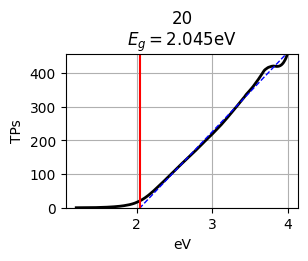

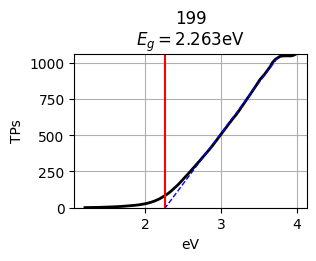

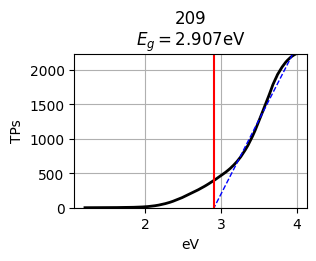

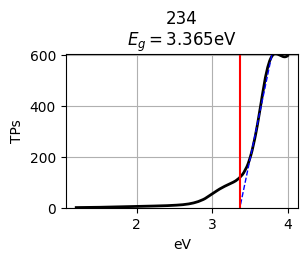

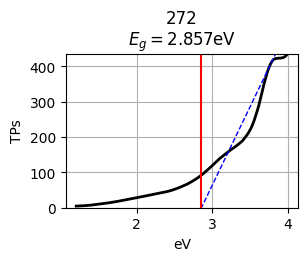

...

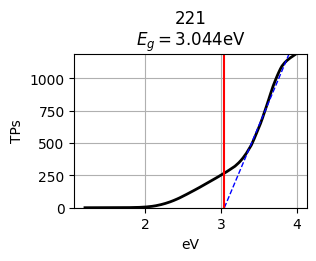

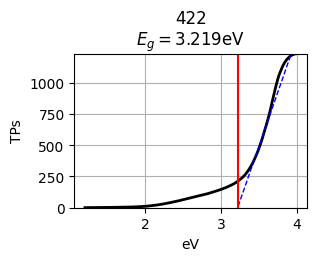

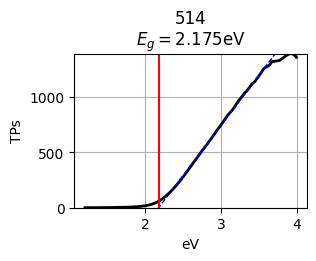

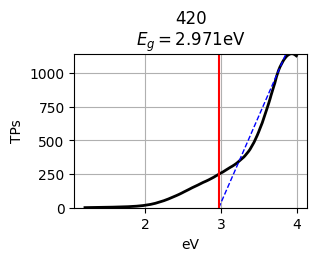

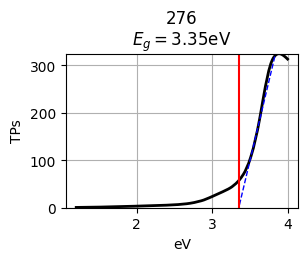

In [63]:
import extractor

datapath = ""
bg_metodo_estractor = extractor.autoextract(data=data, csvname='example-output',
                      savepath=datapath+'example-output\\', verbose=False)

In [96]:

idx_extractor = bg_metodo_estractor.columns
idx_train = s.label_train.index
np.setdiff1d(idx_train, idx_extractor)
np.setdiff1d(idx_extractor, idx_train)


array([], dtype=object)

Performance:

In [106]:
r2_score(s.label_train[idx_extractor], np.nan_to_num(bg_metodo_estractor.values.reshape(-1)))

-13.431136598615854

In [124]:
# let's leave only the ones he was able to find
col_sin_nan = bg_metodo_estractor.columns[~bg_metodo_estractor.isna().any()].tolist()
bg_metodo_estractor[col_sin_nan]

r2_score(s.label_train[col_sin_nan], np.nan_to_num(bg_metodo_estractor[col_sin_nan].values.reshape(-1)))


-0.8509168233100672